In [1]:
import os
import pickle
import numpy as np
import pandas as pd
import seaborn as sns
from tabulate import tabulate
from utils.hyperparams import get_kaam_hyperparameters
from utils.paths import get_experiment_paths
from utils.stats import get_p_values_from_table_data
from datasets.synthetic import graph_data
import matplotlib.pyplot as plt

# CONTINUOUS EXPERIMENT

In [2]:
datasets = ['3-chain-linear', '3-chain-non-linear', '4-chain-linear', '5-chain-linear', 'collider-linear', 'fork-linear', 'fork-non-linear', 'simpson-non-linear', 'simpson-symprod', 'triangle-linear', 'triangle-non-linear']  # Datasets used for evaluation
n = 1000  # Number of samples
model_names = ['kan', 'kaam', 'anm', 'dbcm', 'flow']  # Models used for evaluation
metrics = ['rf_acc_obs', 'mmd_obs', 'rf_acc_int', 'mmd_int', 'mse_cf', 'mae_cf']  # Metrics used for evaluation
kaam_metrics = ['mae_uniform', 'mae_weighted']  # Additional metrics for KAAM (goodness of fit of the formula)

results_bdir = str(get_experiment_paths('continuous').root)
data_dir = os.path.join(results_bdir, 'data')

results_table_kaam = []  # Dataset, n, node, kaam metrics, formula, formula_gt, training time
results_table_all = []  # Dataset, n, metrics and times per model
metrics_array = np.zeros((len(model_names), len(metrics), len(datasets)))  # model, metric, dataset*n

names_not_kaam = ['training_time', 'model'] + [m + '_avg' for m in metrics] + ['rf_acc_int_all', 'mmd_int_all', 'mse_cf_all', 'mae_cf_all']  # Names of results that are not node-specific and not KAAM-specific

for i_d, dataset in enumerate(datasets):
    for i_m, model_name in enumerate(model_names):
        results_file = os.path.join(data_dir, f"{dataset}_results_n_{n}_{model_name}.pkl")
        if os.path.exists(results_file):
            with open(results_file, 'rb') as f:
                results = pickle.load(f)
            # Prepare KAAM detailed table
            for node, r in results.items():
                if node not in names_not_kaam and model_name == 'kaam':
                    results_table_kaam.append([dataset, node] + [str(r[m]) for m in kaam_metrics] + [str(r['formula']), str(r['formula_gt']), results['training_time']])
            # Prepare all models summary table
            try:
                results_table_all.append([dataset, model_name] + [results[m + '_avg'] for m in metrics] + [results['training_time']])
            except:
                print('a')
            # Fill metrics array for statistical analysis
            for imetric, m in enumerate(metrics):
                if results[m + '_avg'] is None:
                    metrics_array[i_m, imetric, i_d] = 100  # Assign a high value if the metric is None
                else:
                    metrics_array[i_m, imetric, i_d] = results[m + '_avg']
        else:
            print(f"Results file {results_file} not found.")
print('\n\n Average results per dataset (all models):')
print(tabulate(results_table_all, headers=['Dataset', 'model'] + metrics + ['Time '], floatfmt=".4f", tablefmt="fancy_grid"))

# Compute a new table, where we compute average and std for each dataset
results_table_avg = []
for model_name in model_names:
    data_to_average = []
    for row in results_table_all:
        if row[1] == model_name:
            data_to_average.append(row[2:])
    data_to_average = np.array(data_to_average)
    mean = np.mean(data_to_average, axis=0)
    std = np.std(data_to_average, axis=0)
    string_row = [model_name] + [f'{mean[i]:.6f} ({std[i]:.6f})' for i in range(len(mean))]
    results_table_avg.append(string_row)

print('\n\n Average results per dataset (all models, average and std):')
print(tabulate(results_table_avg, headers=['Model'] + metrics + ['Time '], floatfmt=".4f", tablefmt="latex"))

#Statistical analysis
print(f'\n\n STATISTICAL ANALYSYS FOR ALL METRICS')
get_p_values_from_table_data(metrics_array, alpha=0.05, higher_is_better=False, output_latex=True, list_of_methods=model_names, list_of_metrics=metrics)
# Joint statistical analysis
for i in range(3):
    metrics_idxs = (i * 2, i * 2 + 1)
    metric_names = [metrics[i] for i in metrics_idxs]
    print(f'\n\n STATISTICAL ANALYSYS FOR METRICS {metric_names}')
    get_p_values_from_table_data(metrics_array[:, metrics_idxs, :], alpha=0.05, higher_is_better=False, output_latex=True, list_of_methods=model_names, list_of_metrics=metric_names)

print('\n\n Detailed results per node (KAAM):')
print(tabulate(results_table_kaam, headers=['Dataset', 'Node' ] + kaam_metrics + ['Formula', 'Formula GT', 'Training Time (s)'], floatfmt=".4f", tablefmt="fancy_grid"))




 Average results per dataset (all models):
╒═════════════════════╤═════════╤══════════════╤═══════════╤══════════════╤═══════════╤══════════╤══════════╤═════════╕
│ Dataset             │ model   │   rf_acc_obs │   mmd_obs │   rf_acc_int │   mmd_int │   mse_cf │   mae_cf │   Time  │
╞═════════════════════╪═════════╪══════════════╪═══════════╪══════════════╪═══════════╪══════════╪══════════╪═════════╡
│ 3-chain-linear      │ kan     │       0.5075 │    0.0008 │       0.5200 │    0.0021 │   0.0044 │   0.0324 │  3.5709 │
├─────────────────────┼─────────┼──────────────┼───────────┼──────────────┼───────────┼──────────┼──────────┼─────────┤
│ 3-chain-linear      │ kaam    │       0.5075 │    0.0008 │       0.5221 │    0.0022 │   0.0044 │   0.0324 │  3.3140 │
├─────────────────────┼─────────┼──────────────┼───────────┼──────────────┼───────────┼──────────┼──────────┼─────────┤
│ 3-chain-linear      │ anm     │       0.5325 │    0.0009 │       0.5350 │    0.0021 │   0.0001 │   0.0061 │  0.00

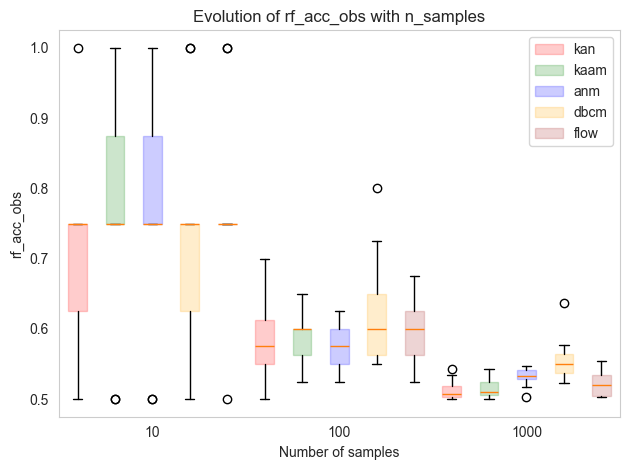

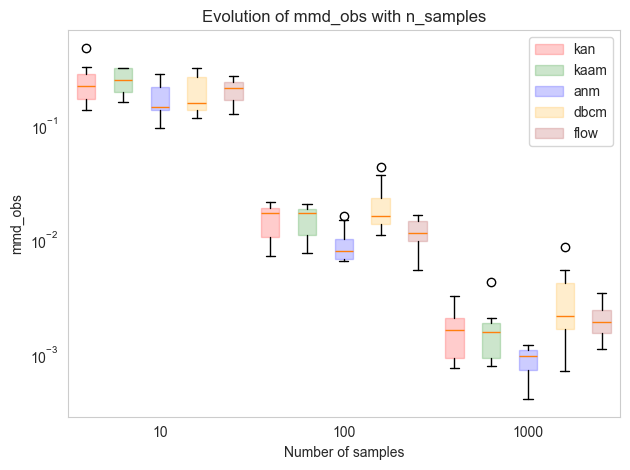

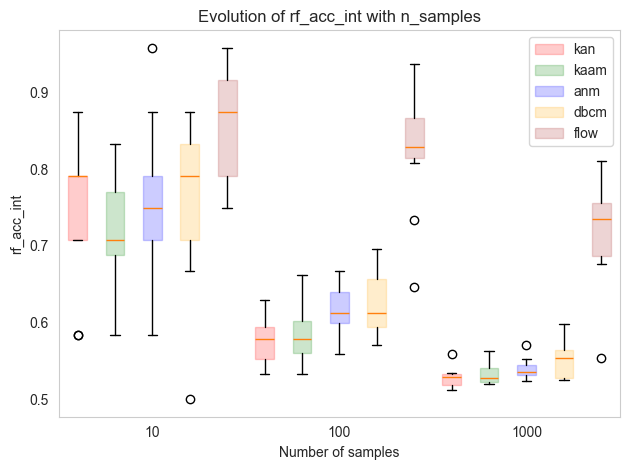

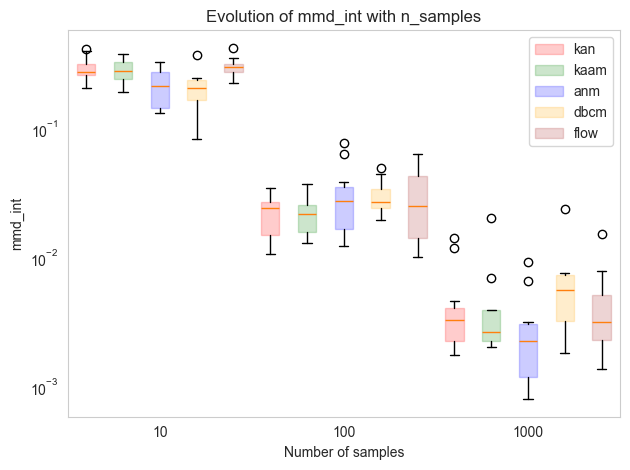

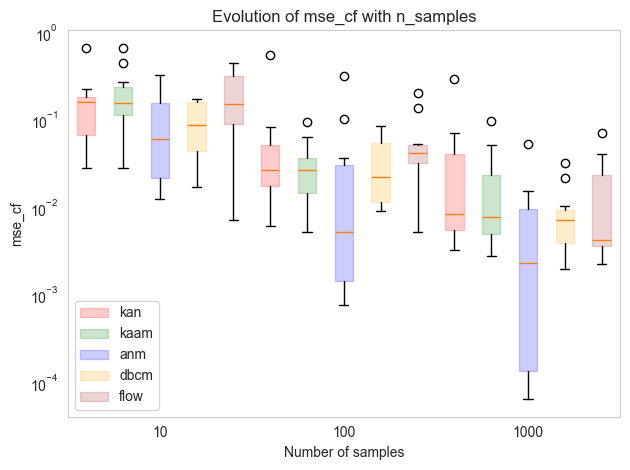

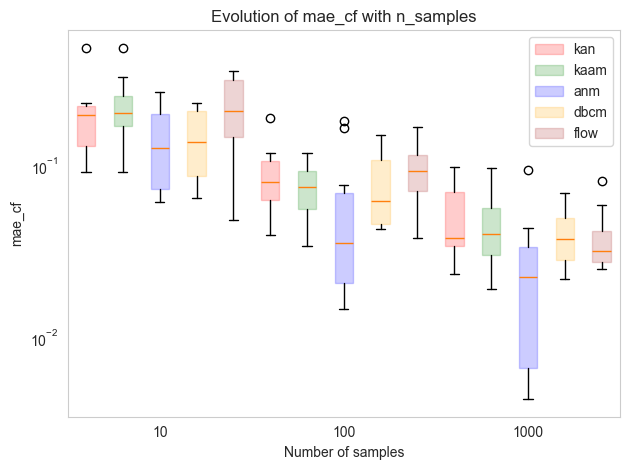

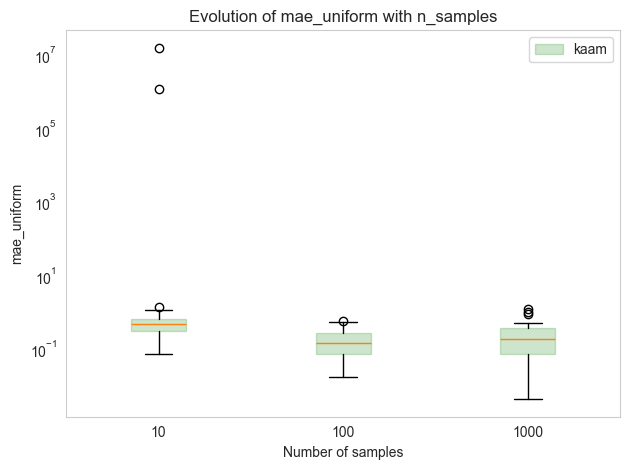

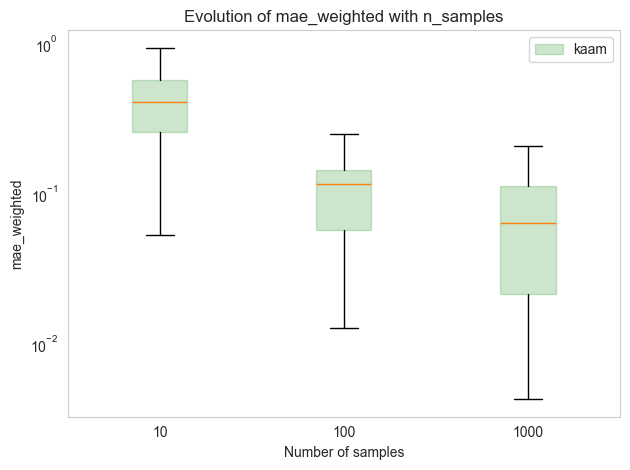

In [3]:
# Evolution of metrics with the sample size
datasets = ['3-chain-linear', '3-chain-non-linear', '4-chain-linear', '5-chain-linear', 'collider-linear', 'fork-linear', 'fork-non-linear', 'simpson-non-linear', 'simpson-symprod', 'triangle-linear', 'triangle-non-linear']  # Datasets used for evaluation
n_samples = [10, 100, 1000]
model_names = ['kan', 'kaam', 'anm', 'dbcm', 'flow']  # Models used for evaluation
metrics = ['rf_acc_obs', 'mmd_obs', 'rf_acc_int', 'mmd_int', 'mse_cf', 'mae_cf']  # Metrics used for evaluation
kaam_metrics = ['mae_uniform', 'mae_weighted']  # Additional metrics for KAAM (goodness of fit of the formula)
colors = {'kan': 'r', 'kaam': 'g', 'anm': 'b', 'dbcm': 'orange', 'flow': 'brown'}
names_not_kaam = ['training_time', 'model'] + [m + '_avg' for m in metrics] + ['rf_acc_int_all', 'mmd_int_all', 'mse_cf_all', 'mae_cf_all']  # Names of results that are not node-specific and not KAAM-specific

results_bdir = str(get_experiment_paths('continuous').root)
data_dir = os.path.join(results_bdir, 'data')

results_metrics = {}

for n in n_samples:
    results_metrics[str(n)] = {}
    for i_m, model_name in enumerate(model_names):
        results_metrics[str(n)][model_name] = {}
        for metric in metrics:
            results_metrics[str(n)][model_name][metric] = []
            if model_name == 'kaam':
                for kaam_metric in kaam_metrics:
                    results_metrics[str(n)][model_name][kaam_metric] = []
        for i_d, dataset in enumerate(datasets):
            results_file = os.path.join(data_dir, f"{dataset}_results_n_{n}_{model_name}.pkl")
            if os.path.exists(results_file):
                with open(results_file, 'rb') as f:
                    results = pickle.load(f)
                # Add KAAM metrics
                for kaam_metric in kaam_metrics:
                    for node, r in results.items():
                        if node not in names_not_kaam and model_name == 'kaam' and r[kaam_metric] is not None: # Note that None are source nodes, we do not include them here as they do not train a model
                            results_metrics[str(n)][model_name][kaam_metric].append(r[kaam_metric])
                # Add the rest of metrics
                for metric in metrics:
                    results_metrics[str(n)][model_name][metric].append(results[metric + '_avg'])
            else:
                print(f"Results file {results_file} not found.")
# Prepare for plotting
for metric in metrics + kaam_metrics:
    if metric in kaam_metrics:
        ms = ['kaam']
    else:
        ms = model_names
    positions = np.arange(len(n_samples)) * len(ms)
    for im, model in enumerate(ms):
        plt.boxplot([results_metrics[str(n)][model][metric] for n in n_samples], positions=positions + im, patch_artist=True, boxprops=dict(facecolor=colors[model], color=colors[model], alpha=0.2), label=model)
    plt.xticks(positions + (len(ms) - 1)/2, n_samples)
    plt.xlabel('Number of samples')
    plt.ylabel(metric)
    plt.legend(loc='best')
    plt.title(f'Evolution of {metric} with n_samples')
    if 'mmd' in metric or 'mse' in metric or 'mae' in metric:
        plt.yscale('log')
    plt.grid()
    plt.tight_layout()
    plt.show()



In [4]:
import copy
results_continuous = copy.deepcopy(results_metrics)

C:\Users\Alex\AppData\Local\Temp\ipykernel_23728\510649135.py:93: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


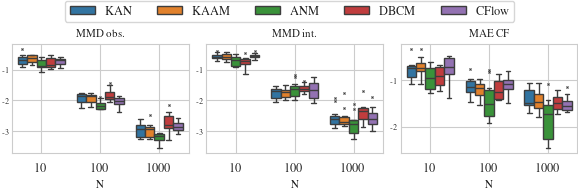

In [10]:
def nested_dict_to_df(results_dict):
    rows = []
    for n, methods in results_dict.items():          # e.g. '10', '100', ...
        for method, metrics in methods.items():      # e.g. 'anm', 'dbcm', ...
            for metric, values in metrics.items():   # e.g. 'mae_cf', 'mmd_int', ...
                for run_id, v in enumerate(values):
                    rows.append({
                        "N": int(n),
                        "Model": method,
                        "Metric": metric,
                        "run": run_id,
                        "value": v,
                    })
    return pd.DataFrame(rows)


results_df = nested_dict_to_df(results_continuous)
def exp_formatter(y, _):
    if y <= 0:
        return ""
    exp = int(np.round(np.log10(y)))
    return f"{exp}"

from tueplots import bundles
from matplotlib.ticker import FuncFormatter, LogLocator
with plt.rc_context({**bundles.icml2024(ncols=3)}):
    fig, axs = plt.subplots(1,3, figsize = (6, 1.85))
    # map the names of the metric as follows:
    metrics_map = {
    "mmd_obs": "MMD obs.",
    "rf_obs": "RF acc. obs.",
    "mmd_int": "MMD int.",
    "rf_int": "RF acc. int.",
    "ate_error": "ATE error",
    "mae_cf": "MAE CF",
    "mse_cf": "MSE CF",
    "hsic": "HSIC",
    "dhsic": "dHSIC",
    }

    model_map = {'kan': 'KAN',
                 'kaam': 'KAAM',
                 'anm': 'ANM',
                 'dbcm': 'DBCM',
                 'flow': 'CFlow',
                 }
    results_df['Metric'] = results_df['Metric'].map(metrics_map)
    results_df['Model'] =  results_df['Model'].map(model_map)
    metrics_to_plot = ['MMD obs.', 'MMD int.', 'MAE CF']
    flierprops = dict(
    marker='x',
    markersize=1.5,      # smaller size
    markeredgewidth=0.7
)
    for ii, metric in enumerate(metrics_to_plot):
        sns.boxplot(data=results_df[results_df['Metric'] == metric],
                    x='N', y='value', hue='Model',
                    ax=axs[ii],
                    flierprops=flierprops
                    )
        axs[ii].set_yscale("log")
    axs[0].legend()
    handles, labels = axs[0].get_legend_handles_labels()
    # remove legends
    for ax in axs:
        ax.legend().remove()
        ax.tick_params(axis='y', which='major', pad=-1)
        ax.tick_params(axis='x', labelsize=9)
        ax.yaxis.set_major_locator(LogLocator(base=9))
        ax.yaxis.set_major_formatter(FuncFormatter(exp_formatter))



    axs[1].sharey(axs[0])
    # axs[1].set_yticklabels([])

    for ax, metric in zip(axs.flat, metrics_to_plot):
        ax.set_ylabel('')
        ax.set_title(metric)
        ax.grid(True)

    # single legend above the plots with frame
    fig.legend(
        handles, labels,
        loc="upper center",
        bbox_to_anchor=(0.5, 1.12),
        ncol=5,
        frameon=True,
        fontsize= 9

    )

    plt.tight_layout()
    plt.subplots_adjust(wspace=0.1)
    plt.savefig(get_experiment_paths("paper").figures / "continuous_results.pdf", dpi=300, bbox_inches="tight")
    plt.show()

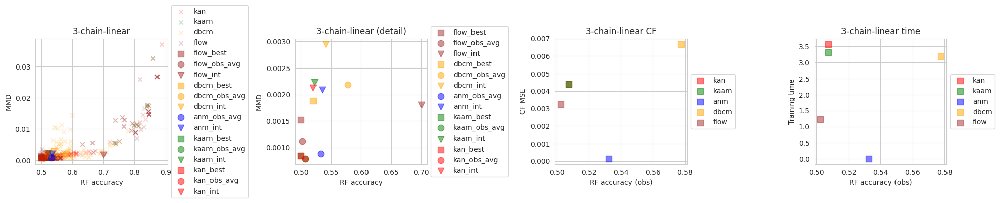

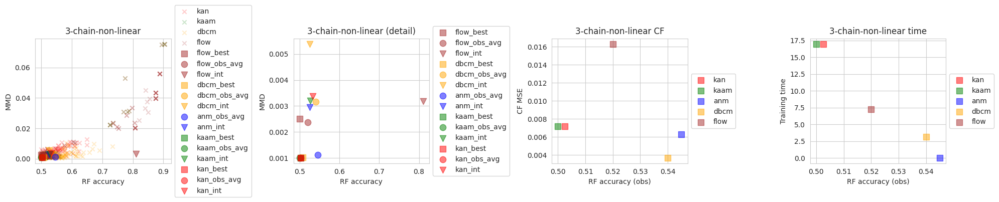

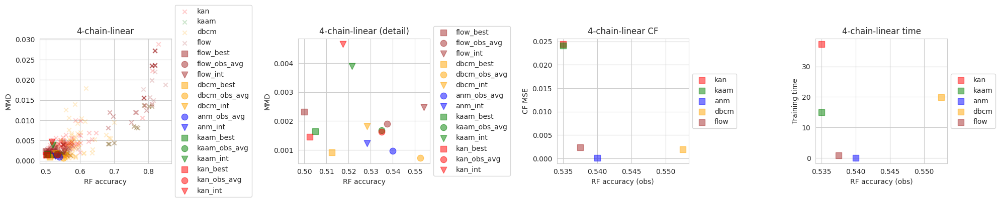

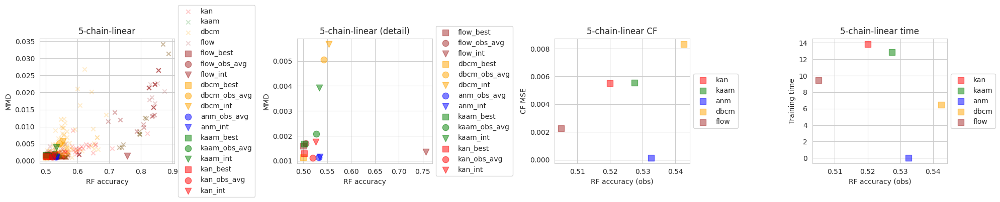

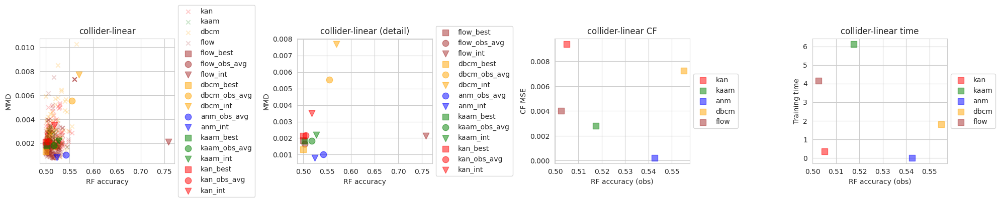

...

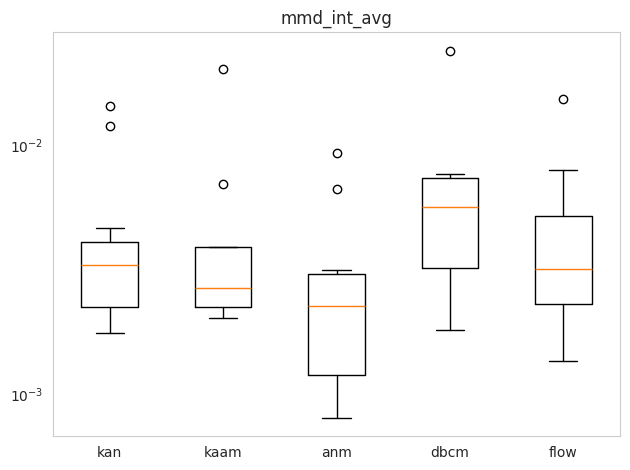

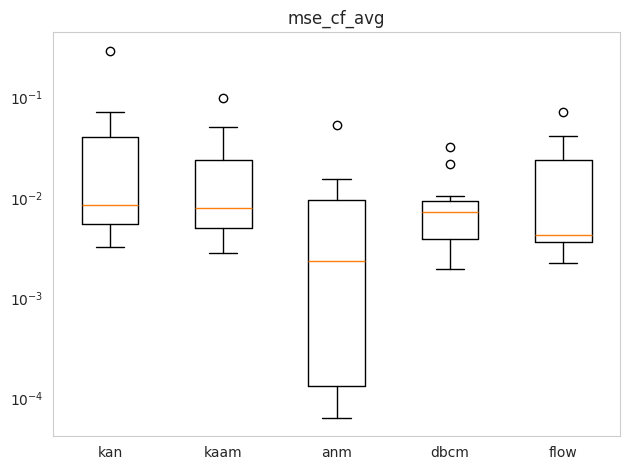

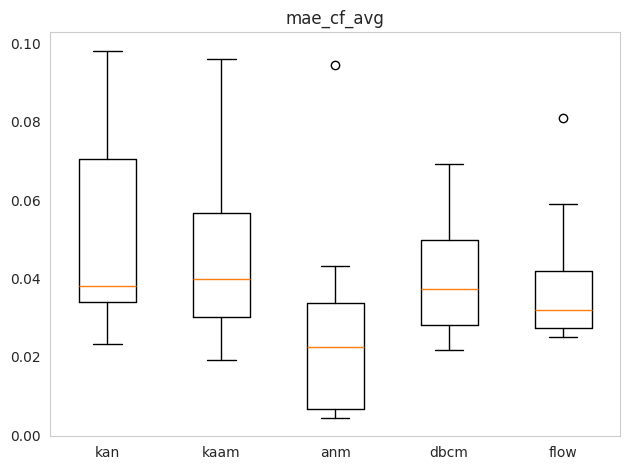

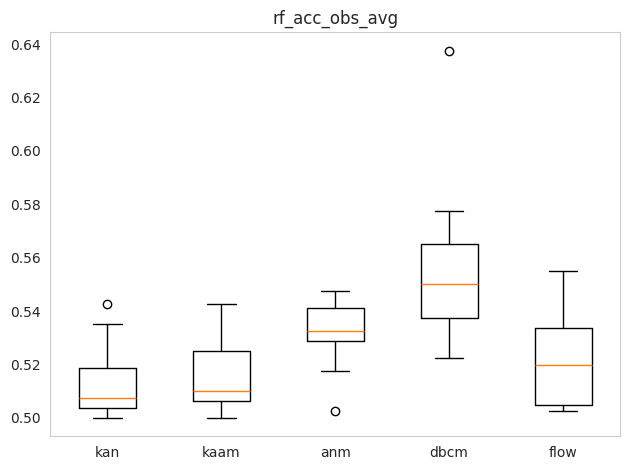

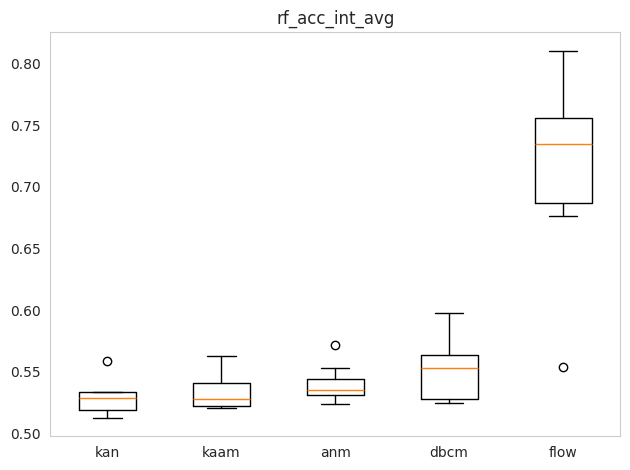

In [4]:
# Show per-dataset metrics comparing models, to see their performance across the board
datasets = ['3-chain-linear', '3-chain-non-linear', '4-chain-linear', '5-chain-linear', 'collider-linear', 'fork-linear', 'fork-non-linear', 'simpson-non-linear', 'simpson-symprod', 'triangle-linear', 'triangle-non-linear']  # Datasets used for evaluation
n = 1000  # Sample sizes used for evaluation
model_names = ['kan', 'kaam', 'anm', 'dbcm', 'flow']  # Models used for evaluation
colors = {'kan': 'r', 'kaam': 'g', 'anm': 'b', 'dbcm': 'orange', 'flow': 'brown'}
final_metrics = ['training_time', 'mmd_obs_avg', 'mmd_int_avg', 'mse_cf_avg', 'mae_cf_avg', 'rf_acc_obs_avg', 'rf_acc_int_avg']
grid_metrics =  ['mmd', 'rf_acc']

results_bdir = str(get_experiment_paths('continuous').root)
data_dir = os.path.join(results_bdir, 'data')

results_dataset = {}
for i_d, dataset in enumerate(datasets):
    results_all = {}
    for model_name in model_names:
        results_all[model_name] = {}
        results_file = os.path.join(data_dir, f"{dataset}_results_n_{n}_{model_name}.pkl")
        with open(results_file, 'rb') as f:
            results = pickle.load(f)
        for metric in final_metrics:
            results_all[model_name][metric] = results[metric] # Final results obtained

        if model_name != 'anm':  # Only model without grid search!
            if model_name == 'kaam':
                grid_search_results = os.path.join(data_dir, f"best_params_kan_{dataset}.pkl")  # KAAM uses the KAN grid search
            else:
                grid_search_results = os.path.join(data_dir, f"best_params_{model_name}_{dataset}.pkl")
            with open(grid_search_results, 'rb') as f:
                grid_results = pickle.load(f)

            if model_name == 'kaam':
                _, _, graph, _ = graph_data(name=dataset).generate(100, seed=0)
                best_params = get_kaam_hyperparameters(grid_results['results_all'], graph=graph)
            else:
                best_params = grid_results['best_params']

            for metric in grid_metrics:
                if model_name in ['kan', 'kaam']:
                    aux = []
                    for key in best_params.keys():
                        aux.append(best_params[key][metric]['all'])
                    results_all[model_name][f'{metric}_best'] = sum(aux) / len(aux)  # Best metrics according to the grid search, note that this need not be equal to the one actually obtained...
                else:
                    results_all[model_name][f'{metric}_best'] = best_params[metric]['all']  # Best metrics according to the grid search
                results_all[model_name][f'{metric}_grid'] = []
                for grid_element in grid_results['results_all']:
                    if model_name == 'kaam':
                        if grid_element[0]['mult_kan'] == False and grid_element[0]['hidden_dim'] == 0:
                            results_all[model_name][f'{metric}_grid'].append(grid_element[0][metric]['all']) # Grid element of a KAAM
                    else:
                        results_all[model_name][f'{metric}_grid'].append(grid_element[0][metric]['all']) # Grid element

    # First plot: scatter all RF accuracies and MMD per models to see their values
    fig = plt.subplots(1, 4, figsize=[20, 4])
    for i in range(2):  # To plot a secondary zoomed image
        plt.subplot(1, 4, i + 1)
        for model_name in model_names:
            if model_name != 'anm' and i < 0.5:
                plt.scatter(results_all[model_name]['rf_acc_grid'], results_all[model_name]['mmd_grid'], alpha=0.2, label=f'{model_name}', marker='x', color=colors[model_name])
        for model_name in reversed(model_names):
            if model_name != 'anm':
                plt.scatter(results_all[model_name]['rf_acc_best'], results_all[model_name]['mmd_best'], alpha=0.5, label=f'{model_name}_best', marker='s', color=colors[model_name], s=80)
            plt.scatter(results_all[model_name]['rf_acc_obs_avg'], results_all[model_name]['mmd_obs_avg'], alpha=0.5, label=f'{model_name}_obs_avg', marker='o', color=colors[model_name], s=80)
            plt.scatter(results_all[model_name]['rf_acc_int_avg'], results_all[model_name]['mmd_int_avg'], alpha=0.5, label=f'{model_name}_int', marker='v', color=colors[model_name], s=80)
        plt.xlabel('RF accuracy')
        plt.ylabel('MMD')
        if i == 0:
            plt.title(f'{dataset}')
        else:
            plt.title(f'{dataset} (detail)') # The second image does not show the grid results
        plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
        plt.tight_layout()
    # Subplot 3: RF acc vs CF MSE
    for model_name in model_names:
        plt.subplot(1, 4, 3)
        plt.scatter(results_all[model_name]['rf_acc_obs_avg'], results_all[model_name]['mse_cf_avg'], alpha=0.5, label=f'{model_name}', marker='s', color=colors[model_name], s=80)
    plt.xlabel('RF accuracy (obs)')
    plt.ylabel('CF MSE')
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.title(f'{dataset} CF')
    plt.tight_layout()

    # Subplot 4: RF acc vs time
    for model_name in model_names:
        plt.subplot(1, 4, 4)
        plt.scatter(results_all[model_name]['rf_acc_obs_avg'], results_all[model_name]['training_time'], alpha=0.5, label=f'{model_name}', marker='s', color=colors[model_name], s=80)
    plt.xlabel('RF accuracy (obs)')
    plt.ylabel('Training time')
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.tight_layout()
    plt.title(f'{dataset} time')
    plt.show()

    results_dataset[dataset] = results_all

# Now, put boxplots across all metrics to compare all methods on their chosen parameters
for metric in final_metrics:
    r_m = {}
    for model_name in model_names:
        r_m[model_name] = [results_dataset[d][model_name][metric] for d in datasets]
    plt.boxplot([r_m[model_name] for model_name in model_names])
    # Add the model_names as x_ticks
    plt.xticks(np.arange(1, len(model_names) + 1), model_names)
    plt.title(metric)
    if 'mmd' in metric or 'mse' in metric or 'time' in metric:
        plt.yscale('log')
    plt.grid()
    plt.tight_layout()
    plt.show()


In [5]:
# Ablation study: how many KAN are KAAMs?
datasets = ['3-chain-linear', '3-chain-non-linear', '4-chain-linear', '5-chain-linear', 'collider-linear', 'fork-linear', 'fork-non-linear', 'simpson-non-linear', 'simpson-symprod', 'triangle-linear', 'triangle-non-linear']  # Datasets used for evaluation

results_bdir = str(get_experiment_paths('continuous').root)
data_dir = os.path.join(results_bdir, 'data')

model_name = 'kan'
for dataset in datasets:
    fname = os.path.join(data_dir, f"best_params_{model_name}_{dataset}.pkl")
    if os.path.exists(fname):
        with open(fname, 'rb') as f:
            results = pickle.load(f)
        num_kaams = 0
        num_elements = 0
        for node in results['best_params'].keys():
            num_elements += 1
            hidden_dim = results['best_params'][node]['hidden_dim']
            mult_kan = results['best_params'][node]['mult_kan']
            if hidden_dim == 0 and not mult_kan:
                num_kaams += 1
        print(f' For dataset {dataset}, the KAN IS a KAAM in {num_kaams} KANs out of {num_elements}')


 For dataset 3-chain-linear, the KAN IS a KAAM in 2 KANs out of 2
 For dataset 3-chain-non-linear, the KAN IS a KAAM in 2 KANs out of 2
 For dataset 4-chain-linear, the KAN IS a KAAM in 2 KANs out of 3
 For dataset 5-chain-linear, the KAN IS a KAAM in 2 KANs out of 4
 For dataset collider-linear, the KAN IS a KAAM in 0 KANs out of 1
 For dataset fork-linear, the KAN IS a KAAM in 1 KANs out of 2
 For dataset fork-non-linear, the KAN IS a KAAM in 0 KANs out of 2
 For dataset simpson-non-linear, the KAN IS a KAAM in 3 KANs out of 3
 For dataset simpson-symprod, the KAN IS a KAAM in 0 KANs out of 3
 For dataset triangle-linear, the KAN IS a KAAM in 1 KANs out of 2
 For dataset triangle-non-linear, the KAN IS a KAAM in 1 KANs out of 2


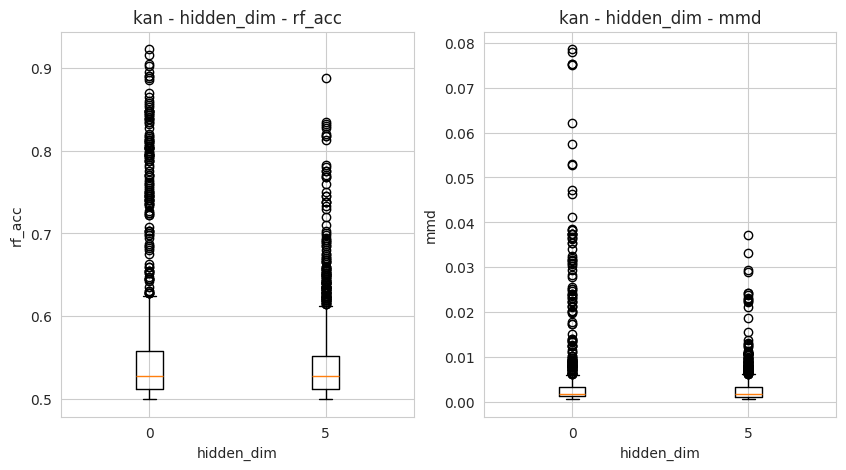



 kan - hidden_dim - Best parameter values selected for each dataset:
Value 0: selected 14 times (127.3%)
Value 5: selected 12 times (109.1%)


 kan - hidden_dim - Mean and Median values:
╒══════════════╤════════════════════════════════╤════════════════════════════════╕
│   hidden_dim │ rf_acc                         │ mmd                            │
╞══════════════╪════════════════════════════════╪════════════════════════════════╡
│            0 │ 0.5641 (mean), 0.5275 (median) │ 0.0046 (mean), 0.0017 (median) │
├──────────────┼────────────────────────────────┼────────────────────────────────┤
│            5 │ 0.5416 (mean), 0.5275 (median) │ 0.0027 (mean), 0.0018 (median) │
╘══════════════╧════════════════════════════════╧════════════════════════════════╛


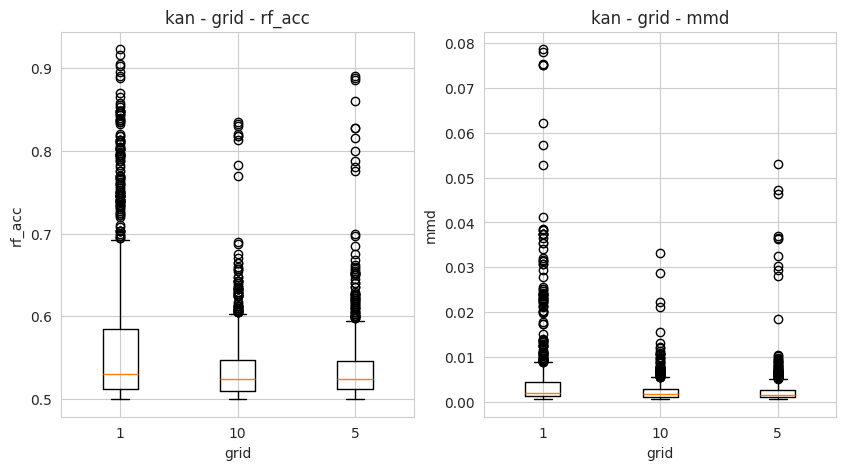



 kan - grid - Best parameter values selected for each dataset:
Value 1: selected 9 times (81.8%)
Value 10: selected 6 times (54.5%)
Value 5: selected 11 times (100.0%)


 kan - grid - Mean and Median values:
╒════════╤════════════════════════════════╤════════════════════════════════╕
│   grid │ rf_acc                         │ mmd                            │
╞════════╪════════════════════════════════╪════════════════════════════════╡
│      1 │ 0.5711 (mean), 0.5300 (median) │ 0.0049 (mean), 0.0019 (median) │
├────────┼────────────────────────────────┼────────────────────────────────┤
│     10 │ 0.5381 (mean), 0.5250 (median) │ 0.0025 (mean), 0.0017 (median) │
├────────┼────────────────────────────────┼────────────────────────────────┤
│      5 │ 0.5382 (mean), 0.5250 (median) │ 0.0026 (mean), 0.0017 (median) │
╘════════╧════════════════════════════════╧════════════════════════════════╛


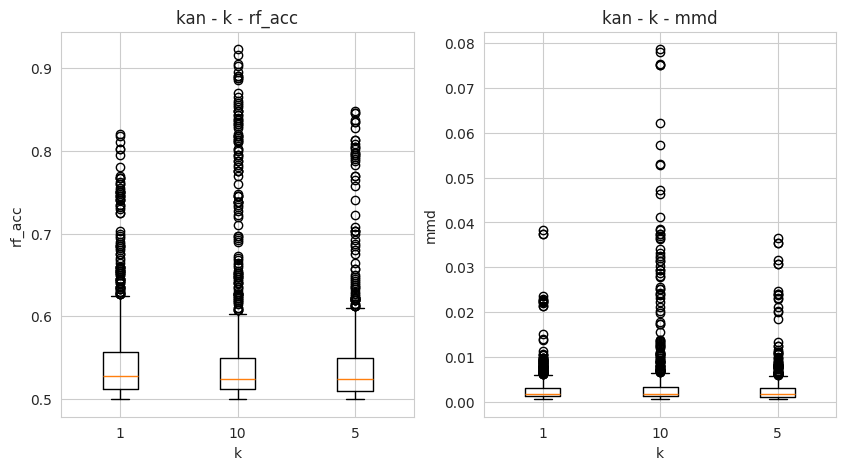



 kan - k - Best parameter values selected for each dataset:
Value 1: selected 10 times (90.9%)
Value 10: selected 5 times (45.5%)
Value 5: selected 11 times (100.0%)


 kan - k - Mean and Median values:
╒═════╤════════════════════════════════╤════════════════════════════════╕
│   k │ rf_acc                         │ mmd                            │
╞═════╪════════════════════════════════╪════════════════════════════════╡
│   1 │ 0.5490 (mean), 0.5275 (median) │ 0.0029 (mean), 0.0018 (median) │
├─────┼────────────────────────────────┼────────────────────────────────┤
│  10 │ 0.5550 (mean), 0.5250 (median) │ 0.0043 (mean), 0.0018 (median) │
├─────┼────────────────────────────────┼────────────────────────────────┤
│   5 │ 0.5433 (mean), 0.5250 (median) │ 0.0028 (mean), 0.0017 (median) │
╘═════╧════════════════════════════════╧════════════════════════════════╛


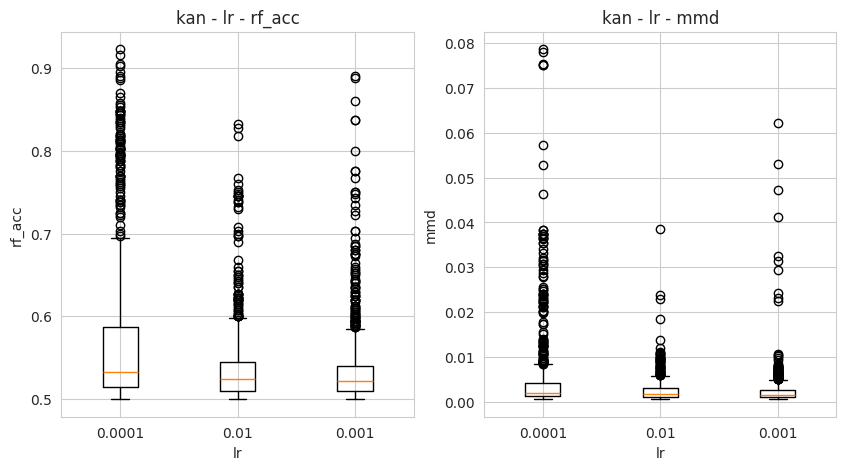



 kan - lr - Best parameter values selected for each dataset:
Value 0.0001: selected 4 times (36.4%)
Value 0.01: selected 15 times (136.4%)
Value 0.001: selected 7 times (63.6%)


 kan - lr - Mean and Median values:
╒════════╤════════════════════════════════╤════════════════════════════════╕
│     lr │ rf_acc                         │ mmd                            │
╞════════╪════════════════════════════════╪════════════════════════════════╡
│ 0.0001 │ 0.5718 (mean), 0.5325 (median) │ 0.0049 (mean), 0.0020 (median) │
├────────┼────────────────────────────────┼────────────────────────────────┤
│ 0.01   │ 0.5384 (mean), 0.5250 (median) │ 0.0025 (mean), 0.0017 (median) │
├────────┼────────────────────────────────┼────────────────────────────────┤
│ 0.001  │ 0.5371 (mean), 0.5225 (median) │ 0.0026 (mean), 0.0016 (median) │
╘════════╧════════════════════════════════╧════════════════════════════════╛


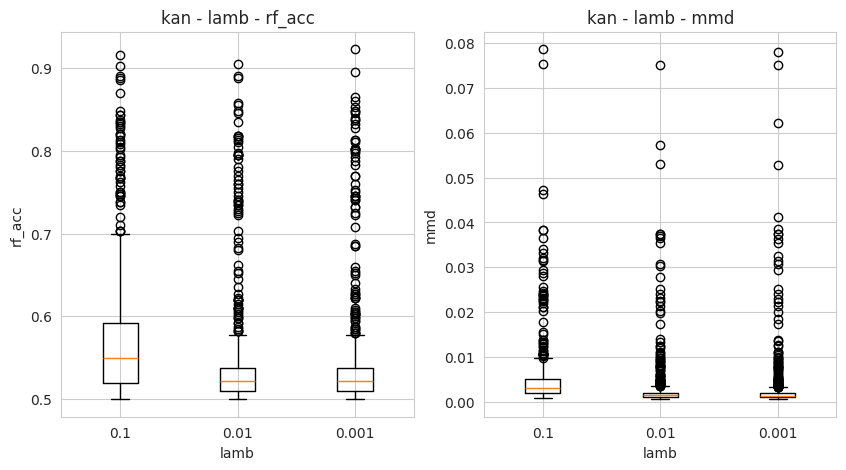



 kan - lamb - Best parameter values selected for each dataset:
Value 0.1: selected 6 times (54.5%)
Value 0.01: selected 9 times (81.8%)
Value 0.001: selected 11 times (100.0%)


 kan - lamb - Mean and Median values:
╒════════╤════════════════════════════════╤════════════════════════════════╕
│   lamb │ rf_acc                         │ mmd                            │
╞════════╪════════════════════════════════╪════════════════════════════════╡
│  0.1   │ 0.5701 (mean), 0.5500 (median) │ 0.0047 (mean), 0.0032 (median) │
├────────┼────────────────────────────────┼────────────────────────────────┤
│  0.01  │ 0.5382 (mean), 0.5225 (median) │ 0.0026 (mean), 0.0015 (median) │
├────────┼────────────────────────────────┼────────────────────────────────┤
│  0.001 │ 0.5390 (mean), 0.5225 (median) │ 0.0027 (mean), 0.0014 (median) │
╘════════╧════════════════════════════════╧════════════════════════════════╛


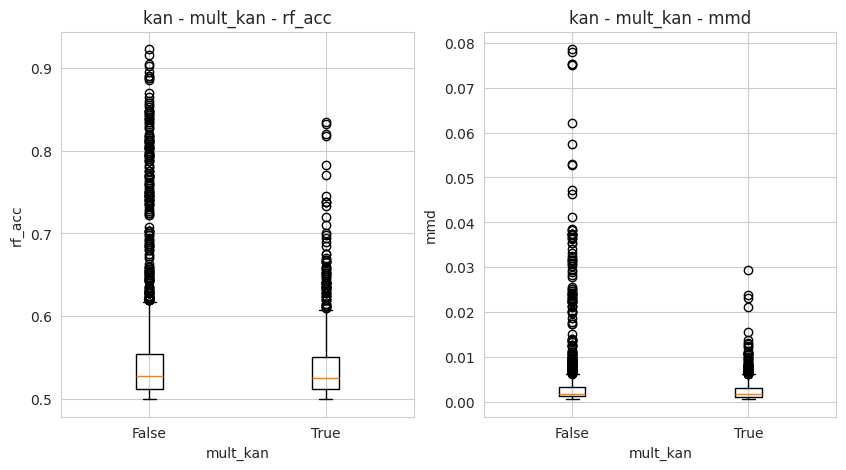



 kan - mult_kan - Best parameter values selected for each dataset:
Value False: selected 23 times (209.1%)
Value True: selected 3 times (27.3%)


 kan - mult_kan - Mean and Median values:
╒════════════╤════════════════════════════════╤════════════════════════════════╕
│ mult_kan   │ rf_acc                         │ mmd                            │
╞════════════╪════════════════════════════════╪════════════════════════════════╡
│ False      │ 0.5531 (mean), 0.5275 (median) │ 0.0037 (mean), 0.0018 (median) │
├────────────┼────────────────────────────────┼────────────────────────────────┤
│ True       │ 0.5410 (mean), 0.5250 (median) │ 0.0026 (mean), 0.0017 (median) │
╘════════════╧════════════════════════════════╧════════════════════════════════╛


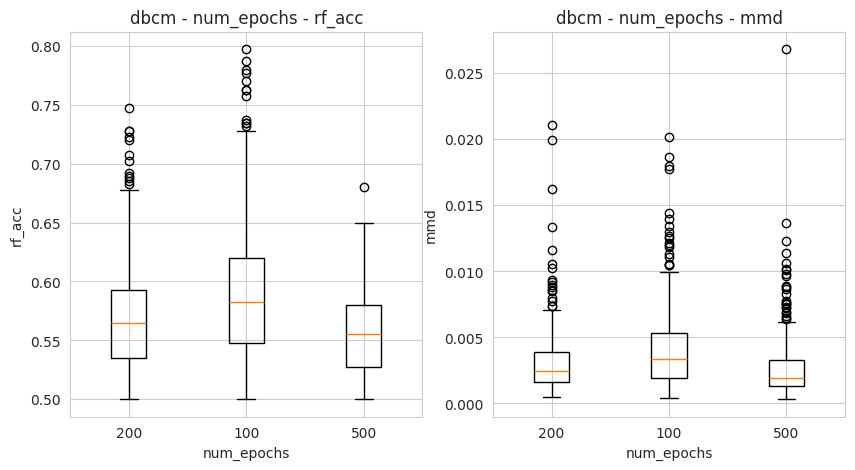



 dbcm - num_epochs - Best parameter values selected for each dataset:
Value 200: selected 4 times (36.4%)
Value 100: selected 2 times (18.2%)
Value 500: selected 5 times (45.5%)


 dbcm - num_epochs - Mean and Median values:
╒══════════════╤════════════════════════════════╤════════════════════════════════╕
│   num_epochs │ rf_acc                         │ mmd                            │
╞══════════════╪════════════════════════════════╪════════════════════════════════╡
│          200 │ 0.5701 (mean), 0.5650 (median) │ 0.0032 (mean), 0.0025 (median) │
├──────────────┼────────────────────────────────┼────────────────────────────────┤
│          100 │ 0.5917 (mean), 0.5825 (median) │ 0.0043 (mean), 0.0034 (median) │
├──────────────┼────────────────────────────────┼────────────────────────────────┤
│          500 │ 0.5564 (mean), 0.5550 (median) │ 0.0028 (mean), 0.0019 (median) │
╘══════════════╧════════════════════════════════╧════════════════════════════════╛


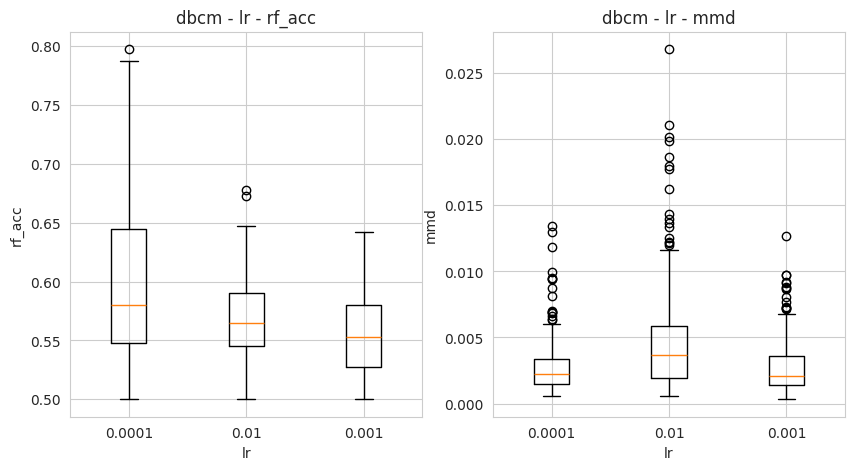



 dbcm - lr - Best parameter values selected for each dataset:
Value 0.0001: selected 1 times (9.1%)
Value 0.01: selected 2 times (18.2%)
Value 0.001: selected 8 times (72.7%)


 dbcm - lr - Mean and Median values:
╒════════╤════════════════════════════════╤════════════════════════════════╕
│     lr │ rf_acc                         │ mmd                            │
╞════════╪════════════════════════════════╪════════════════════════════════╡
│ 0.0001 │ 0.5974 (mean), 0.5800 (median) │ 0.0027 (mean), 0.0022 (median) │
├────────┼────────────────────────────────┼────────────────────────────────┤
│ 0.01   │ 0.5672 (mean), 0.5650 (median) │ 0.0047 (mean), 0.0037 (median) │
├────────┼────────────────────────────────┼────────────────────────────────┤
│ 0.001  │ 0.5536 (mean), 0.5525 (median) │ 0.0027 (mean), 0.0021 (median) │
╘════════╧════════════════════════════════╧════════════════════════════════╛


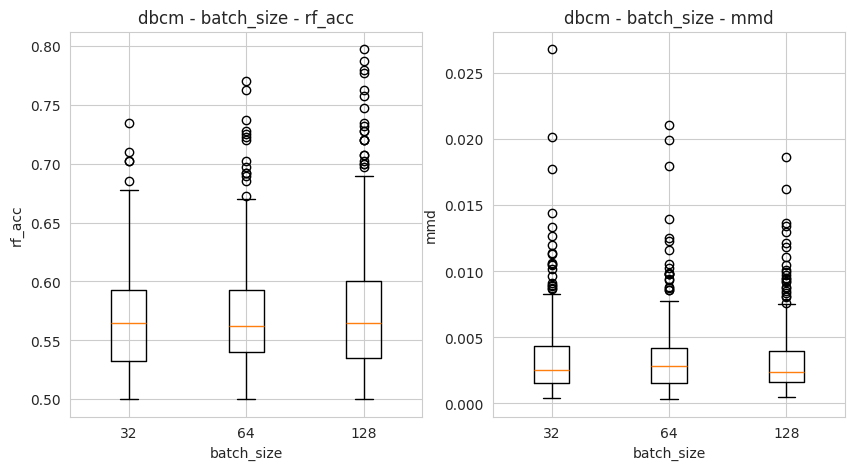



 dbcm - batch_size - Best parameter values selected for each dataset:
Value 32: selected 5 times (45.5%)
Value 64: selected 3 times (27.3%)
Value 128: selected 3 times (27.3%)


 dbcm - batch_size - Mean and Median values:
╒══════════════╤════════════════════════════════╤════════════════════════════════╕
│   batch_size │ rf_acc                         │ mmd                            │
╞══════════════╪════════════════════════════════╪════════════════════════════════╡
│           32 │ 0.5676 (mean), 0.5650 (median) │ 0.0035 (mean), 0.0025 (median) │
├──────────────┼────────────────────────────────┼────────────────────────────────┤
│           64 │ 0.5724 (mean), 0.5625 (median) │ 0.0035 (mean), 0.0028 (median) │
├──────────────┼────────────────────────────────┼────────────────────────────────┤
│          128 │ 0.5782 (mean), 0.5650 (median) │ 0.0033 (mean), 0.0024 (median) │
╘══════════════╧════════════════════════════════╧════════════════════════════════╛


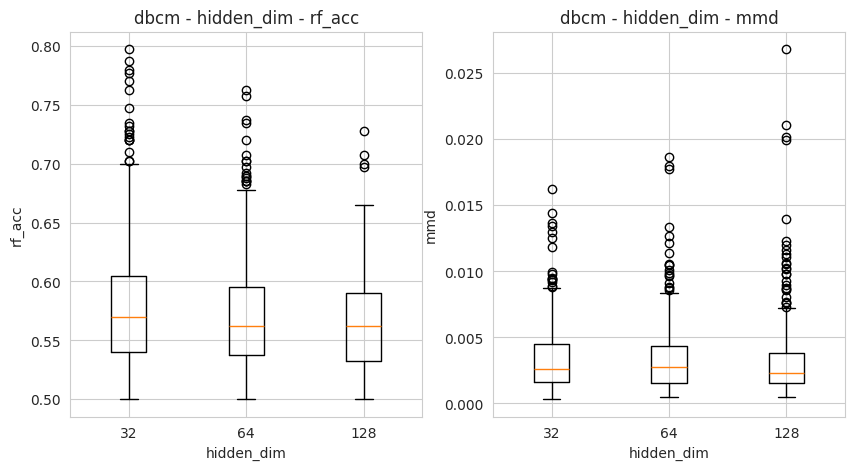



 dbcm - hidden_dim - Best parameter values selected for each dataset:
Value 32: selected 1 times (9.1%)
Value 64: selected 3 times (27.3%)
Value 128: selected 7 times (63.6%)


 dbcm - hidden_dim - Mean and Median values:
╒══════════════╤════════════════════════════════╤════════════════════════════════╕
│   hidden_dim │ rf_acc                         │ mmd                            │
╞══════════════╪════════════════════════════════╪════════════════════════════════╡
│           32 │ 0.5810 (mean), 0.5700 (median) │ 0.0035 (mean), 0.0026 (median) │
├──────────────┼────────────────────────────────┼────────────────────────────────┤
│           64 │ 0.5722 (mean), 0.5625 (median) │ 0.0034 (mean), 0.0027 (median) │
├──────────────┼────────────────────────────────┼────────────────────────────────┤
│          128 │ 0.5651 (mean), 0.5625 (median) │ 0.0033 (mean), 0.0023 (median) │
╘══════════════╧════════════════════════════════╧════════════════════════════════╛


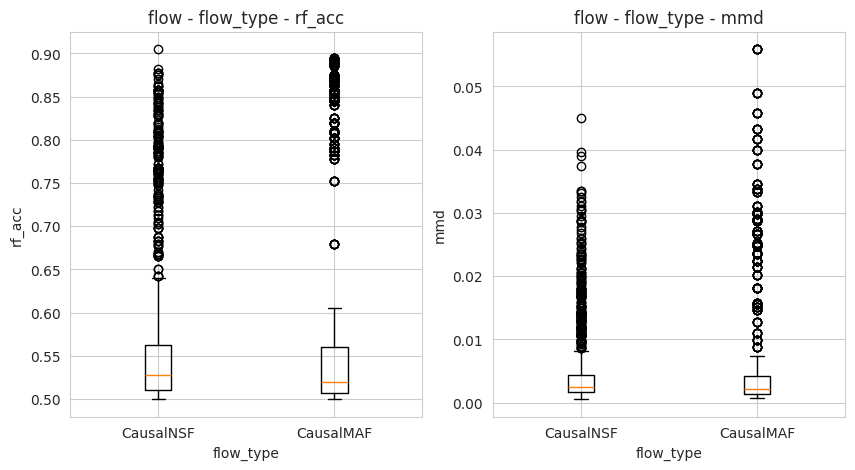



 flow - flow_type - Best parameter values selected for each dataset:
Value CausalNSF: selected 10 times (90.9%)
Value CausalMAF: selected 1 times (9.1%)


 flow - flow_type - Mean and Median values:
╒═════════════╤════════════════════════════════╤════════════════════════════════╕
│ flow_type   │ rf_acc                         │ mmd                            │
╞═════════════╪════════════════════════════════╪════════════════════════════════╡
│ CausalNSF   │ 0.5738 (mean), 0.5275 (median) │ 0.0051 (mean), 0.0024 (median) │
├─────────────┼────────────────────────────────┼────────────────────────────────┤
│ CausalMAF   │ 0.5909 (mean), 0.5200 (median) │ 0.0075 (mean), 0.0021 (median) │
╘═════════════╧════════════════════════════════╧════════════════════════════════╛


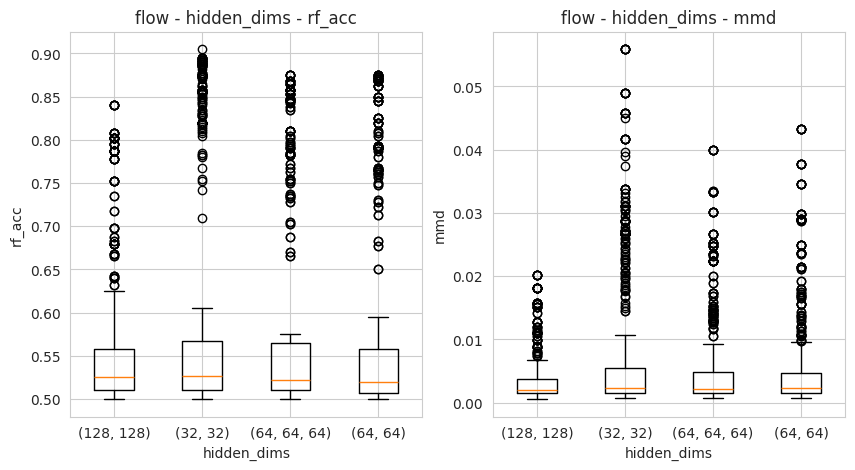



 flow - hidden_dims - Best parameter values selected for each dataset:
Value (128, 128): selected 0 times (0.0%)
Value (32, 32): selected 6 times (54.5%)
Value (64, 64, 64): selected 1 times (9.1%)
Value (64, 64): selected 4 times (36.4%)


 flow - hidden_dims - Mean and Median values:
╒═══════════════╤════════════════════════════════╤════════════════════════════════╕
│ hidden_dims   │ rf_acc                         │ mmd                            │
╞═══════════════╪════════════════════════════════╪════════════════════════════════╡
│ (128, 128)    │ 0.5632 (mean), 0.5250 (median) │ 0.0039 (mean), 0.0020 (median) │
├───────────────┼────────────────────────────────┼────────────────────────────────┤
│ (32, 32)      │ 0.5980 (mean), 0.5262 (median) │ 0.0085 (mean), 0.0023 (median) │
├───────────────┼────────────────────────────────┼────────────────────────────────┤
│ (64, 64, 64)  │ 0.5852 (mean), 0.5225 (median) │ 0.0063 (mean), 0.0022 (median) │
├───────────────┼──────────────────────

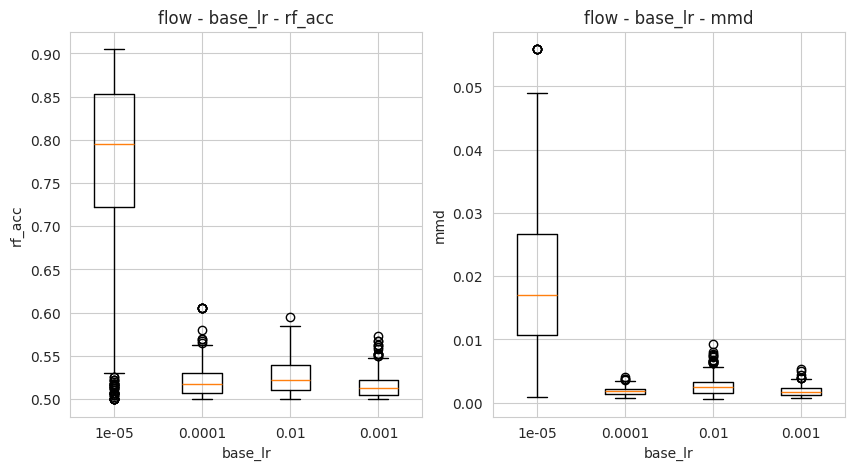



 flow - base_lr - Best parameter values selected for each dataset:
Value 1e-05: selected 0 times (0.0%)
Value 0.0001: selected 4 times (36.4%)
Value 0.01: selected 1 times (9.1%)
Value 0.001: selected 6 times (54.5%)


 flow - base_lr - Mean and Median values:
╒═══════════╤════════════════════════════════╤════════════════════════════════╕
│   base_lr │ rf_acc                         │ mmd                            │
╞═══════════╪════════════════════════════════╪════════════════════════════════╡
│    1e-05  │ 0.7664 (mean), 0.7950 (median) │ 0.0191 (mean), 0.0170 (median) │
├───────────┼────────────────────────────────┼────────────────────────────────┤
│    0.0001 │ 0.5212 (mean), 0.5175 (median) │ 0.0018 (mean), 0.0017 (median) │
├───────────┼────────────────────────────────┼────────────────────────────────┤
│    0.01   │ 0.5259 (mean), 0.5225 (median) │ 0.0026 (mean), 0.0024 (median) │
├───────────┼────────────────────────────────┼────────────────────────────────┤
│    0.001  │ 0.5

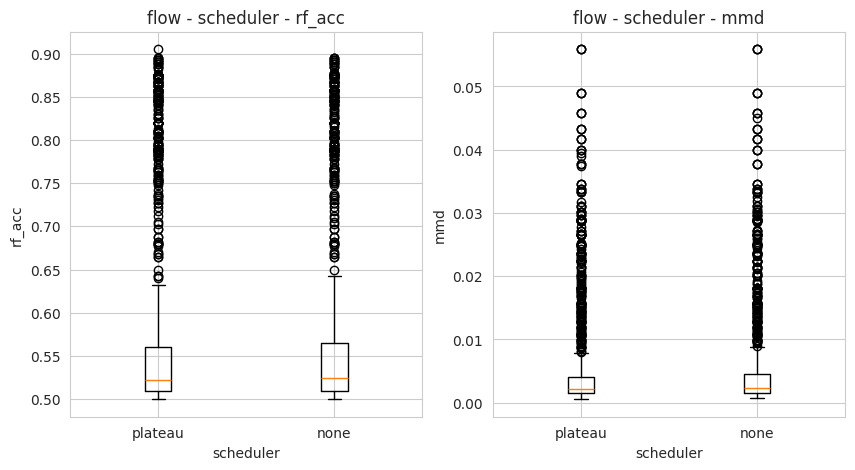



 flow - scheduler - Best parameter values selected for each dataset:
Value plateau: selected 7 times (63.6%)
Value none: selected 0 times (0.0%)


 flow - scheduler - Mean and Median values:
╒═════════════╤════════════════════════════════╤════════════════════════════════╕
│ scheduler   │ rf_acc                         │ mmd                            │
╞═════════════╪════════════════════════════════╪════════════════════════════════╡
│ plateau     │ 0.5814 (mean), 0.5225 (median) │ 0.0063 (mean), 0.0022 (median) │
├─────────────┼────────────────────────────────┼────────────────────────────────┤
│ none        │ 0.5833 (mean), 0.5250 (median) │ 0.0064 (mean), 0.0023 (median) │
╘═════════════╧════════════════════════════════╧════════════════════════════════╛


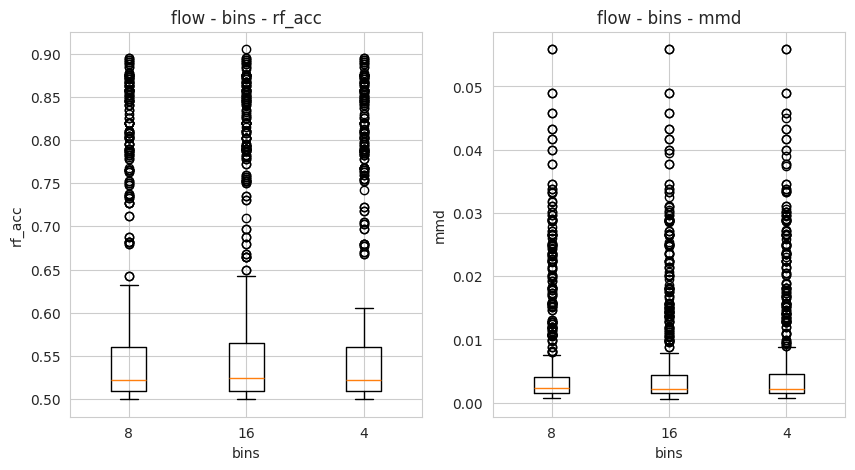



 flow - bins - Best parameter values selected for each dataset:
Value 8: selected 5 times (45.5%)
Value 16: selected 1 times (9.1%)
Value 4: selected 5 times (45.5%)


 flow - bins - Mean and Median values:
╒════════╤════════════════════════════════╤════════════════════════════════╕
│   bins │ rf_acc                         │ mmd                            │
╞════════╪════════════════════════════════╪════════════════════════════════╡
│      8 │ 0.5817 (mean), 0.5225 (median) │ 0.0063 (mean), 0.0022 (median) │
├────────┼────────────────────────────────┼────────────────────────────────┤
│     16 │ 0.5837 (mean), 0.5250 (median) │ 0.0063 (mean), 0.0022 (median) │
├────────┼────────────────────────────────┼────────────────────────────────┤
│      4 │ 0.5816 (mean), 0.5225 (median) │ 0.0064 (mean), 0.0022 (median) │
╘════════╧════════════════════════════════╧════════════════════════════════╛


In [6]:
# Ablation studies: for each parameter and model, show the dispersion of the values (continuous experiments)
datasets = ['3-chain-linear', '3-chain-non-linear', '4-chain-linear', '5-chain-linear', 'collider-linear', 'fork-linear', 'fork-non-linear', 'simpson-non-linear', 'simpson-symprod', 'triangle-linear', 'triangle-non-linear']  # Datasets used for evaluation
metrics = ['rf_acc', 'mmd']  # Metrics used for evaluation
model_params = {'kan': ['hidden_dim', 'grid', 'k', 'lr', 'lamb', 'mult_kan'],
                'dbcm': ['num_epochs', 'lr', 'batch_size', 'hidden_dim'],
                'flow': ['flow_type', 'hidden_dims', 'base_lr', 'scheduler', 'bins']}

results_bdir = str(get_experiment_paths('continuous').root)
data_dir = os.path.join(results_bdir, 'data')

for model_name in model_params.keys():
    for param in model_params[model_name]:
        param_values = []
        param_results = {}
        best_param_values = []
        for dataset in datasets:
            fname = os.path.join(data_dir, f"best_params_{model_name}_{dataset}.pkl")
            if os.path.exists(fname):
                with open(fname, 'rb') as f:
                    results = pickle.load(f)
                results_all = results['results_all']
                if model_name == 'kan':
                    best_param_values.extend([results['best_params'][node][param] for node in results['best_params'].keys()])
                else:
                    best_param_values.append(results['best_params'][param])
                for r in results_all:
                    if len(param_values) == 0:  # Initialize the param_values list with the unique values of the parameter
                        param_values = list(set([r[0][param] for r in results_all]))
                        # replace a possible None by a string 'none'
                        param_values = [p if p is not None else 'none' for p in param_values]
                        for v in param_values:
                            param_results[v] = {m: [] for m in metrics}
                    for imetric, m in enumerate(metrics):
                        pn = r[0][param] if r[0][param] is not None else 'none'
                        param_results[pn][m].append(r[0][m]['all'])
        # Prepare a boxplot for each metric, containing all the parameter values
        plt.subplots(1, len(metrics), figsize=(5 * len(metrics), 5))
        for imetric, m in enumerate(metrics):
            plt.subplot(1, len(metrics), imetric + 1)
            data = [param_results[v][m] for v in param_values]
            plt.boxplot(data, tick_labels=param_values)
            plt.title(f'{model_name} - {param} - {m}')
            plt.xlabel(param)
            plt.ylabel(m)
        plt.show()
        # Print best parameter values selected for the datasets (in all)
        print(f'\n\n {model_name} - {param} - Best parameter values selected for each dataset:')
        for v in param_values:
            count = best_param_values.count(v)
            print(f'Value {v}: selected {count} times ({count/len(datasets)*100:.1f}%)')
        # Print mean and median values for each parameter value and metric
        table = []
        for v in param_values:
            row = [v]
            for imetric, m in enumerate(metrics):
                values = param_results[v][m]
                if len(values) > 0:
                    mean_val = np.mean(values)
                    median_val = np.median(values)
                    row.append(f'{mean_val:.4f} (mean), {median_val:.4f} (median)')
                else:
                    row.append('N/A')
            table.append(row)
        print(f'\n\n {model_name} - {param} - Mean and Median values:')
        print(tabulate(table, headers=[param] + metrics, tablefmt="fancy_grid"))


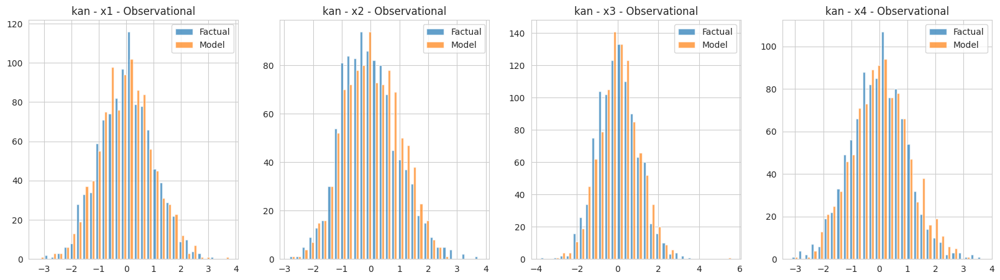

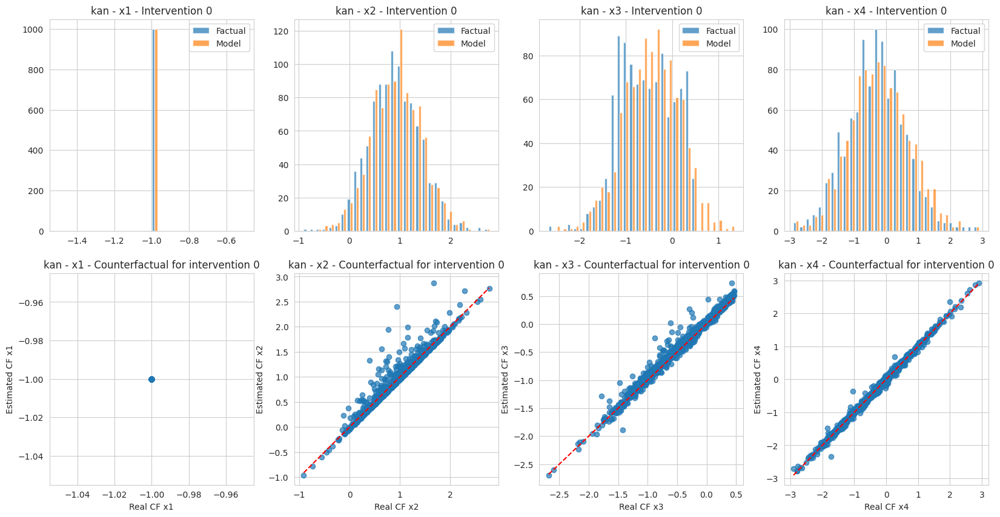

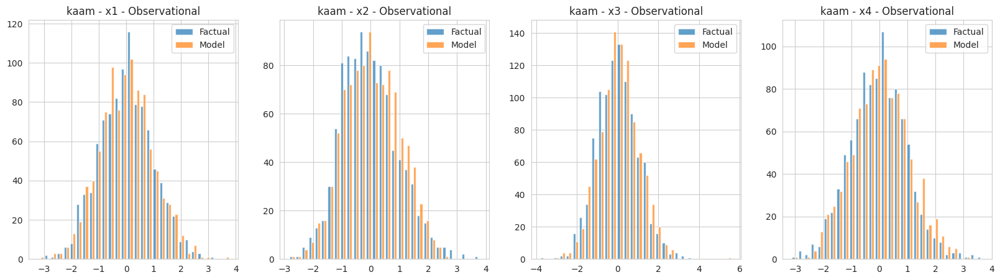

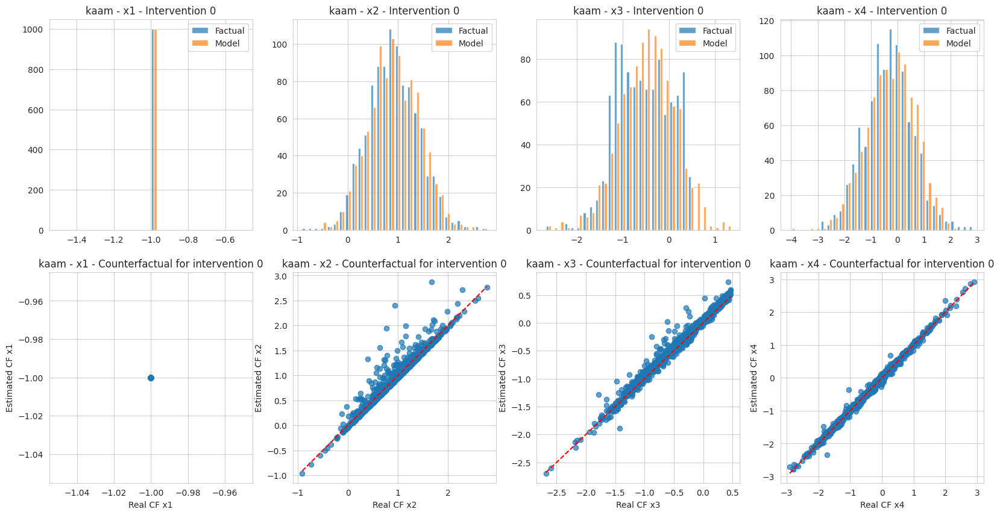

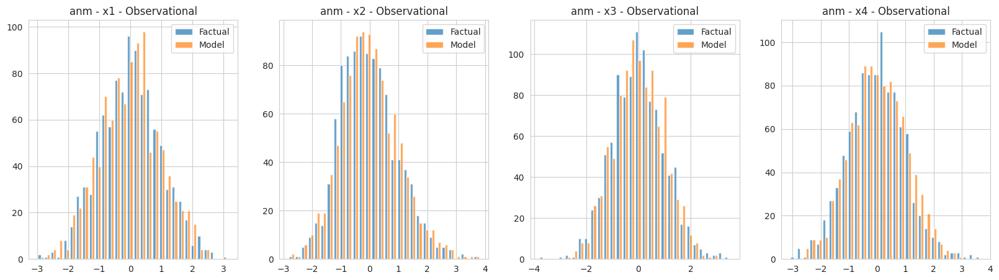

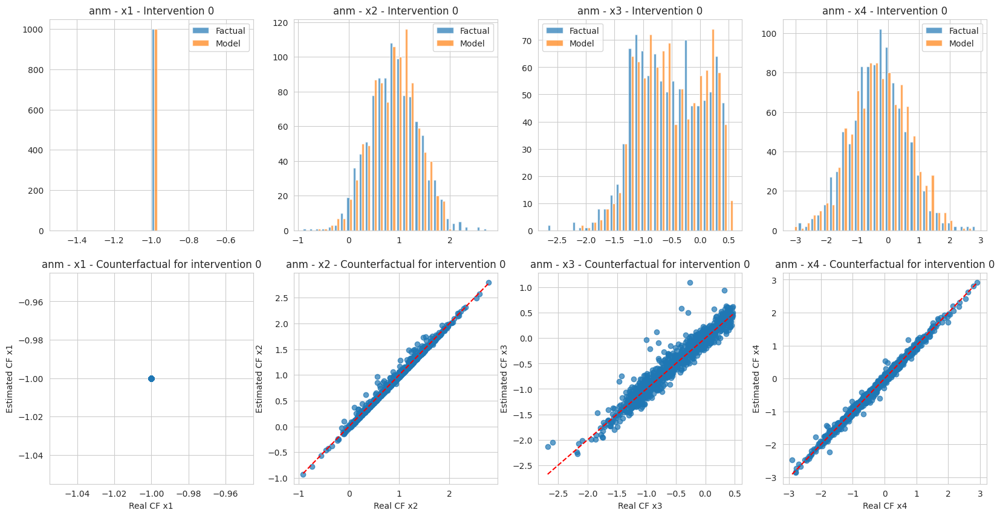

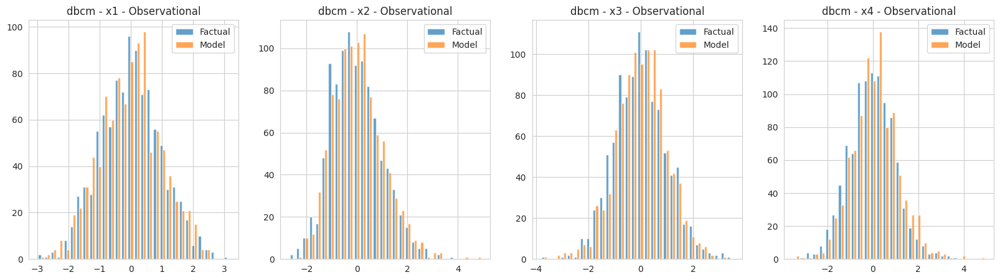

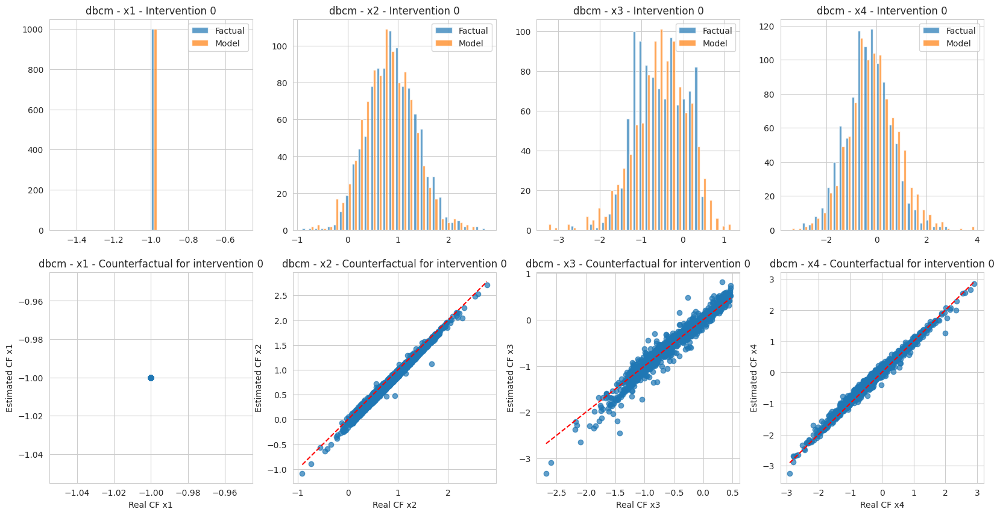

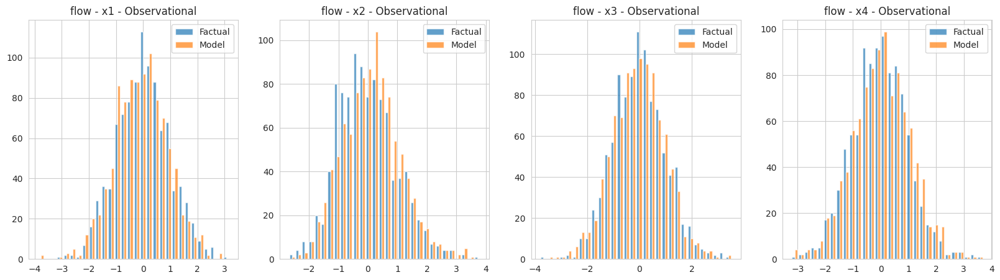

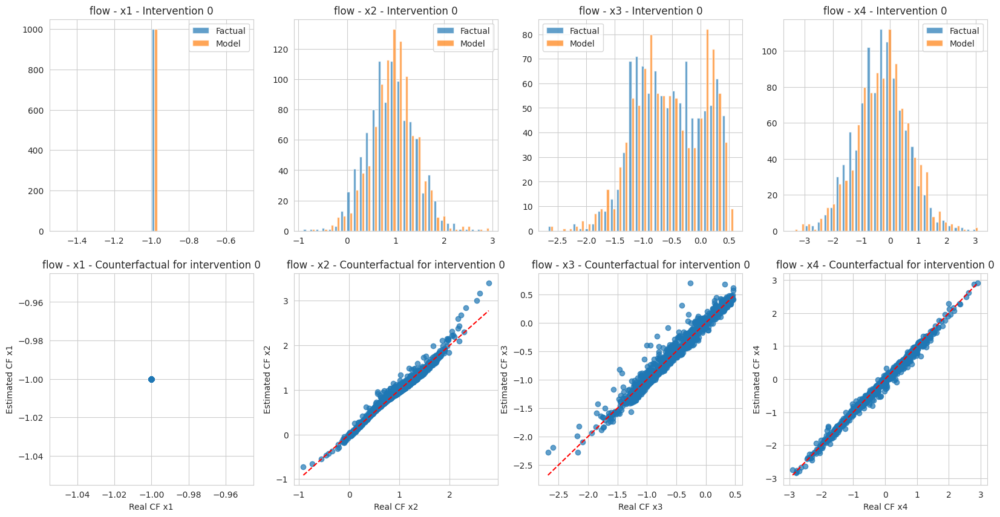

In [7]:
# Put one example of the distributions of observational, interventional and counterfactual samples for one dataset and n, for all models
results_bdir = str(get_experiment_paths('continuous').root)
samples_dir = os.path.join(results_bdir, 'samples')
dataset = 'simpson-non-linear'
n = 1000
n_interventions = 1  # Number of interventions that we want to represent, the maximum is 6

model_names = ['kan', 'kaam', 'anm', 'dbcm', 'flow']  # Models used for evaluation

factual_eval = pd.read_csv(os.path.join(samples_dir, f"{dataset}_factual_eval_n_{n}.csv"))
cf_eval = [pd.read_csv(os.path.join(samples_dir, f"{dataset}_cf_eval_n_{n}_{i}.csv")) for i in range(n_interventions)]

for model_name in model_names:
    obs_model = pd.read_csv(os.path.join(samples_dir, f"{dataset}_obs_samples_n_{n}_{model_name}.csv"))
    int_model = [pd.read_csv(os.path.join(samples_dir, f"{dataset}_int_samples_n_{n}_{model_name}_{intervention}.csv")) for intervention in range(n_interventions)]
    cf_estimates = [pd.read_csv(os.path.join(samples_dir, f"{dataset}_cf_estimates_n_{n}_{model_name}_{intervention}.csv")) for intervention in range(n_interventions)]
    nodes = factual_eval.columns
    plt.subplots(1, len(nodes), figsize=(5 * len(nodes), 5))
    for i, node in enumerate(nodes):
        plt.subplot(1, len(nodes), i + 1)
        plt.hist([factual_eval[node], obs_model[node]], bins=30, label=['Factual', 'Model'], alpha=0.7)
        plt.title(f'{model_name} - {node} - Observational')
        plt.legend(loc='best')

    for intervention in range(n_interventions):
        plt.subplots(2, len(nodes), figsize=(5 * len(nodes), 10))

        for i, node in enumerate(nodes):
            plt.subplot(2, len(nodes), i + 1)
            plt.hist([cf_eval[intervention][node], int_model[intervention][node]], bins=30, label=['Factual', 'Model'], alpha=0.7)
            plt.title(f'{model_name} - {node} - Intervention {intervention}')
            plt.legend(loc='best')

            plt.subplot(2, len(nodes), i + 1 + len(nodes))
            plt.scatter(cf_eval[intervention][node], cf_estimates[intervention][node], alpha=0.7)
            plt.plot([cf_eval[intervention][node].min(), cf_eval[intervention][node].max()], [cf_eval[intervention][node].min(), cf_eval[intervention][node].max()], 'r--')
            plt.xlabel(f'Real CF { node}')
            plt.ylabel(f'Estimated CF { node}')
            plt.title(f'{model_name} - {node} - Counterfactual for intervention {intervention}')

    plt.show()



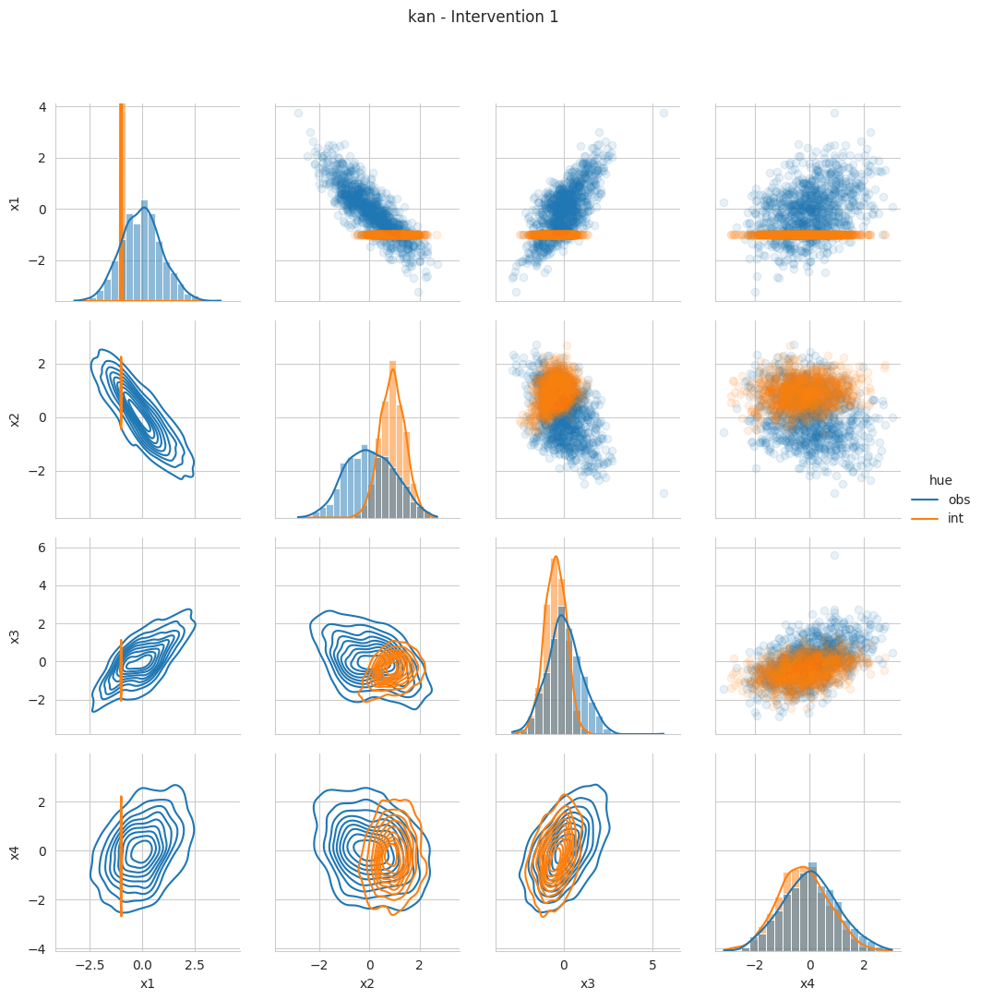

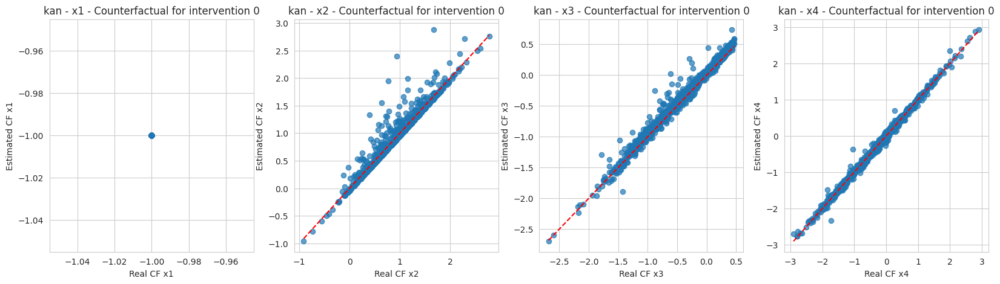

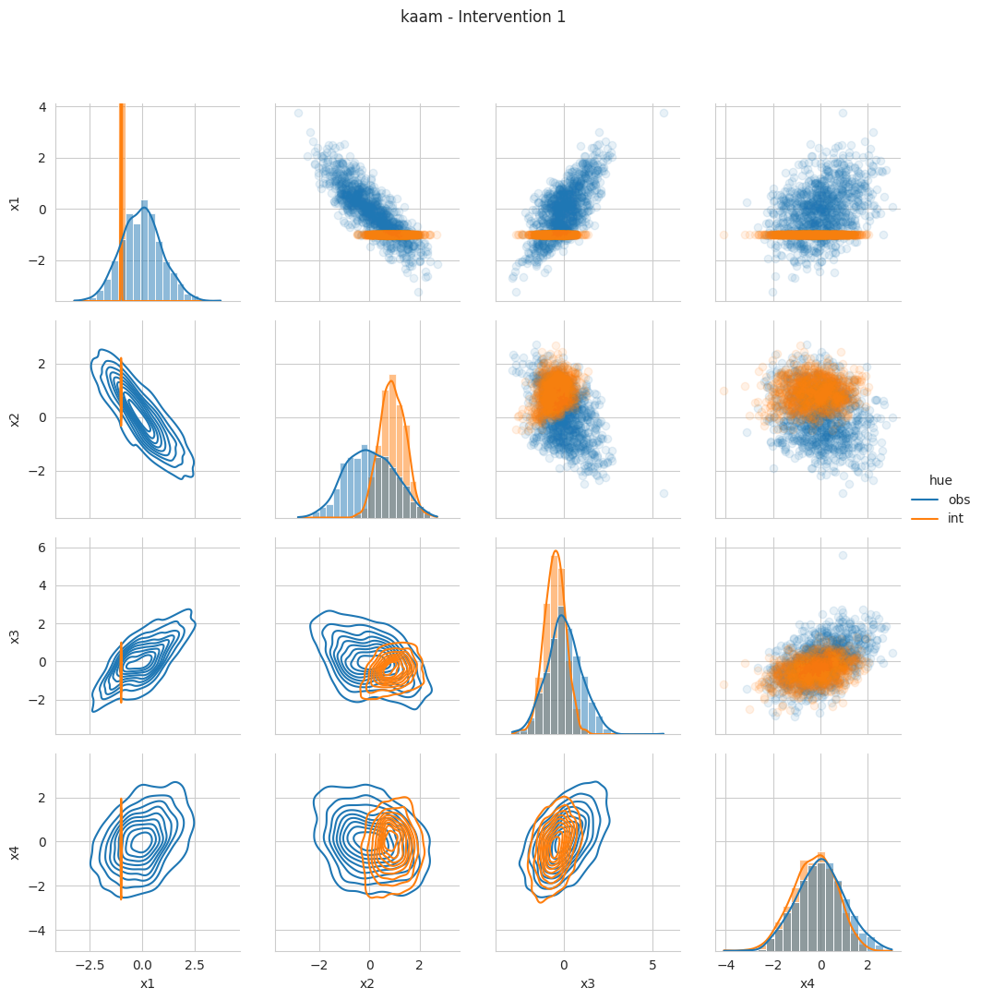

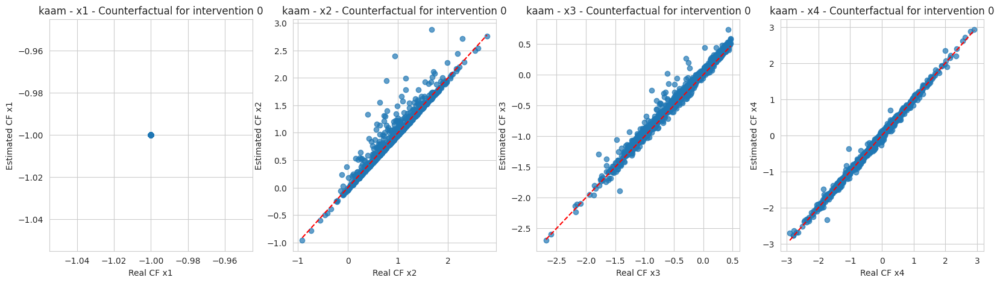

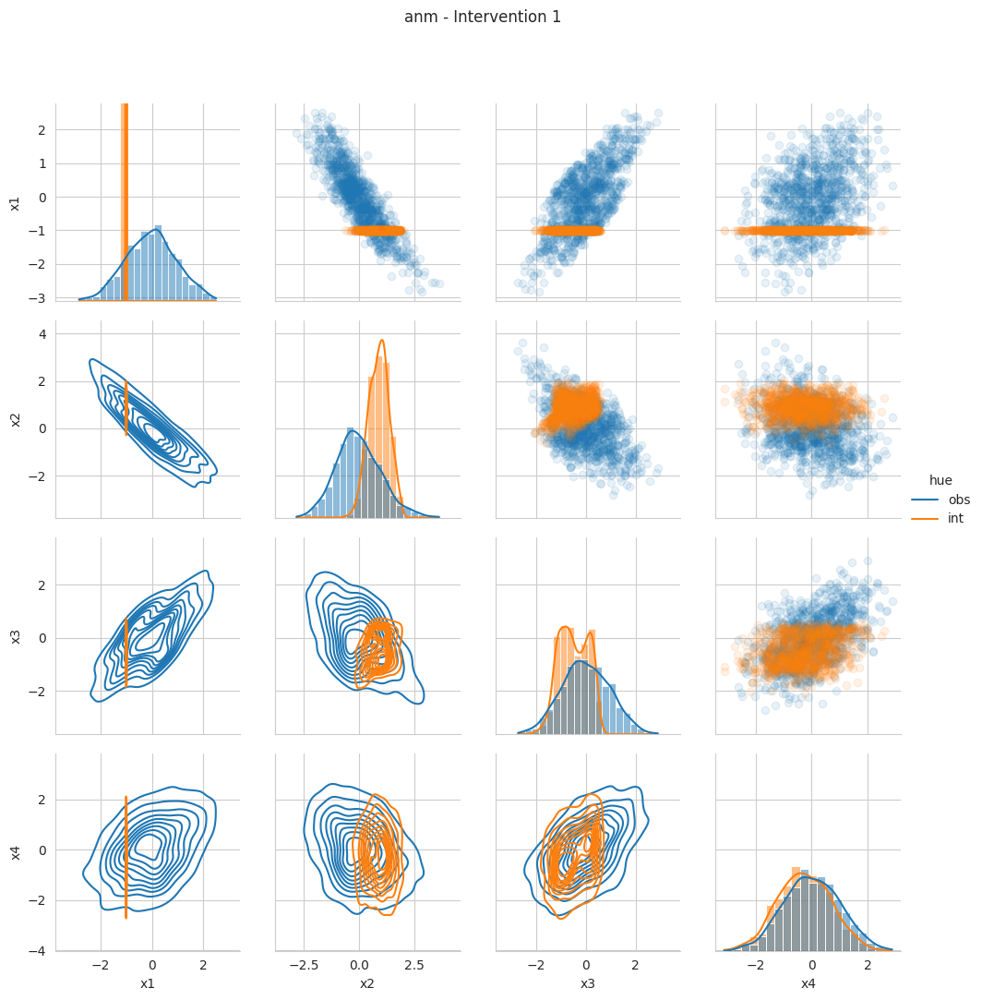

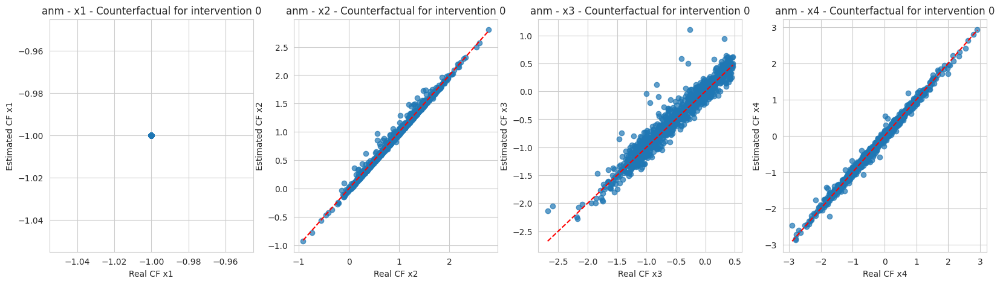

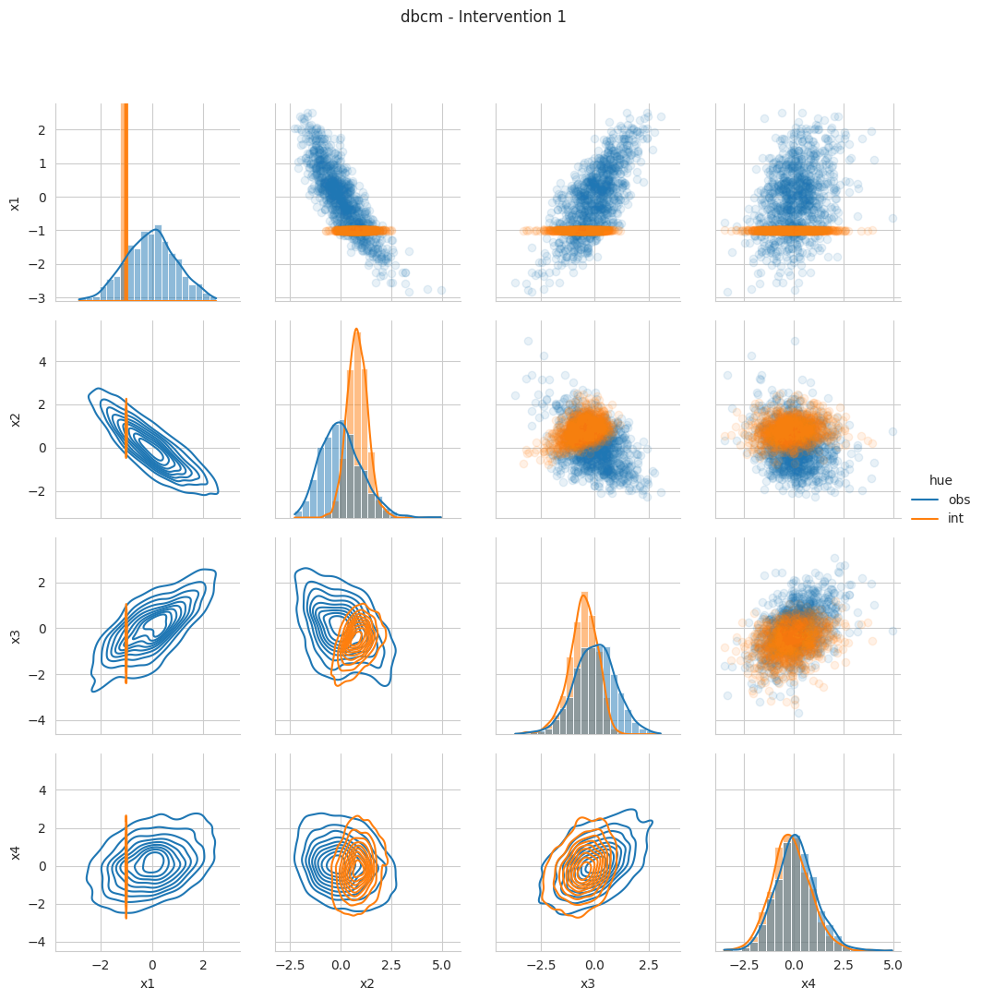

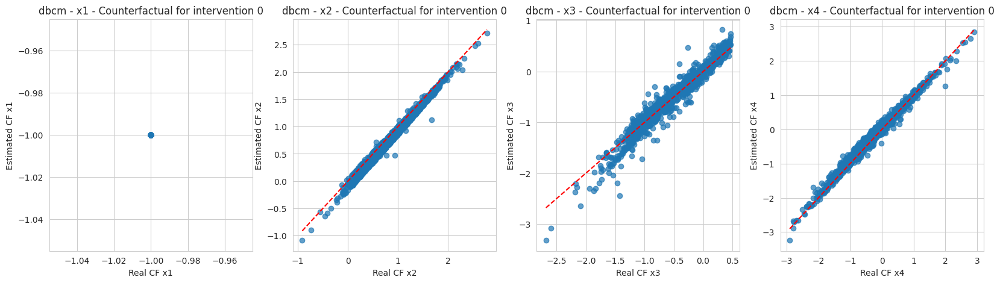

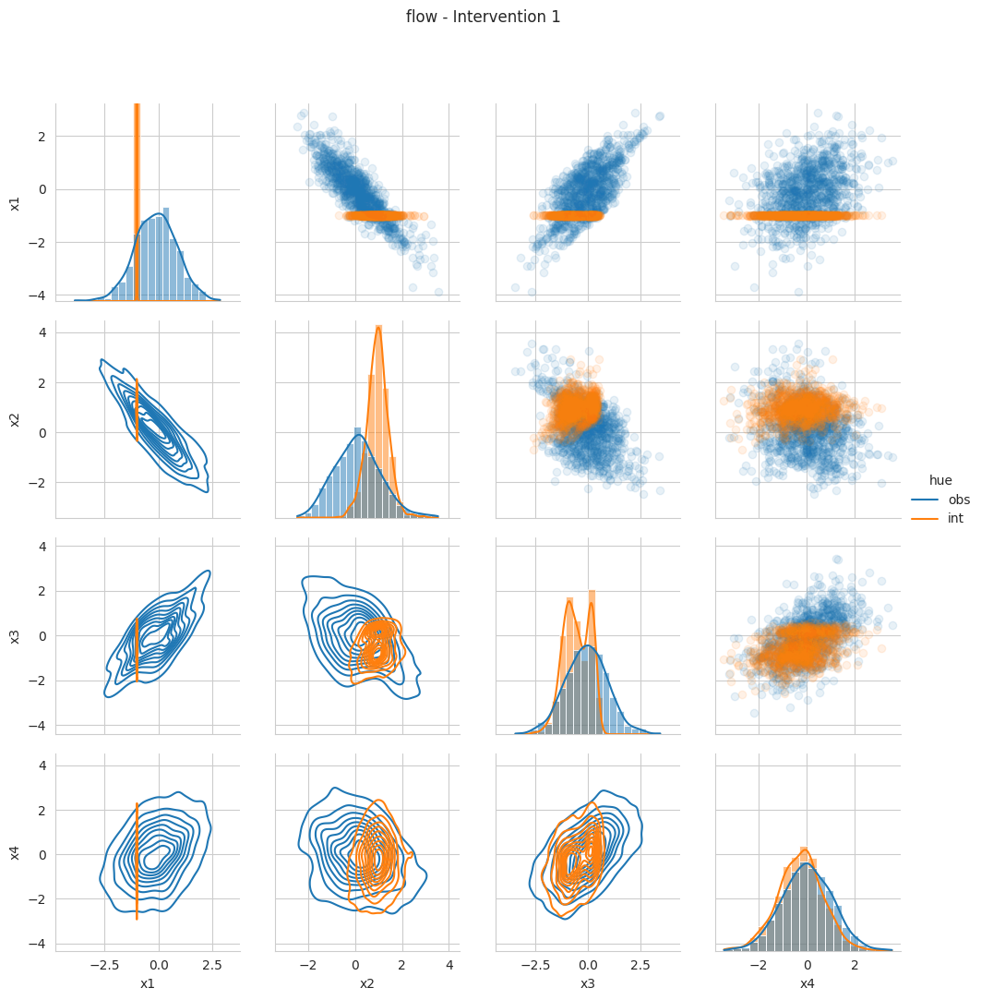

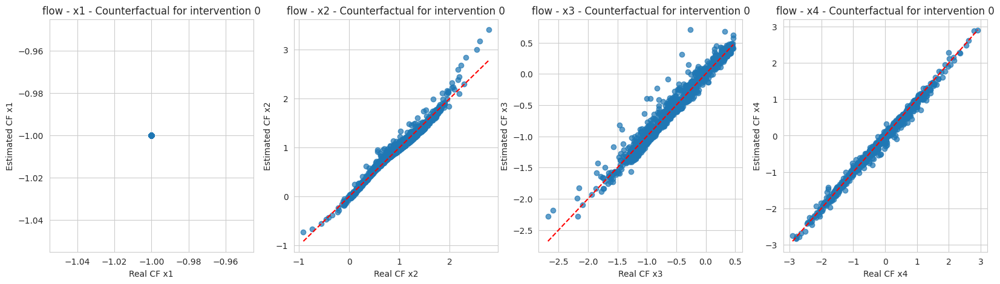

In [8]:
# Put one example of the distributions of observational, interventional and counterfactual samples for one dataset and n, for all models
results_bdir = str(get_experiment_paths('continuous').root)
samples_dir = os.path.join(results_bdir, 'samples')
dataset = 'simpson-non-linear'
n = 1000
n_interventions = 1  # Number of interventions that we have, max is 6

model_names = ['kan', 'kaam', 'anm', 'dbcm', 'flow']  # Models used for evaluation

factual_eval = pd.read_csv(os.path.join(samples_dir, f"{dataset}_factual_eval_n_{n}.csv"))
cf_eval = [pd.read_csv(os.path.join(samples_dir, f"{dataset}_cf_eval_n_{n}_{i}.csv")) for i in range(n_interventions)]

for model_name in model_names:
    obs_model = pd.read_csv(os.path.join(samples_dir, f"{dataset}_obs_samples_n_{n}_{model_name}.csv"))
    int_model = [pd.read_csv(os.path.join(samples_dir, f"{dataset}_int_samples_n_{n}_{model_name}_{intervention}.csv")) for intervention in range(n_interventions)]
    cf_estimates = [pd.read_csv(os.path.join(samples_dir, f"{dataset}_cf_estimates_n_{n}_{model_name}_{intervention}.csv")) for intervention in range(n_interventions)]
    nodes = factual_eval.columns

    obs_model['hue'] = 'obs'
    for intervention in range(n_interventions):
        int_model[intervention]['hue'] = f'int'
        # Add a little noise to x1, x2 for the KDE (these are the intervened variables, done to prevent errors in KDE)
        int_model[intervention]['x1'] += 0.01 * np.random.randn(len(int_model[intervention]))
        int_model[intervention]['x2'] += 0.01 * np.random.randn(len(int_model[intervention]))
        data = pd.concat([obs_model, int_model[intervention]], ignore_index=True)
        #g = sns.pairplot(data=data, hue='hue', diag_kind='hist', diag_kws=dict(stat='count', kde=True))
        #g.map_upper(sns.kdeplot, levels=4, hue='hue')

        g = sns.PairGrid(data, hue='hue')
        g.map_upper(plt.scatter, alpha=0.1)
        g.map_lower(sns.kdeplot, common_norm=False)
        g.map_diag(sns.histplot, kde=True, stat='proportion', common_norm=False, bins=20)
        _ = g.add_legend()

        for i in range(len(nodes)):
            g.diag_axes[i].set_ylim((0, 0.3)) # NOTE: carefully adjust this to obtain meaningful plots, i.e., the intervention, being discrete, causes a mess

        g.figure.suptitle(f'{model_name} - Intervention {intervention + 1}', y=1.08)
        plt.show()

        plt.subplots(1, len(nodes), figsize=(5 * len(nodes), 5))
        for i, node in enumerate(nodes):
            plt.subplot(1, len(nodes), i + 1)
            plt.scatter(cf_eval[intervention][node], cf_estimates[intervention][node], alpha=0.7)
            plt.plot([cf_eval[intervention][node].min(), cf_eval[intervention][node].max()], [cf_eval[intervention][node].min(), cf_eval[intervention][node].max()], 'r--')
            plt.xlabel(f'Real CF { node}')
            plt.ylabel(f'Estimated CF { node}')
            plt.title(f'{model_name} - {node} - Counterfactual for intervention {intervention}')
        plt.show()



# DISCRETE EXPERIMENT

In [11]:
datasets = ['3-chain-linear', '3-chain-non-linear', '4-chain-linear', '5-chain-linear', 'collider-linear', 'fork-linear', 'fork-non-linear', 'simpson-non-linear', 'simpson-symprod', 'triangle-linear', 'triangle-non-linear']  # Datasets used for evaluation
n = 1000  # Number of samples
model_names = ['kan_mixed', 'kaam_mixed', 'kan', 'kaam', 'anm', 'dbcm', 'flow']  # Models used for evaluation
metrics = ['rf_acc_obs', 'mmd_obs', 'rf_acc_int', 'mmd_int']  # Metrics used for evaluation
kaam_metrics = ['mae_uniform', 'mae_weighted']  # Additional metrics for KAAM (goodness of fit of the formula)

results_bdir = str(get_experiment_paths('discrete').root)
data_dir = os.path.join(results_bdir, 'data')

results_table_kaam = []  # Dataset, n, node, kaam metrics, formula, formula_gt, training time
results_table_all = []  # Dataset, n, metrics and times per model
metrics_array = np.zeros((len(model_names), len(metrics), len(datasets)))  # model, metric, dataset

names_not_kaam = ['training_time', 'model'] + [m + '_avg' for m in metrics] + ['rf_acc_int_all', 'mmd_int_all', 'mse_cf_all']  # Names of results that are not node-specific and not KAAM-specific

for i_d, dataset in enumerate(datasets):
    for i_m, model_name in enumerate(model_names):
        results_file = os.path.join(data_dir, f"{dataset}_results_n_{n}_{model_name}.pkl")
        if os.path.exists(results_file):
            with open(results_file, 'rb') as f:
                results = pickle.load(f)
            # Prepare KAAM detailed table
            for node, r in results.items():
                if node not in names_not_kaam and 'kaam' in model_name:
                    results_table_kaam.append([dataset, node, model_name] + [str(r[m]) for m in kaam_metrics] + [str(r['formula']), str(r['formula_gt']), results['training_time']])
            # Prepare all models summary table
            results_table_all.append([dataset, model_name] + [results[m + '_avg'] for m in metrics] + [results['training_time']])
            # Fill metrics array for statistical analysis
            for imetric, m in enumerate(metrics):
                if results[m + '_avg'] is None:
                    metrics_array[i_m, imetric, i_d] = 100  # Assign a high value if the metric is None
                else:
                    metrics_array[i_m, imetric, i_d] = results[m + '_avg']
        else:
            print(f"Results file {results_file} not found.")
print('\n\n Average results per dataset and n (all models):')
print(tabulate(results_table_all, headers=['Dataset', 'model'] + metrics + ['Time '], floatfmt=".4f", tablefmt="fancy_grid"))

# Compute a new table, where we compute average and std for each dataset
results_table_avg = []
for model_name in model_names:
    data_to_average = []
    for row in results_table_all:
        if row[1] == model_name:
            data_to_average.append(row[2:])
    data_to_average = np.array(data_to_average)
    mean = np.mean(data_to_average, axis=0)
    std = np.std(data_to_average, axis=0)
    string_row = [model_name] + [f'{mean[i]:.6f} ({std[i]:.6f})' for i in range(len(mean))]
    results_table_avg.append(string_row)

print('\n\n Average results per dataset (all models, average and std):')
print(tabulate(results_table_avg, headers=['Model'] + metrics + ['Time '], floatfmt=".4f", tablefmt="latex"))

#Statistical analysis
get_p_values_from_table_data(metrics_array, alpha=0.05, higher_is_better=False, output_latex=True, list_of_methods=model_names, list_of_metrics=metrics)

# Joint statistical analysis
for i in range(2):
    metrics_idxs = (i * 2, i * 2 + 1)
    metric_names = [metrics[i] for i in metrics_idxs]
    print(f'\n\n STATISTICAL ANALYSYS FOR METRICS {metric_names}')
    get_p_values_from_table_data(metrics_array[:, metrics_idxs, :], alpha=0.05, higher_is_better=False, output_latex=True, list_of_methods=model_names, list_of_metrics=metric_names)


print('\n\n Detailed results per node (KAAM):')
print(tabulate(results_table_kaam, headers=['Dataset', 'Node' , 'Model'] + kaam_metrics + ['Formula', 'Formula GT', 'Training Time (s)'], floatfmt=".4f", tablefmt="fancy_grid"))




 Average results per dataset and n (all models):
╒═════════════════════╤════════════╤══════════════╤═══════════╤══════════════╤═══════════╤══════════╕
│ Dataset             │ model      │   rf_acc_obs │   mmd_obs │   rf_acc_int │   mmd_int │    Time  │
╞═════════════════════╪════════════╪══════════════╪═══════════╪══════════════╪═══════════╪══════════╡
│ 3-chain-linear      │ kan_mixed  │       0.5025 │    0.0007 │       0.5117 │    0.0024 │  12.7149 │
├─────────────────────┼────────────┼──────────────┼───────────┼──────────────┼───────────┼──────────┤
│ 3-chain-linear      │ kaam_mixed │       0.5025 │    0.0007 │       0.5117 │    0.0024 │  12.3338 │
├─────────────────────┼────────────┼──────────────┼───────────┼──────────────┼───────────┼──────────┤
│ 3-chain-linear      │ kan        │       0.5150 │    0.0009 │       0.5237 │    0.0036 │   1.1342 │
├─────────────────────┼────────────┼──────────────┼───────────┼──────────────┼───────────┼──────────┤
│ 3-chain-linear      │ kaam   

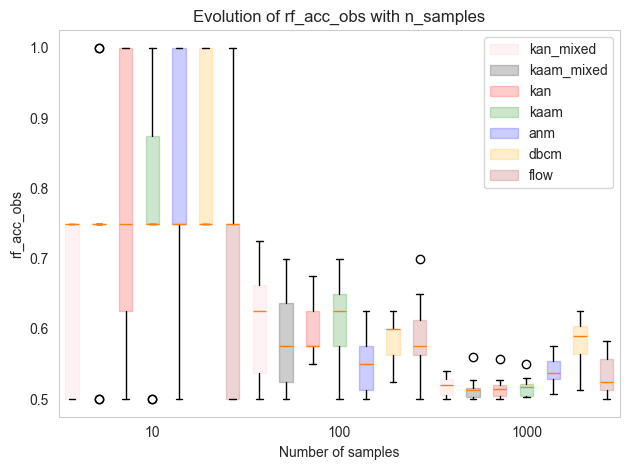

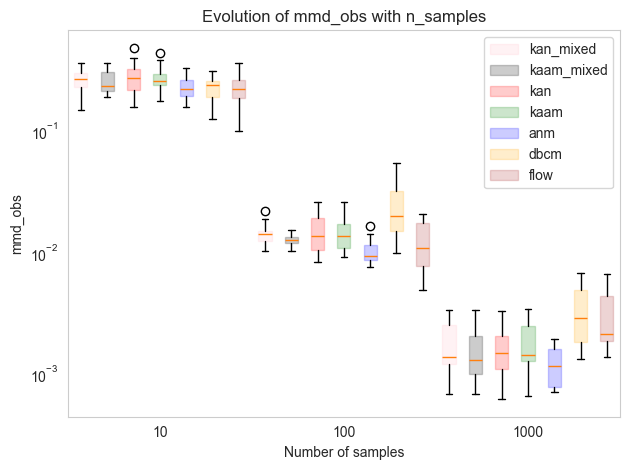

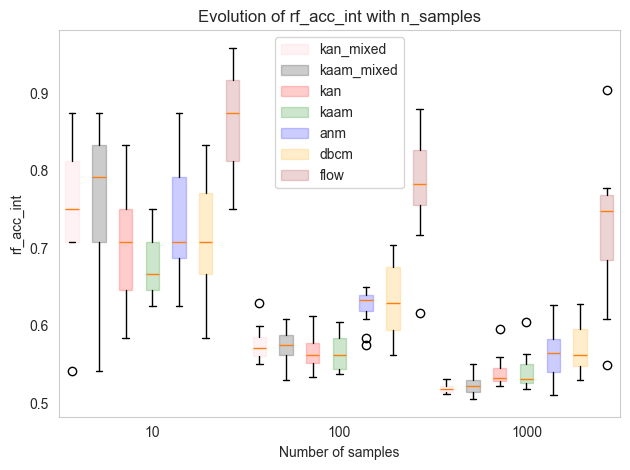

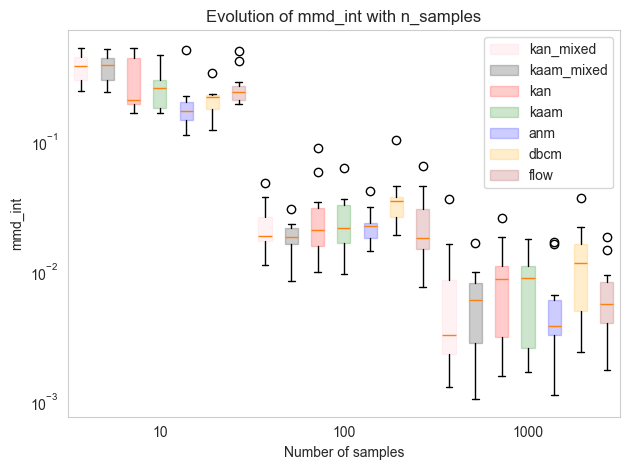

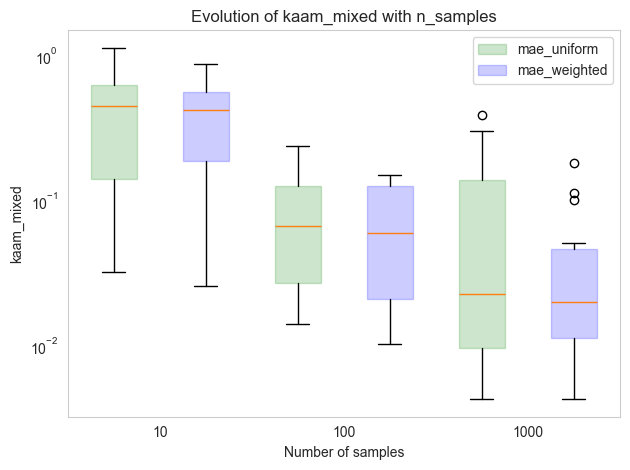

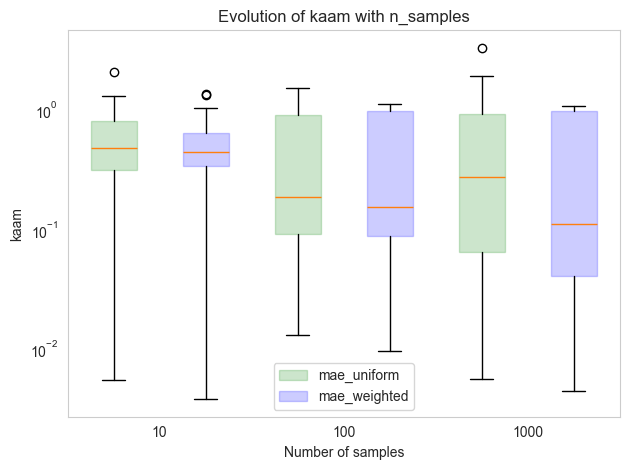

In [15]:
# Evolution of metrics with the sample size
datasets = ['3-chain-linear', '3-chain-non-linear', '4-chain-linear', '5-chain-linear', 'collider-linear', 'fork-linear', 'fork-non-linear', 'simpson-non-linear', 'simpson-symprod', 'triangle-linear', 'triangle-non-linear']  # Datasets used for evaluation
n_samples = [10, 100, 1000]
model_names = ['kan_mixed', 'kaam_mixed', 'kan', 'kaam', 'anm', 'dbcm', 'flow']  # Models used for evaluation
metrics = ['rf_acc_obs', 'mmd_obs', 'rf_acc_int', 'mmd_int']  # Metrics used for evaluation
kaam_metrics = ['mae_uniform', 'mae_weighted']  # Additional metrics for KAAM (goodness of fit of the formula)
colors = {'kan': 'r', 'kaam': 'g', 'anm': 'b', 'dbcm': 'orange', 'kan_mixed': 'pink', 'kaam_mixed': 'k', 'flow': 'brown'}
names_not_kaam = ['training_time', 'model'] + [m + '_avg' for m in metrics] + ['rf_acc_int_all', 'mmd_int_all', 'mse_cf_all']  # Names of results that are not node-specific and not KAAM-specific

results_bdir = str(get_experiment_paths('discrete').root)
data_dir = os.path.join(results_bdir, 'data')

results_metrics = {}

for n in n_samples:
    results_metrics[str(n)] = {}
    for i_m, model_name in enumerate(model_names):
        results_metrics[str(n)][model_name] = {}
        for metric in metrics:
            results_metrics[str(n)][model_name][metric] = []
            if model_name == 'kaam' or model_name == 'kaam_mixed':
                for kaam_metric in kaam_metrics:
                    results_metrics[str(n)][model_name][kaam_metric] = []
        for i_d, dataset in enumerate(datasets):
            results_file = os.path.join(data_dir, f"{dataset}_results_n_{n}_{model_name}.pkl")
            if os.path.exists(results_file):
                with open(results_file, 'rb') as f:
                    results = pickle.load(f)
                # Add KAAM metrics
                for kaam_metric in kaam_metrics:
                    for node, r in results.items():
                        if node not in names_not_kaam and 'kaam' in model_name and r[kaam_metric] is not None: # Note that None are source nodes, we do not include them here as they do not train a model
                            results_metrics[str(n)][model_name][kaam_metric].append(r[kaam_metric])
                # Add the rest of metrics
                for metric in metrics:
                    results_metrics[str(n)][model_name][metric].append(results[metric + '_avg'])
            else:
                print(f"Results file {results_file} not found.")
# Prepare for plotting
for metric in metrics:
    # Plot a set of boxplots: in the x-axis put the n, and for each n, plot a boxplot per model of different color
    positions = np.arange(len(n_samples)) * len(model_names)
    for im, model in enumerate(model_names):
        plt.boxplot([results_metrics[str(n)][model][metric] for n in n_samples], positions=positions + im, patch_artist=True, boxprops=dict(facecolor=colors[model], color=colors[model], alpha=0.2), label=model)
    plt.xticks(positions + (len(model_names) - 1)/2, n_samples)
    plt.xlabel('Number of samples')
    plt.ylabel(metric)
    plt.legend(loc='best')
    plt.title(f'Evolution of {metric} with n_samples')
    if 'mmd' in metric or 'mse' in metric:
        plt.yscale('log')
    plt.grid()
    plt.tight_layout()
    plt.show()

# Plot the KAAM metrics
colorsm = {'mae_uniform': 'g', 'mae_weighted': 'b'}
for model in ['kaam_mixed', 'kaam']:
    positions = np.arange(len(n_samples)) * len(kaam_metrics)
    for im, metric in enumerate(kaam_metrics):
        plt.boxplot([results_metrics[str(n)][model][metric] for n in n_samples], positions=positions + im, patch_artist=True, boxprops=dict(facecolor=colorsm[metric], color=colorsm[metric], alpha=0.2), label=metric)
    plt.xticks(positions + (len(kaam_metrics) - 1)/2, n_samples)
    plt.xlabel('Number of samples')
    plt.ylabel(model)
    plt.legend(loc='best')
    plt.title(f'Evolution of {model} with n_samples')
    plt.yscale('log')
    plt.grid()
    plt.tight_layout()
    plt.show()



In [16]:
import copy
results_discrete = copy.deepcopy(results_metrics)

C:\Users\Alex\AppData\Local\Temp\ipykernel_23728\1716649786.py:88: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


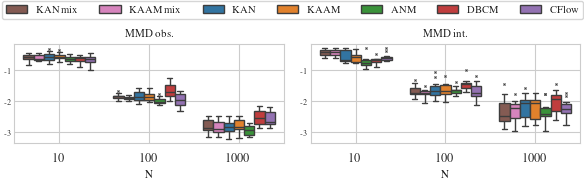

In [19]:
results_df = nested_dict_to_df(results_discrete)
# base seaborn colors
base = sns.color_palette()

# assign colors as if order were: KAN, KAAM, ANM, DBCM, CFlow
palette = {
    'KAN': base[0],
    'KAAM': base[1],
    'ANM': base[2],
    'DBCM': base[3],
    'CFlow': base[4],
    'KAN mix': base[5],   # next colors after CFlow
    'KAAM mix': base[6],
}
with plt.rc_context({**bundles.icml2024(ncols=3)}):
    fig, axs = plt.subplots(
    1, 2,
    figsize=(6, 1.75),)

    metrics_map = {
    "mmd_obs": "MMD obs.",
    "rf_obs": "RF acc. obs.",
    "mmd_int": "MMD int.",
    "rf_int": "RF acc. int.",
    "ate_error": "ATE error",
    "mae_cf": "MAE CF",
    "mse_cf": "MSE CF",
    "hsic": "HSIC",
    "dhsic": "dHSIC",
    }

    model_map = {'kan_mixed': 'KAN mix',
                 'kaam_mixed': 'KAAM mix',
                 'kan': 'KAN',
                 'kaam': 'KAAM',
                 'anm': 'ANM',
                 'dbcm': 'DBCM',
                 'flow': 'CFlow',
                 }

    results_df['Metric'] = results_df['Metric'].map(metrics_map)
    results_df['Model'] =  results_df['Model'].map(model_map)
    metrics_to_plot = ['MMD obs.', 'MMD int.']
    flierprops = dict(
    marker='x',
    markersize=1.5,      # smaller size
    markeredgewidth=0.7
)
    for ii, metric in enumerate(metrics_to_plot):
        sns.boxplot(data=results_df[results_df['Metric'] == metric],
                    x='N', y='value', hue='Model',
                    ax=axs[ii],
                    flierprops=flierprops,
                    palette=palette,
                    )
        axs[ii].set_yscale("log")
    axs[0].legend()
    handles, labels = axs[0].get_legend_handles_labels()
    # remove legends
    for ax in axs:
        ax.legend().remove()
        ax.tick_params(axis='y', which='major', pad=-1)

        ax.tick_params(axis='x', labelsize=9)
        ax.yaxis.set_major_locator(LogLocator(base=10))
        ax.yaxis.set_major_formatter(FuncFormatter(exp_formatter))



    axs[1].sharey(axs[0])
    # axs[1].set_yticklabels([])

    for ax, metric in zip(axs.flat, metrics_to_plot):
        ax.set_ylabel('')
        ax.set_title(metric)
        ax.grid(True)

    # single legend above the plots with frame
    fig.legend(
        handles, labels,
        loc="upper center",
        bbox_to_anchor=(0.5, 1.12),
        ncol=7,
        frameon=True,
        fontsize= 7.7
    )

    plt.tight_layout()
    plt.subplots_adjust(wspace=0.1)
    plt.savefig(get_experiment_paths("paper").figures / "discrete_results.pdf", dpi=300, bbox_inches="tight")
    plt.show()

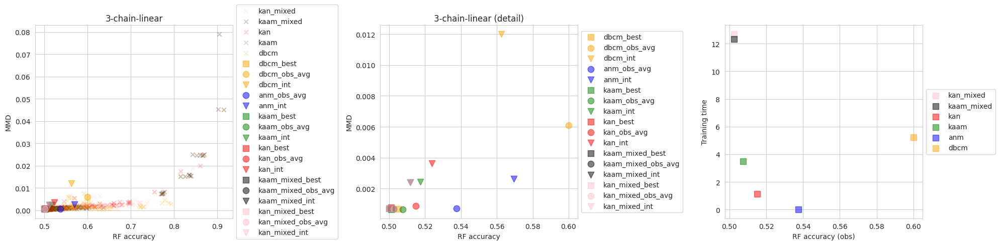

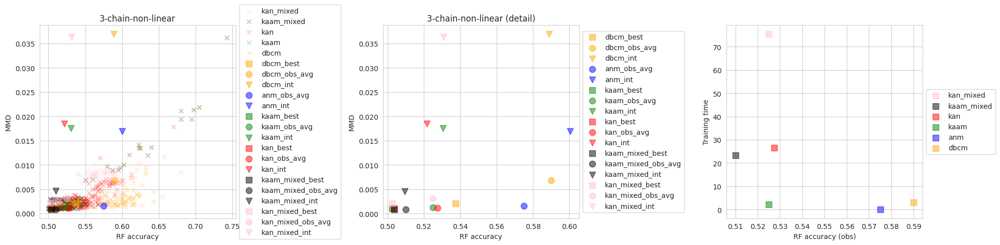

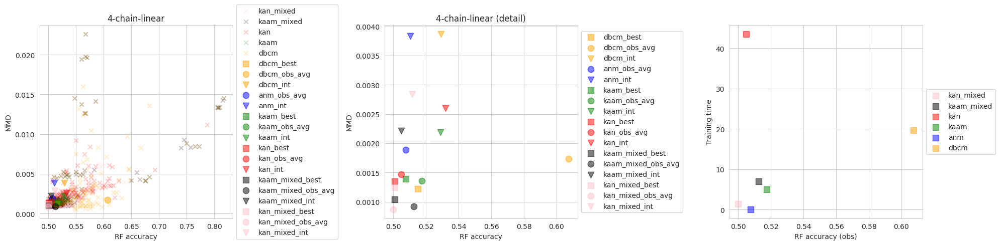

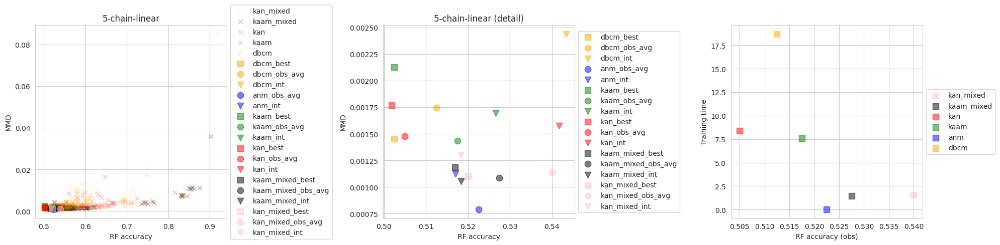

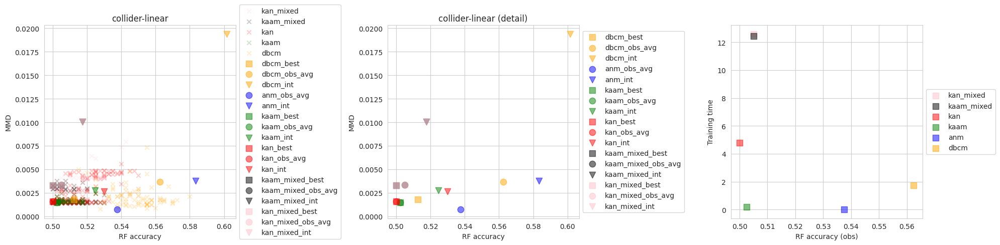

...

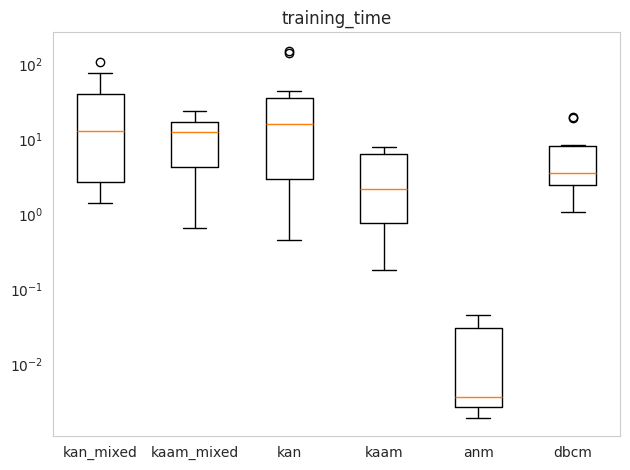

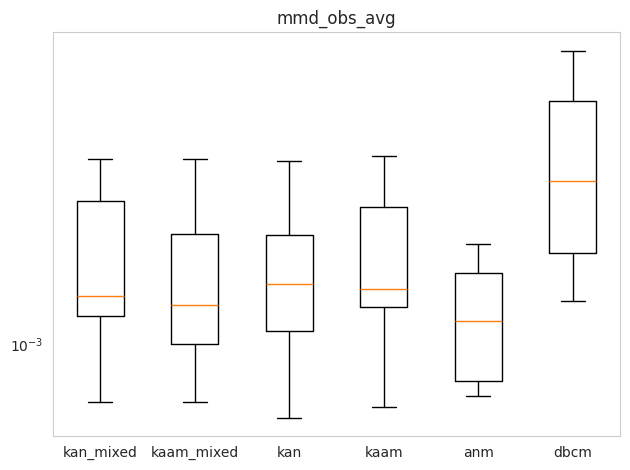

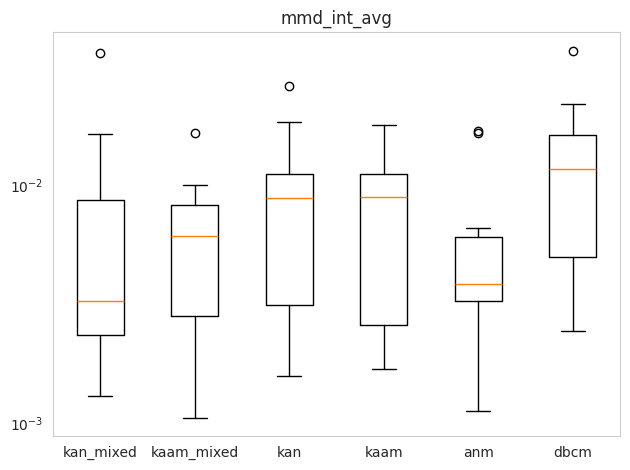

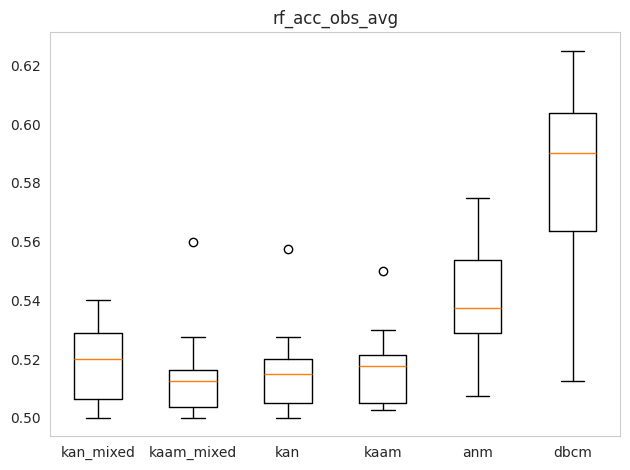

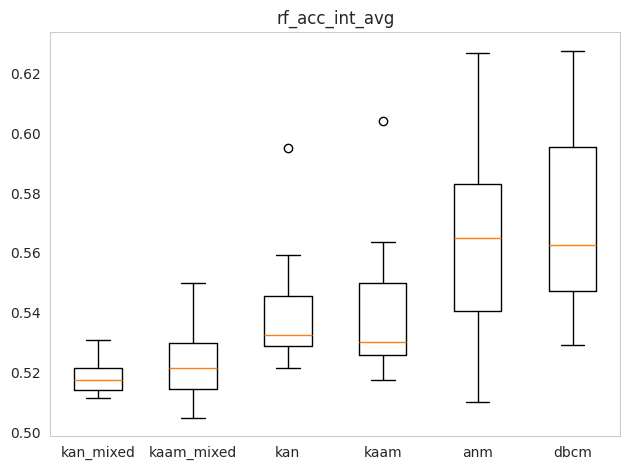

In [11]:
# Show per-dataset metrics comparing models, to see their performance across the board
datasets = ['3-chain-linear', '3-chain-non-linear', '4-chain-linear', '5-chain-linear', 'collider-linear', 'fork-linear', 'fork-non-linear', 'simpson-non-linear', 'simpson-symprod', 'triangle-linear', 'triangle-non-linear']  # Datasets used for evaluation
n = 1000  # Sample sizes used for evaluation
model_names = ['kan_mixed', 'kaam_mixed', 'kan', 'kaam', 'anm', 'dbcm']  # Models used for evaluation
colors = {'kan': 'r', 'kaam': 'g', 'anm': 'b', 'dbcm': 'orange', 'kan_mixed': 'pink', 'kaam_mixed': 'k'}
final_metrics = ['training_time', 'mmd_obs_avg', 'mmd_int_avg', 'rf_acc_obs_avg', 'rf_acc_int_avg']
grid_metrics =  ['mmd', 'rf_acc']

results_bdir = str(get_experiment_paths('discrete').root)
data_dir = os.path.join(results_bdir, 'data')

results_dataset = {}
for i_d, dataset in enumerate(datasets):
    results_all = {}
    for model_name in model_names:
        results_all[model_name] = {}
        results_file = os.path.join(data_dir, f"{dataset}_results_n_{n}_{model_name}.pkl")
        with open(results_file, 'rb') as f:
            results = pickle.load(f)
        for metric in final_metrics:
            results_all[model_name][metric] = results[metric] # Final results obtained

        if model_name != 'anm':  # Only model without grid search!
            if model_name == 'kaam':
                grid_search_results = os.path.join(data_dir, f"best_params_kan_{dataset}.pkl")  # KAAM uses the KAN grid search
            elif model_name == 'kaam_mixed':
                grid_search_results = os.path.join(data_dir, f"best_params_kan_mixed_{dataset}.pkl")
            else:
                grid_search_results = os.path.join(data_dir, f"best_params_{model_name}_{dataset}.pkl")
            with open(grid_search_results, 'rb') as f:
                grid_results = pickle.load(f)

            if model_name == 'kaam' or model_name == 'kaam_mixed':
                _, _, graph, _ = graph_data(name=dataset).generate(100, seed=0)
                best_params = get_kaam_hyperparameters(grid_results['results_all'], graph=graph)
            else:
                best_params = grid_results['best_params']

            for metric in grid_metrics:
                if model_name in ['kan', 'kaam', 'kan_mixed', 'kaam_mixed']:
                    aux = []
                    for key in best_params.keys():
                        aux.append(best_params[key][metric]['all'])
                    results_all[model_name][f'{metric}_best'] = sum(aux) / len(aux)  # Best metrics according to the grid search, note that this need not be equal to the one actually obtained...
                else:
                    results_all[model_name][f'{metric}_best'] = best_params[metric]['all']  # Best metrics according to the grid search
                results_all[model_name][f'{metric}_grid'] = []
                for grid_element in grid_results['results_all']:
                    if model_name == 'kaam' or model_name == 'kaam_mixed':
                        if grid_element[0]['mult_kan'] == False and grid_element[0]['hidden_dim'] == 0:
                            results_all[model_name][f'{metric}_grid'].append(grid_element[0][metric]['all']) # Grid element of a KAAM
                    else:
                        results_all[model_name][f'{metric}_grid'].append(grid_element[0][metric]['all']) # Grid element

    # First plot: scatter all RF accuracies and MMD per models to see their values
    fig = plt.subplots(1, 3, figsize=[20, 5])
    for i in range(2):  # To plot a secondary zoomed image
        plt.subplot(1, 3, i + 1)
        for model_name in model_names:
            if model_name != 'anm' and i < 0.5:
                plt.scatter(results_all[model_name]['rf_acc_grid'], results_all[model_name]['mmd_grid'], alpha=0.2, label=f'{model_name}', marker='x', color=colors[model_name])
        for model_name in reversed(model_names):
            if model_name != 'anm':
                plt.scatter(results_all[model_name]['rf_acc_best'], results_all[model_name]['mmd_best'], alpha=0.5, label=f'{model_name}_best', marker='s', color=colors[model_name], s=80)
            plt.scatter(results_all[model_name]['rf_acc_obs_avg'], results_all[model_name]['mmd_obs_avg'], alpha=0.5, label=f'{model_name}_obs_avg', marker='o', color=colors[model_name], s=80)
            plt.scatter(results_all[model_name]['rf_acc_int_avg'], results_all[model_name]['mmd_int_avg'], alpha=0.5, label=f'{model_name}_int', marker='v', color=colors[model_name], s=80)
        plt.xlabel('RF accuracy')
        plt.ylabel('MMD')
        if i == 0:
            plt.title(f'{dataset}')
        else:
            plt.title(f'{dataset} (detail)') # The second image does not show the grid results
        plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
        plt.tight_layout()

    # Subplot 3: RF acc vs time
    for model_name in model_names:
        plt.subplot(1, 3, 3)
        plt.scatter(results_all[model_name]['rf_acc_obs_avg'], results_all[model_name]['training_time'], alpha=0.5, label=f'{model_name}', marker='s', color=colors[model_name], s=80)
    plt.xlabel('RF accuracy (obs)')
    plt.ylabel('Training time')
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.tight_layout()

    plt.show()

    results_dataset[dataset] = results_all

# Now, put boxplots across all metrics to compare all methods on their chosen parameters
for metric in final_metrics:
    r_m = {}
    for model_name in model_names:
        r_m[model_name] = [results_dataset[d][model_name][metric] for d in datasets]
    plt.boxplot([r_m[model_name] for model_name in model_names])
    # Add the model_names as x_ticks
    plt.xticks(np.arange(1, len(model_names) + 1), model_names)
    plt.title(metric)
    if 'mmd' in metric or 'mse' in metric or 'time' in metric:
        plt.yscale('log')
    plt.grid()
    plt.tight_layout()
    plt.show()

In [12]:
# Ablation study: how many KAN are KAAMs?
datasets = ['3-chain-linear', '3-chain-non-linear', '4-chain-linear', '5-chain-linear', 'collider-linear', 'fork-linear', 'fork-non-linear', 'simpson-non-linear', 'simpson-symprod', 'triangle-linear', 'triangle-non-linear']  # Datasets used for evaluation

results_bdir = str(get_experiment_paths('discrete').root)
data_dir = os.path.join(results_bdir, 'data')

for model_name in ['kan_mixed', 'kan']:
    for dataset in datasets:
        fname = os.path.join(data_dir, f"best_params_{model_name}_{dataset}.pkl")
        if os.path.exists(fname):
            with open(fname, 'rb') as f:
                results = pickle.load(f)
            num_kaams = 0
            num_elements = 0
            for node in results['best_params'].keys():
                num_elements += 1
                hidden_dim = results['best_params'][node]['hidden_dim']
                mult_kan = results['best_params'][node]['mult_kan']
                if hidden_dim == 0 and not mult_kan:
                    num_kaams += 1
            print(f' For dataset {dataset}, the {model_name} IS a KAAM in {num_kaams} KANs out of {num_elements}')
    print('\n')


 For dataset 3-chain-linear, the kan_mixed IS a KAAM in 2 KANs out of 2
 For dataset 3-chain-non-linear, the kan_mixed IS a KAAM in 0 KANs out of 2
 For dataset 4-chain-linear, the kan_mixed IS a KAAM in 1 KANs out of 3
 For dataset 5-chain-linear, the kan_mixed IS a KAAM in 2 KANs out of 4
 For dataset collider-linear, the kan_mixed IS a KAAM in 1 KANs out of 1
 For dataset fork-linear, the kan_mixed IS a KAAM in 1 KANs out of 2
 For dataset fork-non-linear, the kan_mixed IS a KAAM in 0 KANs out of 2
 For dataset simpson-non-linear, the kan_mixed IS a KAAM in 0 KANs out of 3
 For dataset simpson-symprod, the kan_mixed IS a KAAM in 0 KANs out of 3
 For dataset triangle-linear, the kan_mixed IS a KAAM in 1 KANs out of 2
 For dataset triangle-non-linear, the kan_mixed IS a KAAM in 1 KANs out of 2


 For dataset 3-chain-linear, the kan IS a KAAM in 1 KANs out of 2
 For dataset 3-chain-non-linear, the kan IS a KAAM in 1 KANs out of 2
 For dataset 4-chain-linear, the kan IS a KAAM in 0 KANs

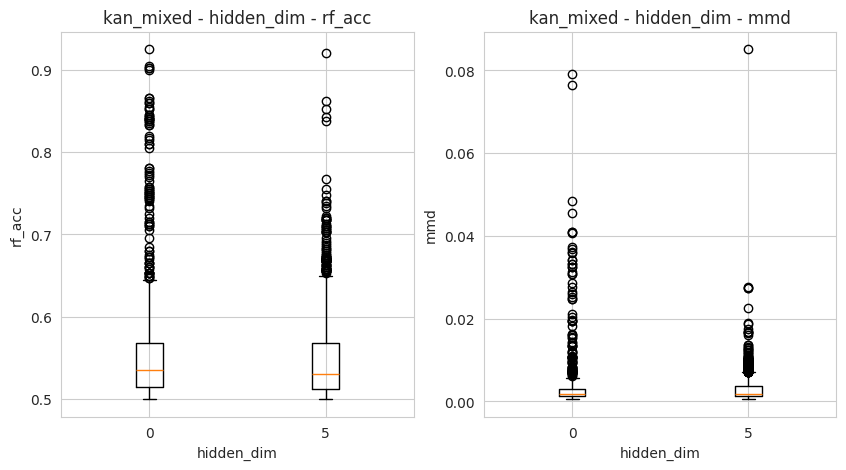



 kan_mixed - hidden_dim - Best parameter values selected for each dataset:
Value 0: selected 9 times (81.8%)
Value 5: selected 17 times (154.5%)


 kan_mixed - hidden_dim - Mean and Median values:
╒══════════════╤════════════════════════════════╤════════════════════════════════╕
│   hidden_dim │ rf_acc                         │ mmd                            │
╞══════════════╪════════════════════════════════╪════════════════════════════════╡
│            0 │ 0.5606 (mean), 0.5350 (median) │ 0.0036 (mean), 0.0017 (median) │
├──────────────┼────────────────────────────────┼────────────────────────────────┤
│            5 │ 0.5473 (mean), 0.5300 (median) │ 0.0029 (mean), 0.0017 (median) │
╘══════════════╧════════════════════════════════╧════════════════════════════════╛


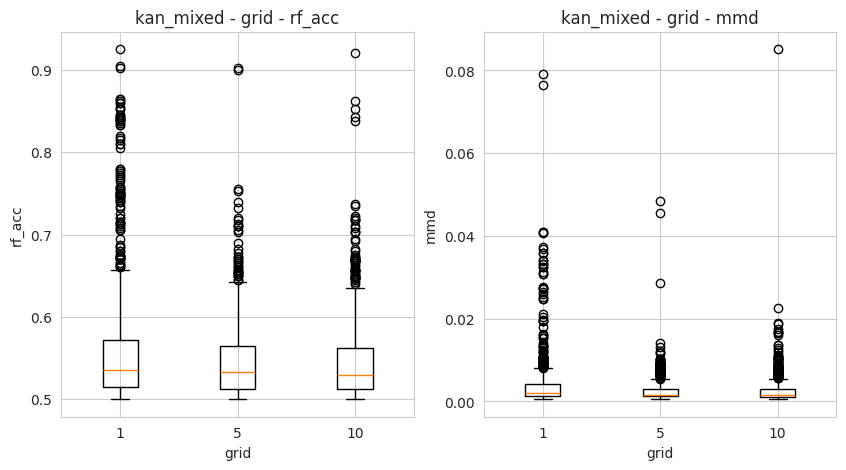



 kan_mixed - grid - Best parameter values selected for each dataset:
Value 1: selected 11 times (100.0%)
Value 5: selected 5 times (45.5%)
Value 10: selected 10 times (90.9%)


 kan_mixed - grid - Mean and Median values:
╒════════╤════════════════════════════════╤════════════════════════════════╕
│   grid │ rf_acc                         │ mmd                            │
╞════════╪════════════════════════════════╪════════════════════════════════╡
│      1 │ 0.5634 (mean), 0.5350 (median) │ 0.0042 (mean), 0.0019 (median) │
├────────┼────────────────────────────────┼────────────────────────────────┤
│      5 │ 0.5460 (mean), 0.5325 (median) │ 0.0026 (mean), 0.0016 (median) │
├────────┼────────────────────────────────┼────────────────────────────────┤
│     10 │ 0.5459 (mean), 0.5300 (median) │ 0.0027 (mean), 0.0016 (median) │
╘════════╧════════════════════════════════╧════════════════════════════════╛


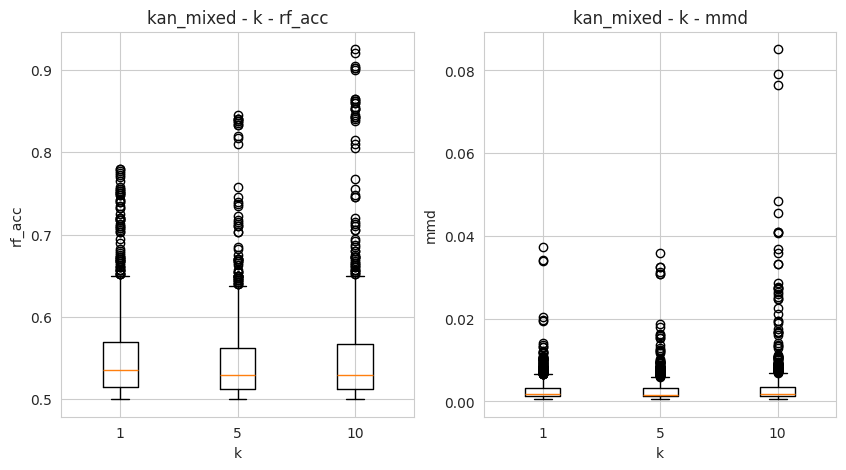



 kan_mixed - k - Best parameter values selected for each dataset:
Value 1: selected 11 times (100.0%)
Value 5: selected 8 times (72.7%)
Value 10: selected 7 times (63.6%)


 kan_mixed - k - Mean and Median values:
╒═════╤════════════════════════════════╤════════════════════════════════╕
│   k │ rf_acc                         │ mmd                            │
╞═════╪════════════════════════════════╪════════════════════════════════╡
│   1 │ 0.5529 (mean), 0.5350 (median) │ 0.0029 (mean), 0.0017 (median) │
├─────┼────────────────────────────────┼────────────────────────────────┤
│   5 │ 0.5485 (mean), 0.5300 (median) │ 0.0029 (mean), 0.0017 (median) │
├─────┼────────────────────────────────┼────────────────────────────────┤
│  10 │ 0.5540 (mean), 0.5300 (median) │ 0.0038 (mean), 0.0018 (median) │
╘═════╧════════════════════════════════╧════════════════════════════════╛


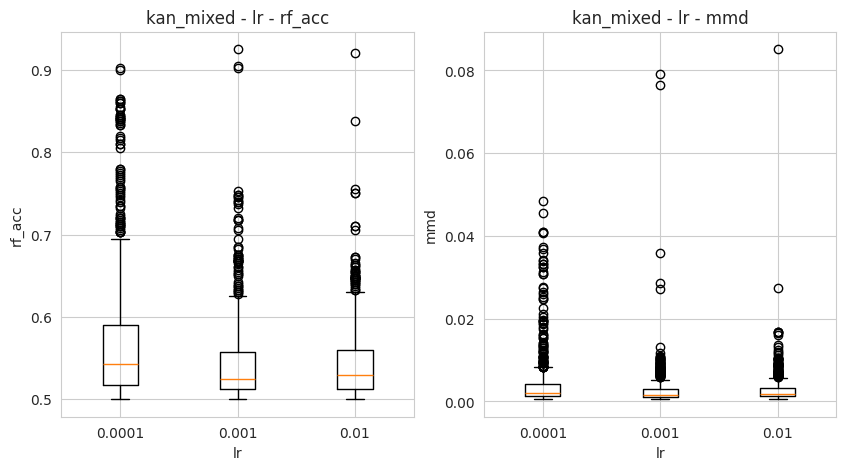



 kan_mixed - lr - Best parameter values selected for each dataset:
Value 0.0001: selected 7 times (63.6%)
Value 0.001: selected 7 times (63.6%)
Value 0.01: selected 12 times (109.1%)


 kan_mixed - lr - Mean and Median values:
╒════════╤════════════════════════════════╤════════════════════════════════╕
│     lr │ rf_acc                         │ mmd                            │
╞════════╪════════════════════════════════╪════════════════════════════════╡
│ 0.0001 │ 0.5694 (mean), 0.5425 (median) │ 0.0041 (mean), 0.0020 (median) │
├────────┼────────────────────────────────┼────────────────────────────────┤
│ 0.001  │ 0.5427 (mean), 0.5250 (median) │ 0.0027 (mean), 0.0015 (median) │
├────────┼────────────────────────────────┼────────────────────────────────┤
│ 0.01   │ 0.5432 (mean), 0.5300 (median) │ 0.0028 (mean), 0.0017 (median) │
╘════════╧════════════════════════════════╧════════════════════════════════╛


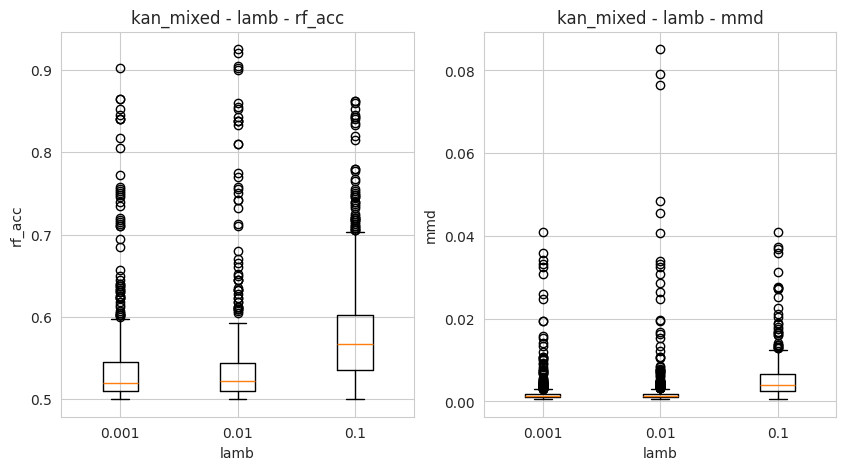



 kan_mixed - lamb - Best parameter values selected for each dataset:
Value 0.001: selected 17 times (154.5%)
Value 0.01: selected 7 times (63.6%)
Value 0.1: selected 2 times (18.2%)


 kan_mixed - lamb - Mean and Median values:
╒════════╤════════════════════════════════╤════════════════════════════════╕
│   lamb │ rf_acc                         │ mmd                            │
╞════════╪════════════════════════════════╪════════════════════════════════╡
│  0.001 │ 0.5365 (mean), 0.5200 (median) │ 0.0021 (mean), 0.0014 (median) │
├────────┼────────────────────────────────┼────────────────────────────────┤
│  0.01  │ 0.5377 (mean), 0.5225 (median) │ 0.0025 (mean), 0.0014 (median) │
├────────┼────────────────────────────────┼────────────────────────────────┤
│  0.1   │ 0.5812 (mean), 0.5675 (median) │ 0.0050 (mean), 0.0039 (median) │
╘════════╧════════════════════════════════╧════════════════════════════════╛


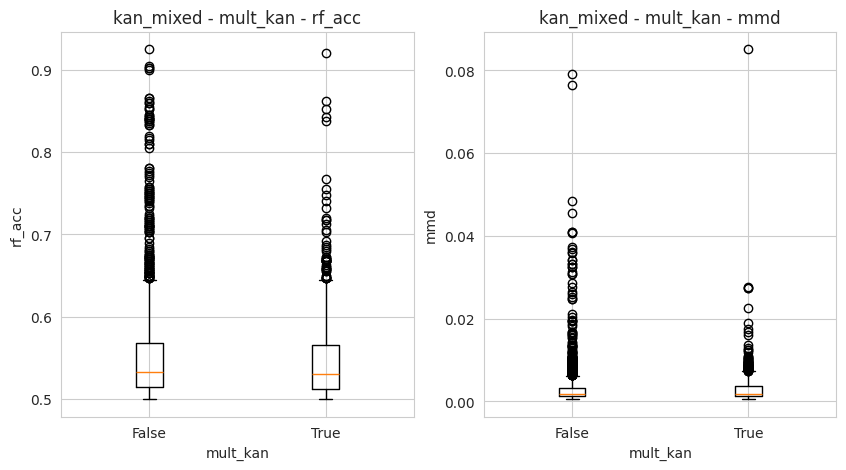



 kan_mixed - mult_kan - Best parameter values selected for each dataset:
Value False: selected 16 times (145.5%)
Value True: selected 10 times (90.9%)


 kan_mixed - mult_kan - Mean and Median values:
╒════════════╤════════════════════════════════╤════════════════════════════════╕
│ mult_kan   │ rf_acc                         │ mmd                            │
╞════════════╪════════════════════════════════╪════════════════════════════════╡
│ False      │ 0.5540 (mean), 0.5325 (median) │ 0.0032 (mean), 0.0017 (median) │
├────────────┼────────────────────────────────┼────────────────────────────────┤
│ True       │ 0.5473 (mean), 0.5300 (median) │ 0.0031 (mean), 0.0018 (median) │
╘════════════╧════════════════════════════════╧════════════════════════════════╛


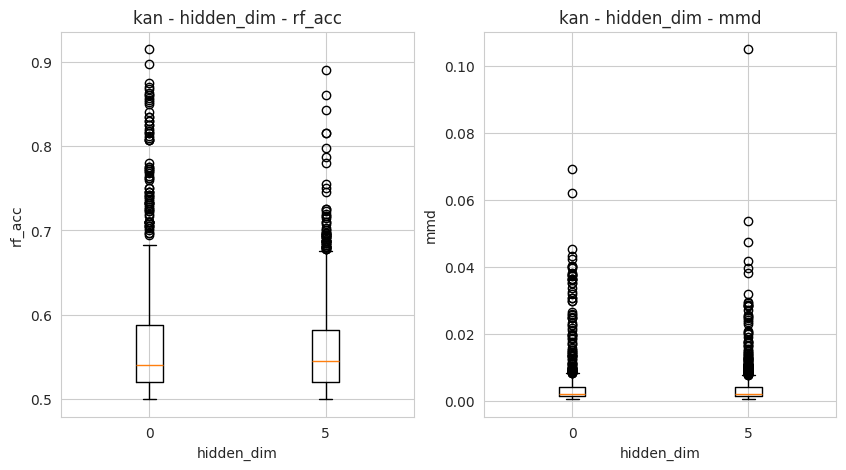



 kan - hidden_dim - Best parameter values selected for each dataset:
Value 0: selected 10 times (90.9%)
Value 5: selected 16 times (145.5%)


 kan - hidden_dim - Mean and Median values:
╒══════════════╤════════════════════════════════╤════════════════════════════════╕
│   hidden_dim │ rf_acc                         │ mmd                            │
╞══════════════╪════════════════════════════════╪════════════════════════════════╡
│            0 │ 0.5687 (mean), 0.5400 (median) │ 0.0044 (mean), 0.0020 (median) │
├──────────────┼────────────────────────────────┼────────────────────────────────┤
│            5 │ 0.5580 (mean), 0.5450 (median) │ 0.0035 (mean), 0.0022 (median) │
╘══════════════╧════════════════════════════════╧════════════════════════════════╛


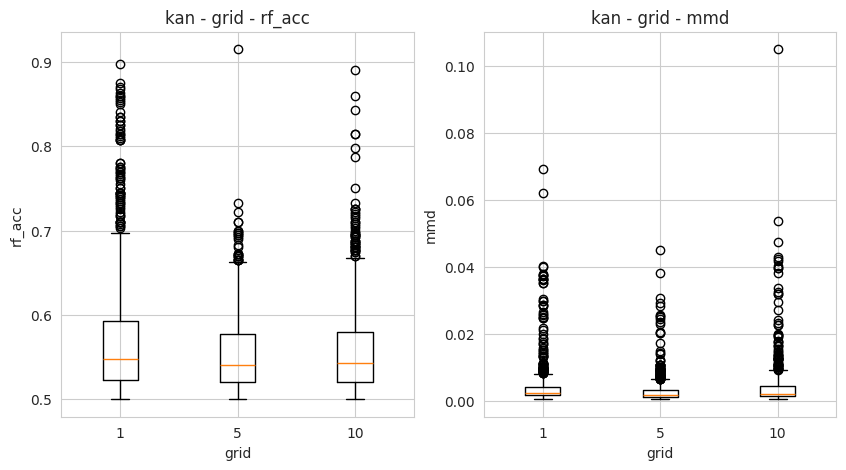



 kan - grid - Best parameter values selected for each dataset:
Value 1: selected 11 times (100.0%)
Value 5: selected 8 times (72.7%)
Value 10: selected 7 times (63.6%)


 kan - grid - Mean and Median values:
╒════════╤════════════════════════════════╤════════════════════════════════╕
│   grid │ rf_acc                         │ mmd                            │
╞════════╪════════════════════════════════╪════════════════════════════════╡
│      1 │ 0.5718 (mean), 0.5475 (median) │ 0.0042 (mean), 0.0024 (median) │
├────────┼────────────────────────────────┼────────────────────────────────┤
│      5 │ 0.5538 (mean), 0.5400 (median) │ 0.0031 (mean), 0.0019 (median) │
├────────┼────────────────────────────────┼────────────────────────────────┤
│     10 │ 0.5592 (mean), 0.5425 (median) │ 0.0041 (mean), 0.0021 (median) │
╘════════╧════════════════════════════════╧════════════════════════════════╛


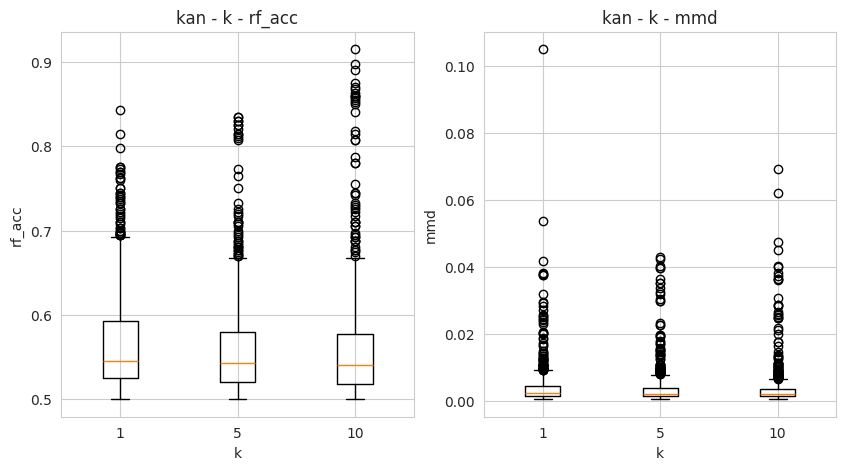



 kan - k - Best parameter values selected for each dataset:
Value 1: selected 5 times (45.5%)
Value 5: selected 13 times (118.2%)
Value 10: selected 8 times (72.7%)


 kan - k - Mean and Median values:
╒═════╤════════════════════════════════╤════════════════════════════════╕
│   k │ rf_acc                         │ mmd                            │
╞═════╪════════════════════════════════╪════════════════════════════════╡
│   1 │ 0.5666 (mean), 0.5450 (median) │ 0.0041 (mean), 0.0023 (median) │
├─────┼────────────────────────────────┼────────────────────────────────┤
│   5 │ 0.5584 (mean), 0.5425 (median) │ 0.0037 (mean), 0.0020 (median) │
├─────┼────────────────────────────────┼────────────────────────────────┤
│  10 │ 0.5598 (mean), 0.5400 (median) │ 0.0037 (mean), 0.0020 (median) │
╘═════╧════════════════════════════════╧════════════════════════════════╛


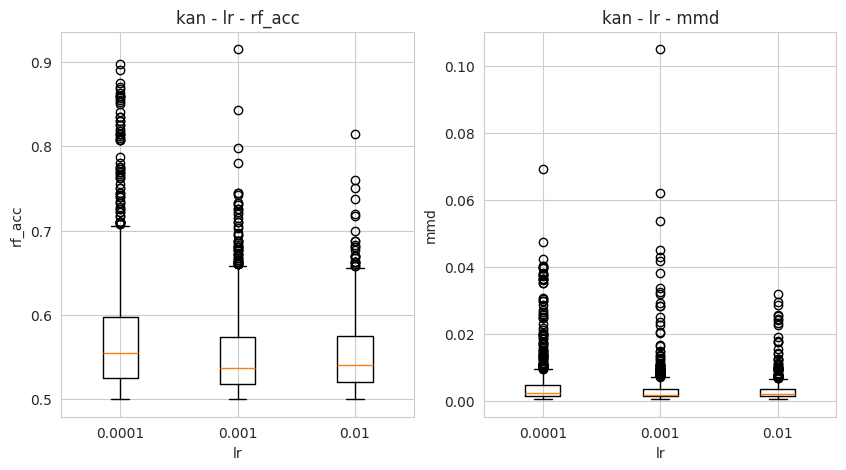



 kan - lr - Best parameter values selected for each dataset:
Value 0.0001: selected 8 times (72.7%)
Value 0.001: selected 6 times (54.5%)
Value 0.01: selected 12 times (109.1%)


 kan - lr - Mean and Median values:
╒════════╤════════════════════════════════╤════════════════════════════════╕
│     lr │ rf_acc                         │ mmd                            │
╞════════╪════════════════════════════════╪════════════════════════════════╡
│ 0.0001 │ 0.5784 (mean), 0.5550 (median) │ 0.0048 (mean), 0.0024 (median) │
├────────┼────────────────────────────────┼────────────────────────────────┤
│ 0.001  │ 0.5541 (mean), 0.5375 (median) │ 0.0035 (mean), 0.0019 (median) │
├────────┼────────────────────────────────┼────────────────────────────────┤
│ 0.01   │ 0.5524 (mean), 0.5400 (median) │ 0.0031 (mean), 0.0021 (median) │
╘════════╧════════════════════════════════╧════════════════════════════════╛


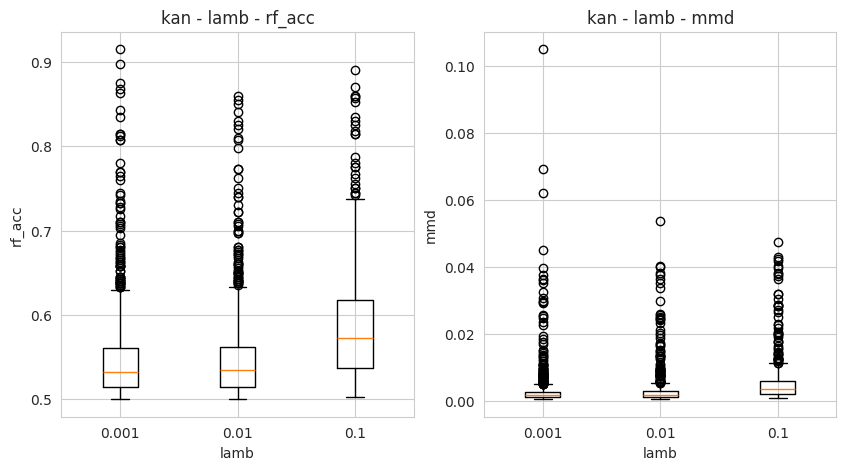



 kan - lamb - Best parameter values selected for each dataset:
Value 0.001: selected 16 times (145.5%)
Value 0.01: selected 6 times (54.5%)
Value 0.1: selected 4 times (36.4%)


 kan - lamb - Mean and Median values:
╒════════╤════════════════════════════════╤════════════════════════════════╕
│   lamb │ rf_acc                         │ mmd                            │
╞════════╪════════════════════════════════╪════════════════════════════════╡
│  0.001 │ 0.5500 (mean), 0.5325 (median) │ 0.0032 (mean), 0.0017 (median) │
├────────┼────────────────────────────────┼────────────────────────────────┤
│  0.01  │ 0.5496 (mean), 0.5350 (median) │ 0.0031 (mean), 0.0017 (median) │
├────────┼────────────────────────────────┼────────────────────────────────┤
│  0.1   │ 0.5853 (mean), 0.5725 (median) │ 0.0051 (mean), 0.0035 (median) │
╘════════╧════════════════════════════════╧════════════════════════════════╛


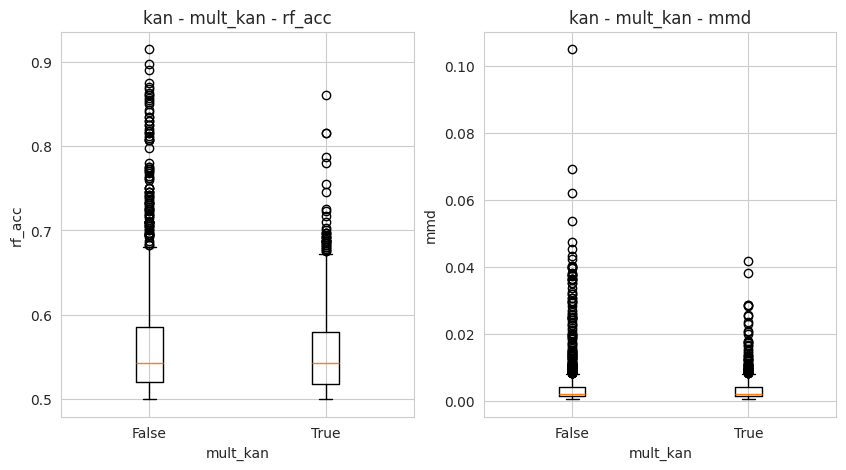



 kan - mult_kan - Best parameter values selected for each dataset:
Value False: selected 14 times (127.3%)
Value True: selected 12 times (109.1%)


 kan - mult_kan - Mean and Median values:
╒════════════╤════════════════════════════════╤════════════════════════════════╕
│ mult_kan   │ rf_acc                         │ mmd                            │
╞════════════╪════════════════════════════════╪════════════════════════════════╡
│ False      │ 0.5637 (mean), 0.5425 (median) │ 0.0040 (mean), 0.0021 (median) │
├────────────┼────────────────────────────────┼────────────────────────────────┤
│ True       │ 0.5574 (mean), 0.5425 (median) │ 0.0035 (mean), 0.0021 (median) │
╘════════════╧════════════════════════════════╧════════════════════════════════╛


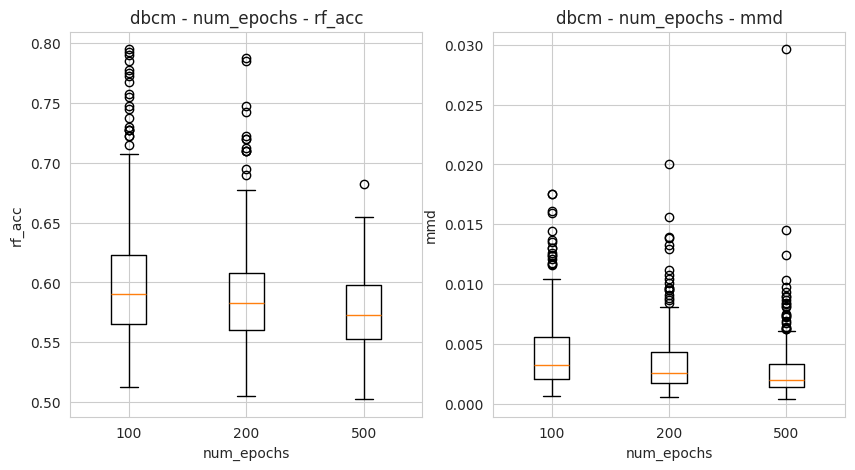



 dbcm - num_epochs - Best parameter values selected for each dataset:
Value 100: selected 4 times (36.4%)
Value 200: selected 3 times (27.3%)
Value 500: selected 4 times (36.4%)


 dbcm - num_epochs - Mean and Median values:
╒══════════════╤════════════════════════════════╤════════════════════════════════╕
│   num_epochs │ rf_acc                         │ mmd                            │
╞══════════════╪════════════════════════════════╪════════════════════════════════╡
│          100 │ 0.6019 (mean), 0.5900 (median) │ 0.0043 (mean), 0.0032 (median) │
├──────────────┼────────────────────────────────┼────────────────────────────────┤
│          200 │ 0.5890 (mean), 0.5825 (median) │ 0.0034 (mean), 0.0025 (median) │
├──────────────┼────────────────────────────────┼────────────────────────────────┤
│          500 │ 0.5761 (mean), 0.5725 (median) │ 0.0028 (mean), 0.0020 (median) │
╘══════════════╧════════════════════════════════╧════════════════════════════════╛


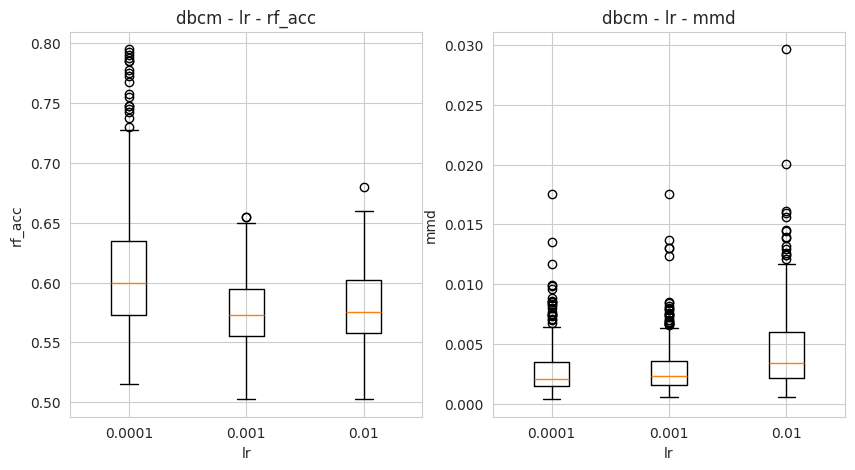



 dbcm - lr - Best parameter values selected for each dataset:
Value 0.0001: selected 0 times (0.0%)
Value 0.001: selected 5 times (45.5%)
Value 0.01: selected 6 times (54.5%)


 dbcm - lr - Mean and Median values:
╒════════╤════════════════════════════════╤════════════════════════════════╕
│     lr │ rf_acc                         │ mmd                            │
╞════════╪════════════════════════════════╪════════════════════════════════╡
│ 0.0001 │ 0.6119 (mean), 0.6000 (median) │ 0.0029 (mean), 0.0021 (median) │
├────────┼────────────────────────────────┼────────────────────────────────┤
│ 0.001  │ 0.5754 (mean), 0.5725 (median) │ 0.0030 (mean), 0.0023 (median) │
├────────┼────────────────────────────────┼────────────────────────────────┤
│ 0.01   │ 0.5798 (mean), 0.5750 (median) │ 0.0046 (mean), 0.0034 (median) │
╘════════╧════════════════════════════════╧════════════════════════════════╛


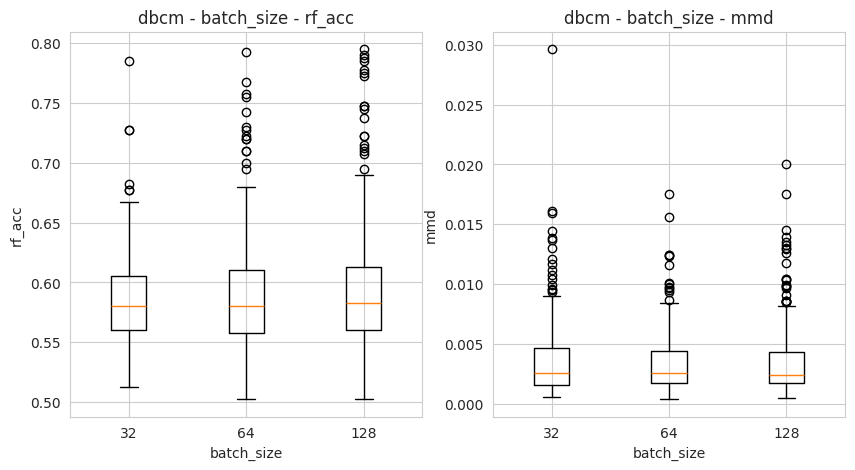



 dbcm - batch_size - Best parameter values selected for each dataset:
Value 32: selected 2 times (18.2%)
Value 64: selected 5 times (45.5%)
Value 128: selected 4 times (36.4%)


 dbcm - batch_size - Mean and Median values:
╒══════════════╤════════════════════════════════╤════════════════════════════════╕
│   batch_size │ rf_acc                         │ mmd                            │
╞══════════════╪════════════════════════════════╪════════════════════════════════╡
│           32 │ 0.5861 (mean), 0.5800 (median) │ 0.0036 (mean), 0.0025 (median) │
├──────────────┼────────────────────────────────┼────────────────────────────────┤
│           64 │ 0.5878 (mean), 0.5800 (median) │ 0.0033 (mean), 0.0026 (median) │
├──────────────┼────────────────────────────────┼────────────────────────────────┤
│          128 │ 0.5931 (mean), 0.5825 (median) │ 0.0035 (mean), 0.0024 (median) │
╘══════════════╧════════════════════════════════╧════════════════════════════════╛


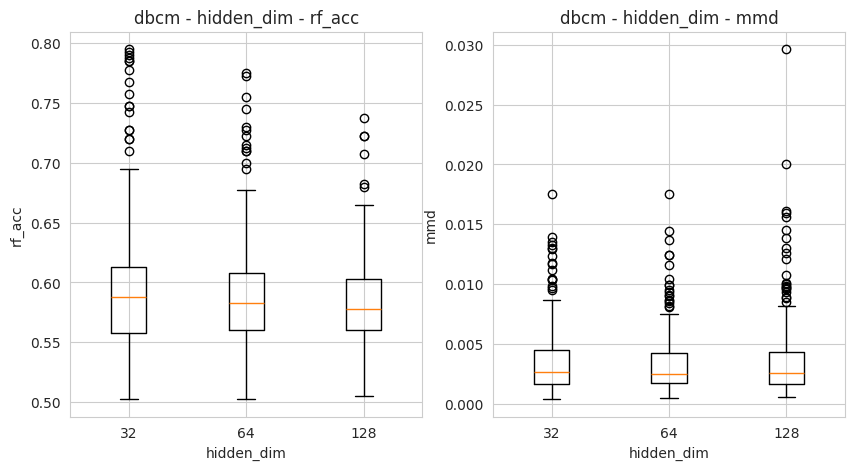



 dbcm - hidden_dim - Best parameter values selected for each dataset:
Value 32: selected 4 times (36.4%)
Value 64: selected 4 times (36.4%)
Value 128: selected 3 times (27.3%)


 dbcm - hidden_dim - Mean and Median values:
╒══════════════╤════════════════════════════════╤════════════════════════════════╕
│   hidden_dim │ rf_acc                         │ mmd                            │
╞══════════════╪════════════════════════════════╪════════════════════════════════╡
│           32 │ 0.5939 (mean), 0.5875 (median) │ 0.0035 (mean), 0.0027 (median) │
├──────────────┼────────────────────────────────┼────────────────────────────────┤
│           64 │ 0.5886 (mean), 0.5825 (median) │ 0.0034 (mean), 0.0025 (median) │
├──────────────┼────────────────────────────────┼────────────────────────────────┤
│          128 │ 0.5845 (mean), 0.5775 (median) │ 0.0036 (mean), 0.0025 (median) │
╘══════════════╧════════════════════════════════╧════════════════════════════════╛


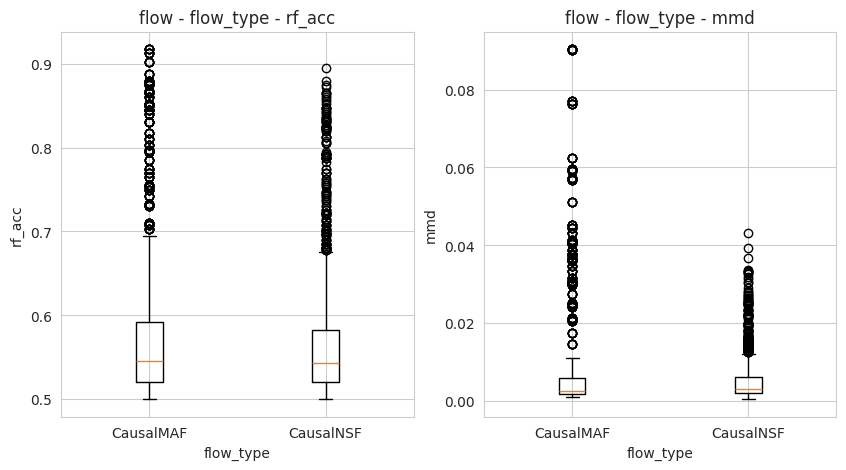



 flow - flow_type - Best parameter values selected for each dataset:
Value CausalMAF: selected 1 times (9.1%)
Value CausalNSF: selected 10 times (90.9%)


 flow - flow_type - Mean and Median values:
╒═════════════╤════════════════════════════════╤════════════════════════════════╕
│ flow_type   │ rf_acc                         │ mmd                            │
╞═════════════╪════════════════════════════════╪════════════════════════════════╡
│ CausalMAF   │ 0.5972 (mean), 0.5450 (median) │ 0.0112 (mean), 0.0025 (median) │
├─────────────┼────────────────────────────────┼────────────────────────────────┤
│ CausalNSF   │ 0.5764 (mean), 0.5425 (median) │ 0.0059 (mean), 0.0030 (median) │
╘═════════════╧════════════════════════════════╧════════════════════════════════╛


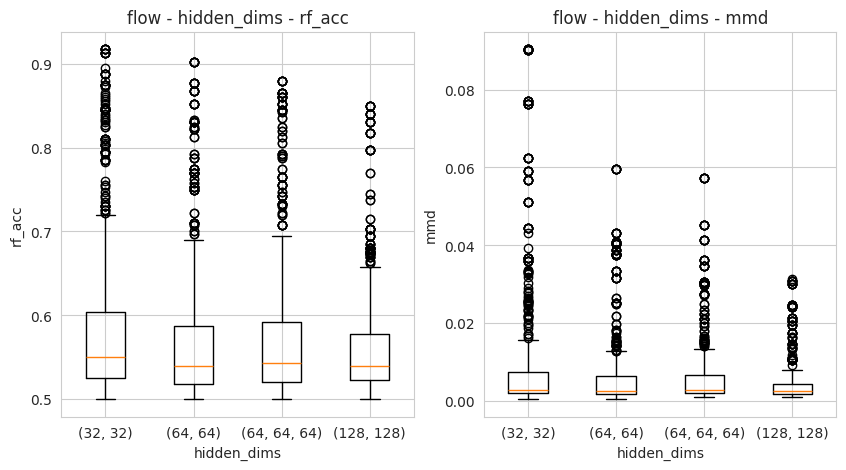



 flow - hidden_dims - Best parameter values selected for each dataset:
Value (32, 32): selected 6 times (54.5%)
Value (64, 64): selected 5 times (45.5%)
Value (64, 64, 64): selected 0 times (0.0%)
Value (128, 128): selected 0 times (0.0%)


 flow - hidden_dims - Mean and Median values:
╒═══════════════╤════════════════════════════════╤════════════════════════════════╕
│ hidden_dims   │ rf_acc                         │ mmd                            │
╞═══════════════╪════════════════════════════════╪════════════════════════════════╡
│ (32, 32)      │ 0.6010 (mean), 0.5500 (median) │ 0.0126 (mean), 0.0029 (median) │
├───────────────┼────────────────────────────────┼────────────────────────────────┤
│ (64, 64)      │ 0.5860 (mean), 0.5400 (median) │ 0.0082 (mean), 0.0027 (median) │
├───────────────┼────────────────────────────────┼────────────────────────────────┤
│ (64, 64, 64)  │ 0.5876 (mean), 0.5425 (median) │ 0.0080 (mean), 0.0028 (median) │
├───────────────┼──────────────────────

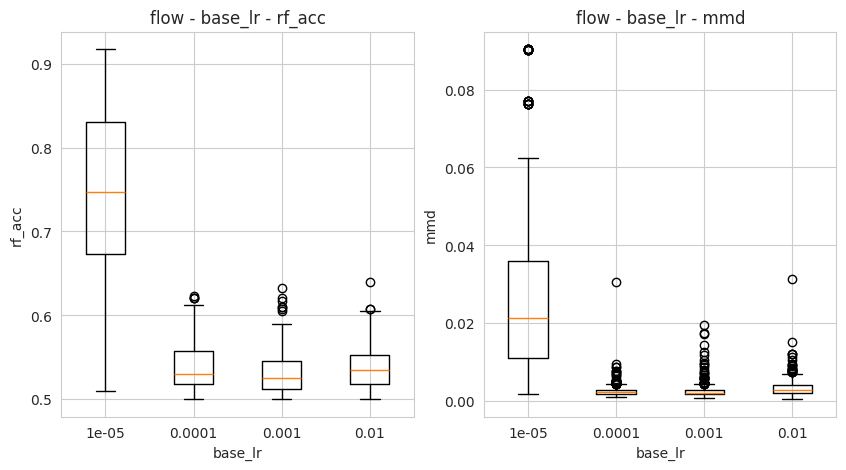



 flow - base_lr - Best parameter values selected for each dataset:
Value 1e-05: selected 0 times (0.0%)
Value 0.0001: selected 2 times (18.2%)
Value 0.001: selected 8 times (72.7%)
Value 0.01: selected 1 times (9.1%)


 flow - base_lr - Mean and Median values:
╒═══════════╤════════════════════════════════╤════════════════════════════════╕
│   base_lr │ rf_acc                         │ mmd                            │
╞═══════════╪════════════════════════════════╪════════════════════════════════╡
│    1e-05  │ 0.7394 (mean), 0.7475 (median) │ 0.0255 (mean), 0.0213 (median) │
├───────────┼────────────────────────────────┼────────────────────────────────┤
│    0.0001 │ 0.5387 (mean), 0.5300 (median) │ 0.0026 (mean), 0.0023 (median) │
├───────────┼────────────────────────────────┼────────────────────────────────┤
│    0.001  │ 0.5311 (mean), 0.5250 (median) │ 0.0026 (mean), 0.0021 (median) │
├───────────┼────────────────────────────────┼────────────────────────────────┤
│    0.01   │ 0.5

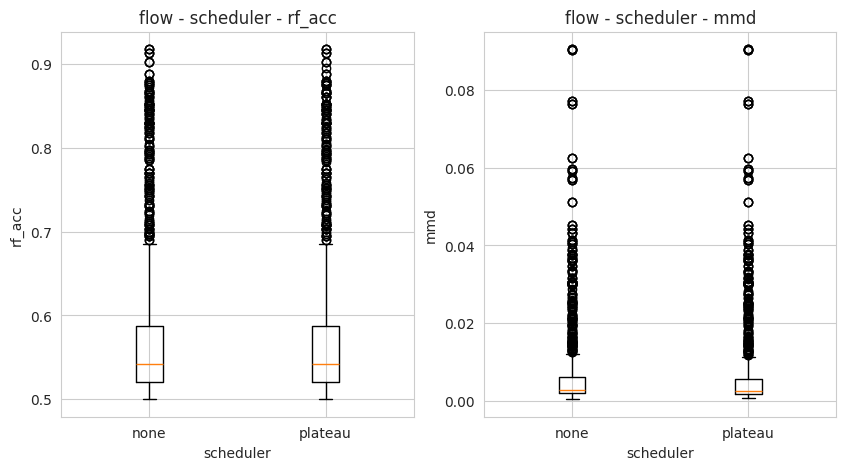



 flow - scheduler - Best parameter values selected for each dataset:
Value none: selected 0 times (0.0%)
Value plateau: selected 5 times (45.5%)


 flow - scheduler - Mean and Median values:
╒═════════════╤════════════════════════════════╤════════════════════════════════╕
│ scheduler   │ rf_acc                         │ mmd                            │
╞═════════════╪════════════════════════════════╪════════════════════════════════╡
│ none        │ 0.5870 (mean), 0.5425 (median) │ 0.0086 (mean), 0.0028 (median) │
├─────────────┼────────────────────────────────┼────────────────────────────────┤
│ plateau     │ 0.5865 (mean), 0.5425 (median) │ 0.0084 (mean), 0.0028 (median) │
╘═════════════╧════════════════════════════════╧════════════════════════════════╛


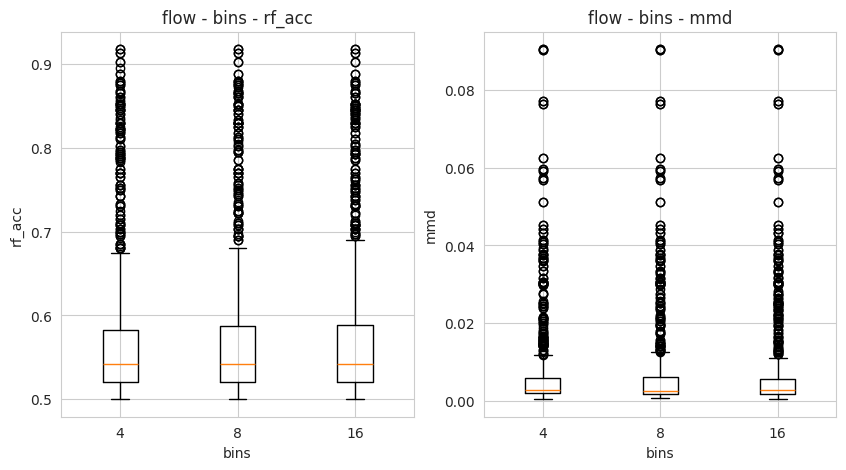



 flow - bins - Best parameter values selected for each dataset:
Value 4: selected 5 times (45.5%)
Value 8: selected 5 times (45.5%)
Value 16: selected 1 times (9.1%)


 flow - bins - Mean and Median values:
╒════════╤════════════════════════════════╤════════════════════════════════╕
│   bins │ rf_acc                         │ mmd                            │
╞════════╪════════════════════════════════╪════════════════════════════════╡
│      4 │ 0.5854 (mean), 0.5425 (median) │ 0.0084 (mean), 0.0029 (median) │
├────────┼────────────────────────────────┼────────────────────────────────┤
│      8 │ 0.5862 (mean), 0.5425 (median) │ 0.0084 (mean), 0.0027 (median) │
├────────┼────────────────────────────────┼────────────────────────────────┤
│     16 │ 0.5886 (mean), 0.5425 (median) │ 0.0087 (mean), 0.0028 (median) │
╘════════╧════════════════════════════════╧════════════════════════════════╛


In [13]:
# Ablation studies: for each parameter and model, show the dispersion of the values (discrete experiments)
datasets = ['3-chain-linear', '3-chain-non-linear', '4-chain-linear', '5-chain-linear', 'collider-linear',
            'fork-linear', 'fork-non-linear', 'simpson-non-linear', 'simpson-symprod', 'triangle-linear',
            'triangle-non-linear']  # Datasets used for evaluation
metrics = ['rf_acc', 'mmd']  # Metrics used for evaluation
model_params = {'kan_mixed': ['hidden_dim', 'grid', 'k', 'lr', 'lamb', 'mult_kan'],
                'kan': ['hidden_dim', 'grid', 'k', 'lr', 'lamb', 'mult_kan'],
                'dbcm': ['num_epochs', 'lr', 'batch_size', 'hidden_dim'],
                'flow': ['flow_type', 'hidden_dims', 'base_lr', 'scheduler', 'bins']}

results_bdir = str(get_experiment_paths('discrete').root)
data_dir = os.path.join(results_bdir, 'data')

for model_name in model_params.keys():
    for param in model_params[model_name]:
        param_values = []
        param_results = {}
        best_param_values = []
        for dataset in datasets:
            fname = os.path.join(data_dir, f"best_params_{model_name}_{dataset}.pkl")
            if os.path.exists(fname):
                with open(fname, 'rb') as f:
                    results = pickle.load(f)
                results_all = results['results_all']
                if model_name in ['kan', 'kan_mixed']:
                    best_param_values.extend([results['best_params'][node][param] for node in results['best_params'].keys()])
                else:
                    best_param_values.append(results['best_params'][param])
                for r in results_all:
                    if len(param_values) == 0:  # Initialize the param_values list with the unique values of the parameter
                        param_values = list(set([r[0][param] for r in results_all]))
                        # replace a possible None by a string 'none'
                        param_values = [p if p is not None else 'none' for p in param_values]
                        param_values.sort()
                        for v in param_values:
                            param_results[v] = {m: [] for m in metrics}
                    for imetric, m in enumerate(metrics):
                        pn = r[0][param] if r[0][param] is not None else 'none'
                        param_results[pn][m].append(r[0][m]['all'])
        # Prepare a boxplot for each metric, containing all the parameter values
        plt.subplots(1, len(metrics), figsize=(5 * len(metrics), 5))
        for imetric, m in enumerate(metrics):
            plt.subplot(1, len(metrics), imetric + 1)
            data = [param_results[v][m] for v in param_values]
            plt.boxplot(data, tick_labels=param_values)
            plt.title(f'{model_name} - {param} - {m}')
            plt.xlabel(param)
            plt.ylabel(m)
        plt.show()
        # Print best parameter values selected for the datasets (in all)
        print(f'\n\n {model_name} - {param} - Best parameter values selected for each dataset:')
        for v in param_values:
            count = best_param_values.count(v)
            print(f'Value {v}: selected {count} times ({count / len(datasets) * 100:.1f}%)')
        # Print mean and median values for each parameter value and metric
        table = []
        for v in param_values:
            row = [v]
            for imetric, m in enumerate(metrics):
                values = param_results[v][m]
                if len(values) > 0:
                    mean_val = np.mean(values)
                    median_val = np.median(values)
                    row.append(f'{mean_val:.4f} (mean), {median_val:.4f} (median)')
                else:
                    row.append('N/A')
            table.append(row)
        print(f'\n\n {model_name} - {param} - Mean and Median values:')
        print(tabulate(table, headers=[param] + metrics, tablefmt="fancy_grid"))



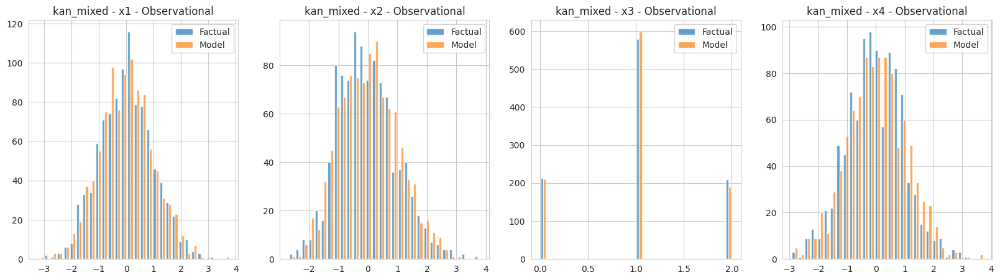

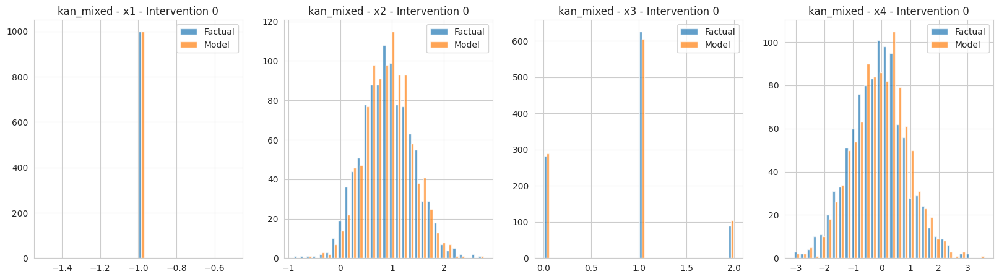

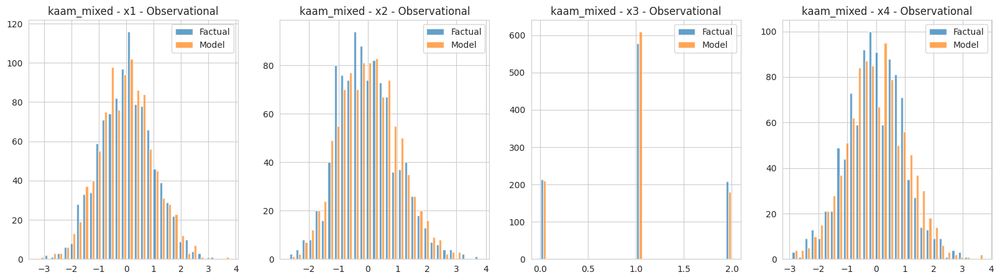

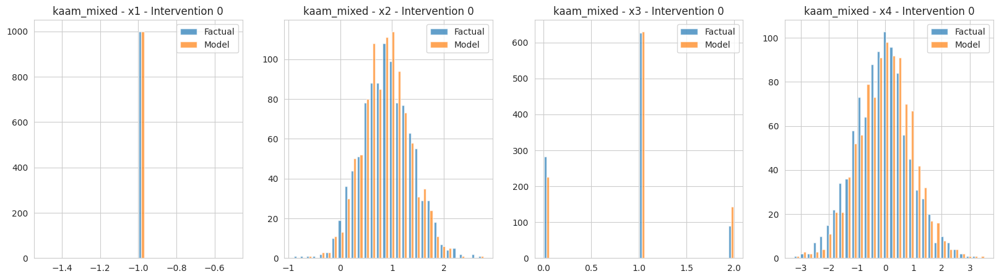

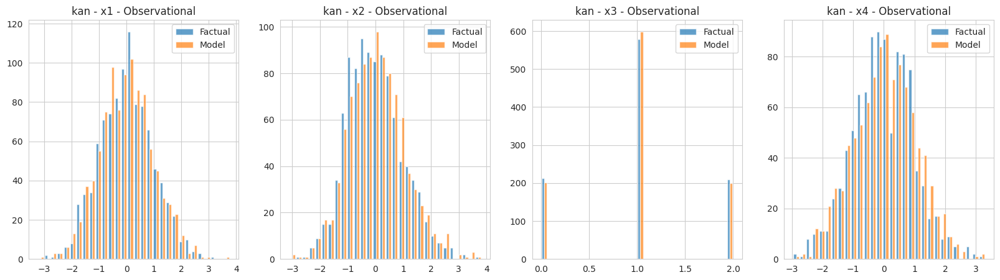

...

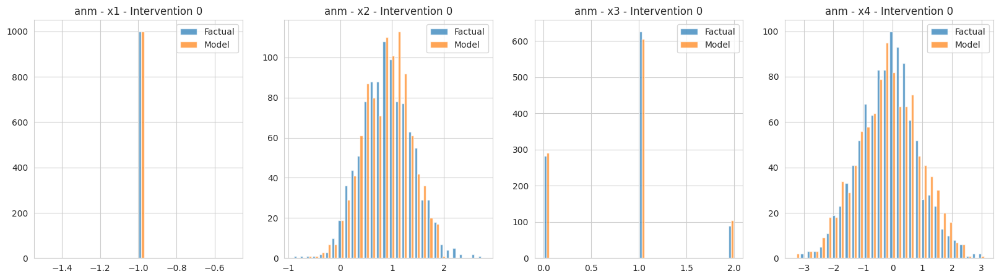

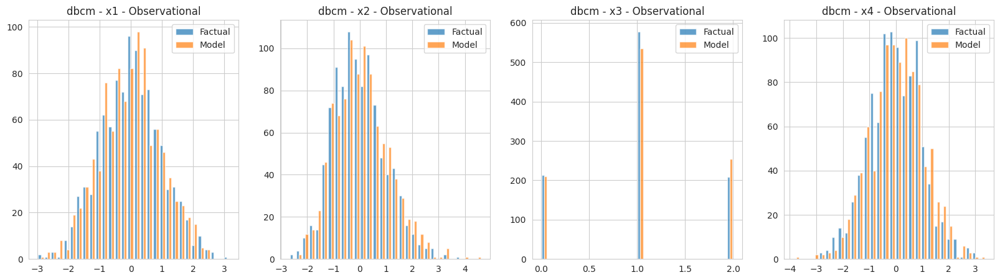

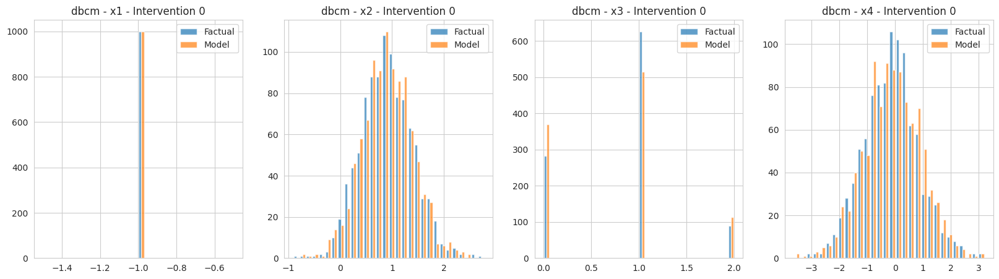

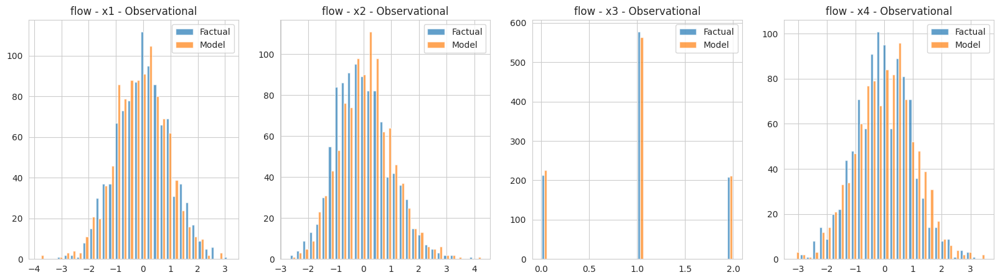

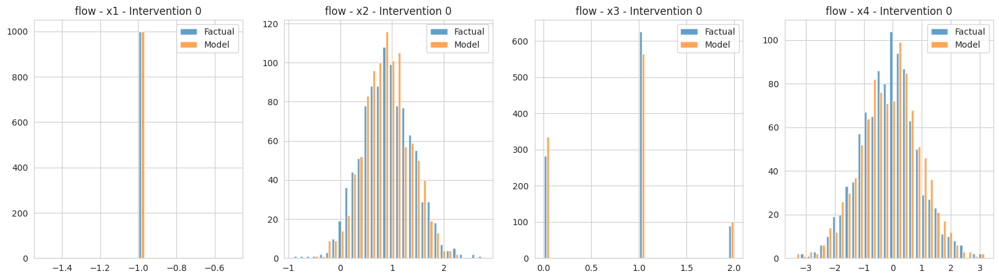

In [24]:
# Put one example of the distributions of observational and interventional samples for one dataset and n, for all models
results_bdir = str(get_experiment_paths('discrete').root)
samples_dir = os.path.join(results_bdir, 'samples')
dataset = 'simpson-non-linear'
n = 1000
n_interventions = 1  # Max number of interventions is 6

model_names = ['kan_mixed', 'kaam_mixed', 'kan', 'kaam', 'anm', 'dbcm', 'flow']  # Models used for evaluation

factual_eval = pd.read_csv(os.path.join(samples_dir, f"{dataset}_factual_eval_d_n_{n}.csv"))
cf_eval = [pd.read_csv(os.path.join(samples_dir, f"{dataset}_cf_eval_d_n_{n}_{i}.csv")) for i in range(n_interventions)]

for model_name in model_names:
    obs_model = pd.read_csv(os.path.join(samples_dir, f"{dataset}_obs_samples_n_{n}_{model_name}.csv"))
    int_model = [pd.read_csv(os.path.join(samples_dir, f"{dataset}_int_samples_n_{n}_{model_name}_{i}.csv")) for i in range(n_interventions)]
    nodes = factual_eval.columns

    plt.subplots(1, len(nodes), figsize=(5 * len(nodes), 5))
    for i, node in enumerate(nodes):
        plt.subplot(1, len(nodes), i + 1)
        plt.hist([factual_eval[node], obs_model[node]], bins=30, label=['Factual', 'Model'], alpha=0.7)
        plt.title(f'{model_name} - {node} - Observational')
        plt.legend(loc='best')

    for intervention in range(n_interventions):
        plt.subplots(1, len(nodes), figsize=(5 * len(nodes), 5))

        for i, node in enumerate(nodes):
            plt.subplot(1, len(nodes), i + 1)
            plt.hist([cf_eval[intervention][node], int_model[intervention][node]], bins=30, label=['Factual', 'Model'], alpha=0.7)
            plt.title(f'{model_name} - {node} - Intervention {intervention}')
            plt.legend(loc='best')

    plt.show()

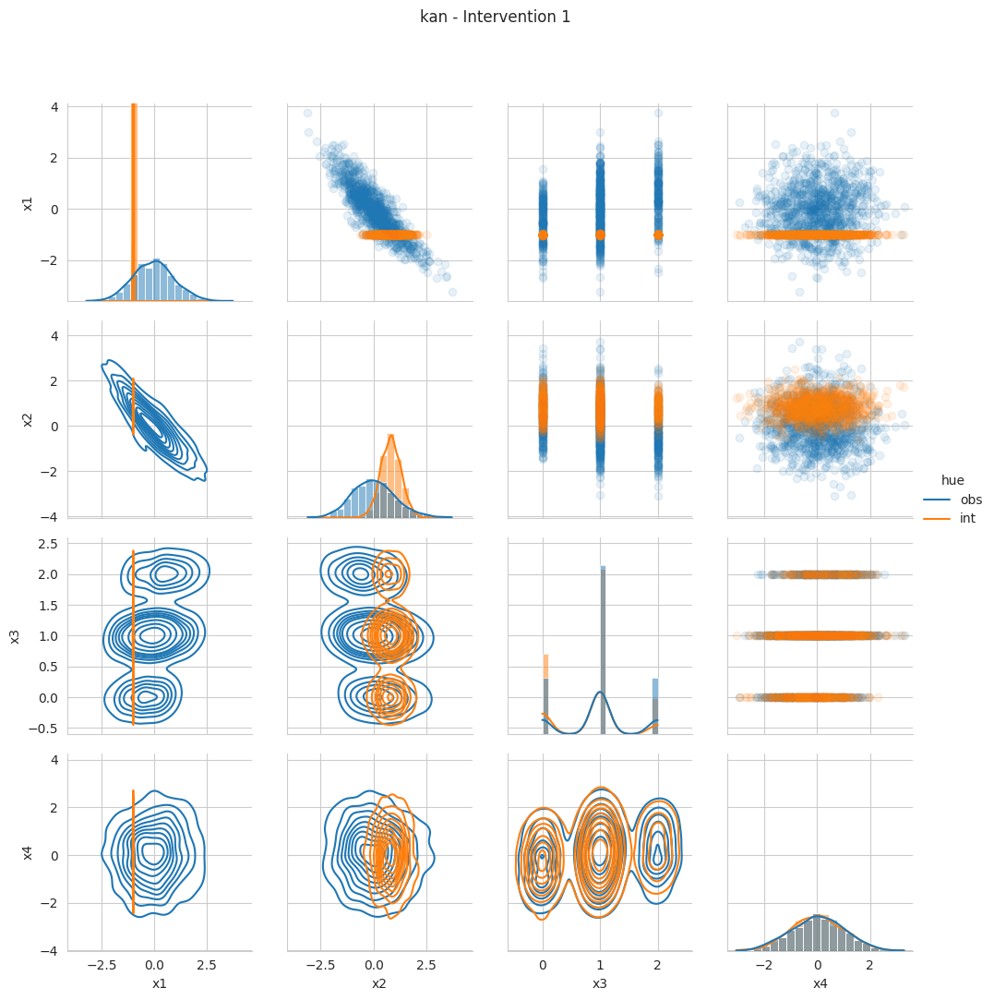

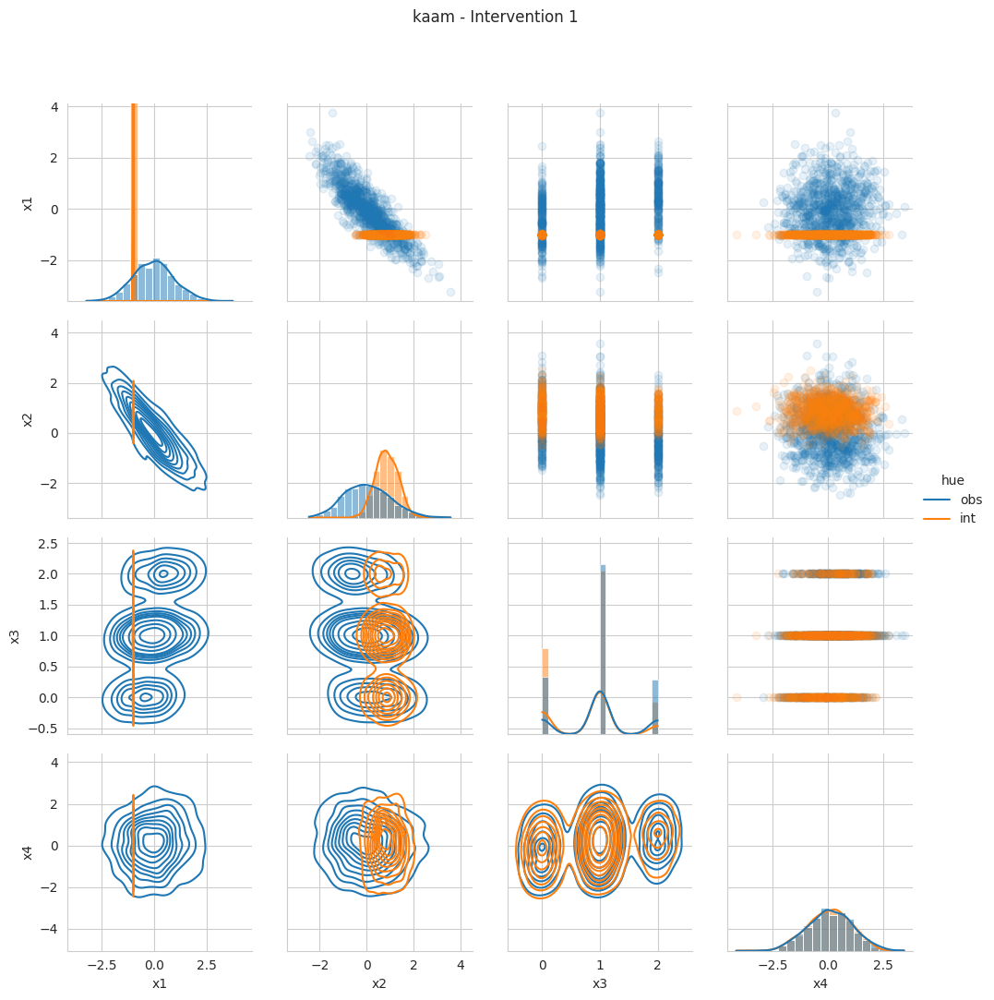

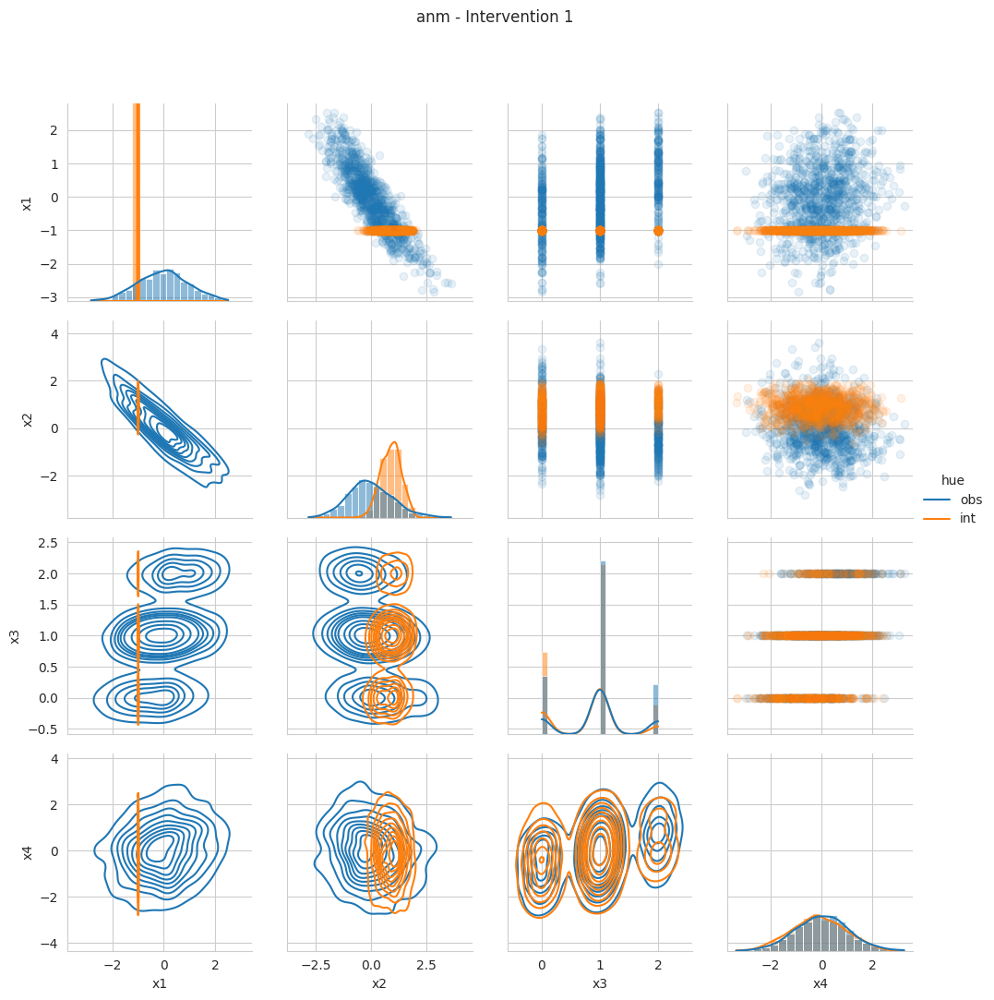

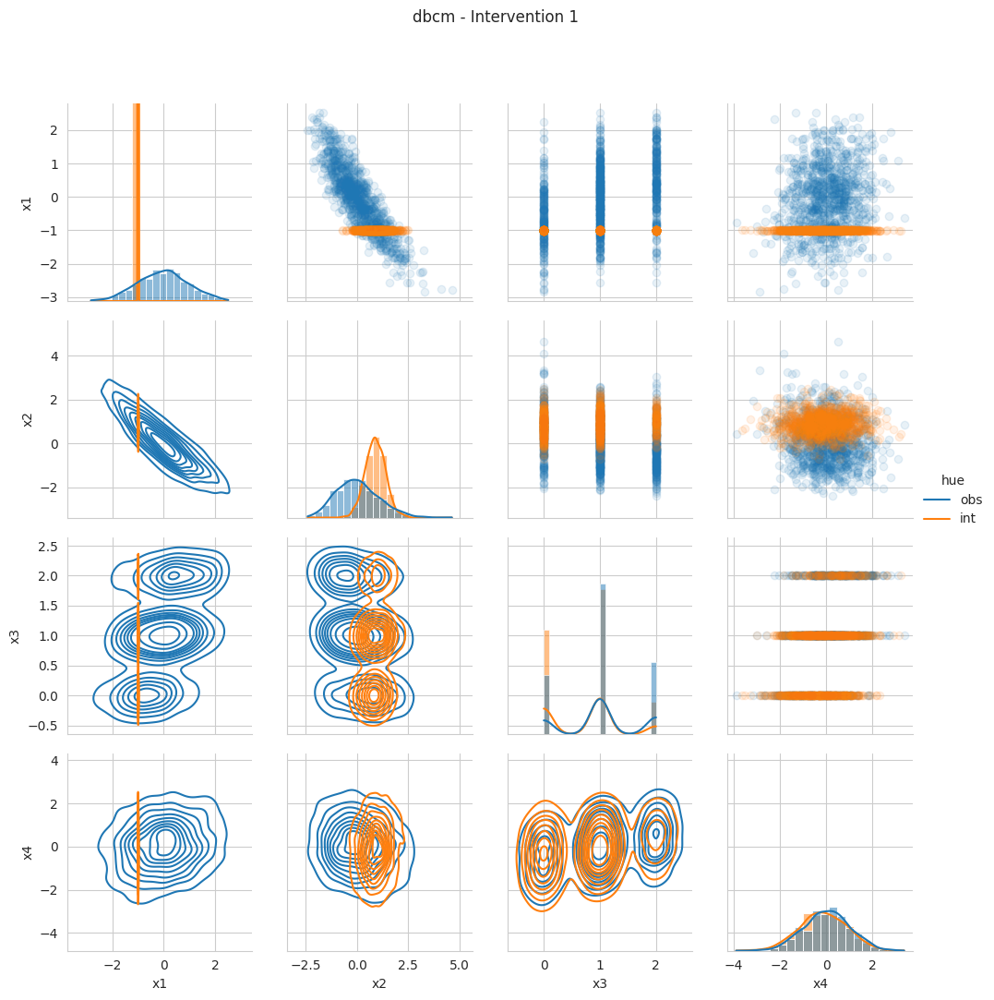

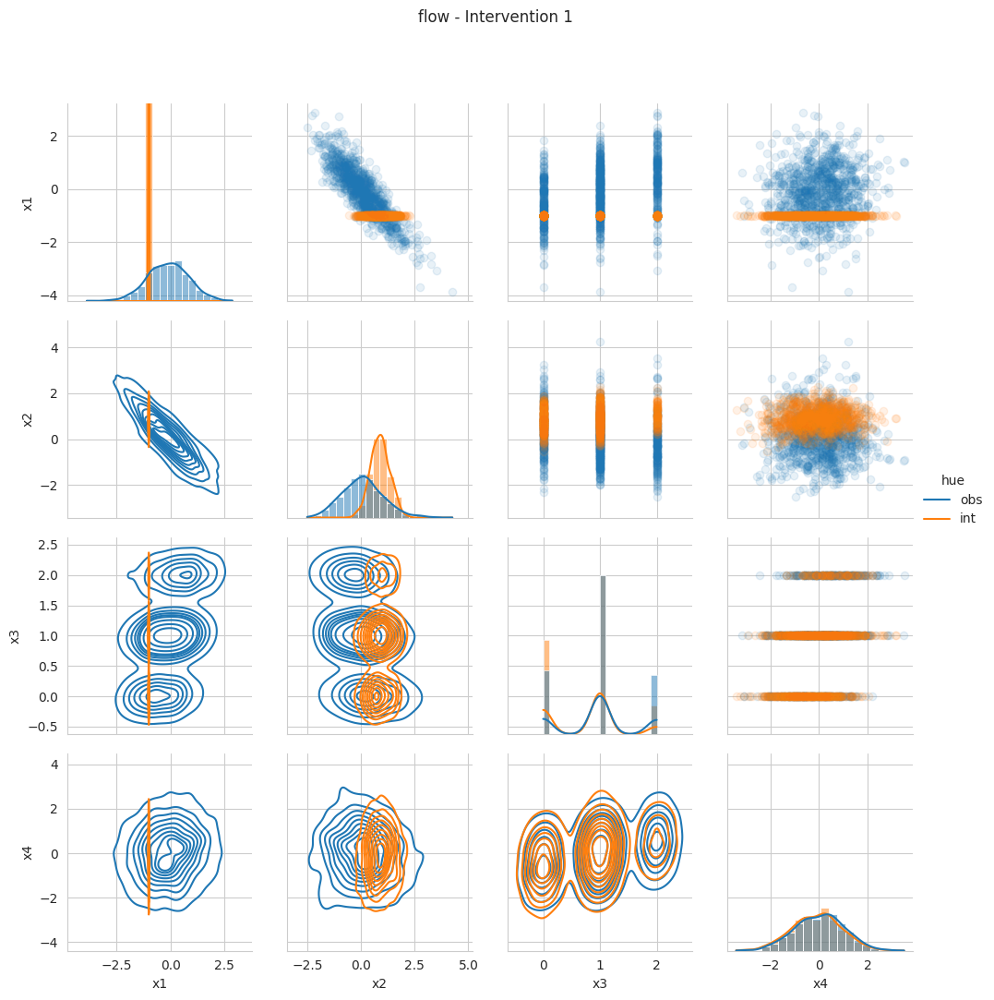

In [25]:
# Put one example of the distributions of observational, interventional and counterfactual samples for one dataset and n, for all models
results_bdir = str(get_experiment_paths('discrete').root)
samples_dir = os.path.join(results_bdir, 'samples')
dataset = 'simpson-non-linear'
n = 1000
n_interventions = 1  # Number of interventions that we have, max is 6

model_names = ['kan', 'kaam', 'anm', 'dbcm', 'flow']  # Models used for evaluation

factual_eval = pd.read_csv(os.path.join(samples_dir, f"{dataset}_factual_eval_d_n_{n}.csv"))

for model_name in model_names:
    obs_model = pd.read_csv(os.path.join(samples_dir, f"{dataset}_obs_samples_n_{n}_{model_name}.csv"))
    int_model = [pd.read_csv(os.path.join(samples_dir, f"{dataset}_int_samples_n_{n}_{model_name}_{intervention}.csv")) for intervention in range(n_interventions)]
    nodes = factual_eval.columns

    obs_model['hue'] = 'obs'
    for intervention in range(n_interventions):
        int_model[intervention]['hue'] = f'int'
        # Add a little noise to x1, x2, x3 for the KDE (these are the intervened/discrete variables, done to prevent errors in KDE)
        int_model[intervention]['x1'] += 0.01 * np.random.randn(len(int_model[intervention]))
        int_model[intervention]['x2'] += 0.01 * np.random.randn(len(int_model[intervention]))
        #int_model[intervention]['x3'] += 0.01 * np.random.randn(len(int_model[intervention]))
        data = pd.concat([obs_model, int_model[intervention]], ignore_index=True)
        #g = sns.pairplot(data=data, hue='hue', diag_kind='hist', diag_kws=dict(stat='count', kde=True))
        #g.map_upper(sns.kdeplot, levels=4, hue='hue')

        g = sns.PairGrid(data, hue='hue')
        g.map_upper(plt.scatter, alpha=0.1)
        g.map_lower(sns.kdeplot, common_norm=False)
        g.map_diag(sns.histplot, kde=True, stat='proportion', common_norm=False, bins=20, alpha=0.5)
        _ = g.add_legend()

        for i in range(len(nodes)):
            g.diag_axes[i].set_ylim((0, 0.7)) # NOTE: carefully adjust this to obtain meaningful plots, i.e., the intervention, being discrete, causes a mess
        g.figure.suptitle(f'{model_name} - Intervention {intervention + 1}', y=1.08)
        plt.show()
